# Kidney Disease Prediction

## The Lifecycle In A Data Science Projects


### 1. Data Gathering
1. Problem Identification/problem understanding
2.	Data collection
3.	Train Val Test split
4.	Just look at the data/try to get a sense of the data/Understand the data
5.	Data cleaning

### 2.EDA

6.	Univariate Analysis
7.	Bi-variate Analysis
8.	Explore Numerical features
9.	Explore Categorical features

### 3.Feature Engineering

10.	Handing Missing values
11.	Handling Outliers
12. Feature transformation
13. Categorical Feature Encoding
14.	Feature scaling
15.	Imbalanced dataset

### 4.Model building

### 5.Feature Selection
16.	Feature Importance
17.	Feature Selection

### 6.Model Evaluation

### 7.Model Saving

### 8.Model Deployment

### 1.Problem Identification/problem understanding

#### Here the problem/challenge is to predict whether a person have the diabeties or not given the relevent parameters

### 2.Data collection
https://www.kaggle.com/datasets/mansoordaku/ckdisease


### Content

The data was taken over a 2-month period in India with 25 features ( eg, red blood cell count, white blood cell count, etc). The target is the 'classification', which is either 'ckd' or 'notckd' - ckd=chronic kidney disease. There are 400 rows


### Acknowledgements
The dataset is available at: https://archive.ics.uci.edu/ml/datasets/Chronic_Kidney_Disease

### Inspiration / Task
I would like to get an intuitive and a practical understanding of PCA.

#### The dataset is taken from Kaggle 


In [2]:
## Importing the required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.utils import shuffle

# to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# setting the plot style 
# plt.style.use('ggplot')
sns.set_style('darkgrid')

# To display all the columns of the dataframe
pd.pandas.set_option('display.max_columns',None)

### 3.Train Test split

#### It's a very good practice to split the data into train and test sets as soon as you get the data to avoid overfitting of the model and data leakage.

In [3]:
# Load the data

df = pd.read_csv('../Data/Kidney/kidney.csv')

In [4]:
df

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,NaN,NaN,9.6,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,NaN,NaN,11.6,35,7300,4.6,no,no,no,good,no,no,ckd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,395,55.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,140.0,49.0,0.5,150.0,4.9,15.7,47,6700,4.9,no,no,no,good,no,no,notckd
396,396,42.0,70.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,75.0,31.0,1.2,141.0,3.5,16.5,54,7800,6.2,no,no,no,good,no,no,notckd
397,397,12.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,100.0,26.0,0.6,137.0,4.4,15.8,49,6600,5.4,no,no,no,good,no,no,notckd
398,398,17.0,60.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,114.0,50.0,1.0,135.0,4.9,14.2,51,7200,5.9,no,no,no,good,no,no,notckd


In [5]:
df.shape

(400, 26)

In [6]:
df.isnull().sum()

# seems too many null values

id                  0
age                 9
bp                 12
sg                 47
al                 46
su                 49
rbc               152
pc                 65
pcc                 4
ba                  4
bgr                44
bu                 19
sc                 17
sod                87
pot                88
hemo               52
pcv                70
wc                105
rc                130
htn                 2
dm                  2
cad                 2
appet               1
pe                  1
ane                 1
classification      0
dtype: int64

In [7]:
# Dropping all the rows which doesn't have atleast 20 non null values 

df.dropna(thresh=20,inplace=True)

In [9]:
df.shape

# Seems we losts around 51 records

(349, 26)

In [10]:
df.classification.value_counts()

ckd       197
notckd    150
ckd\t       2
Name: classification, dtype: int64

In [12]:
# Renaming the 'Outcome' feature to 'target' for the ease of analysis

df.rename(columns = {'classification':'target'}, inplace = True)

In [13]:
df[df.target == 'ckd\t']

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
37,37,72.0,80.0,NaN,NaN,NaN,NaN,NaN,notpresent,notpresent,137.0,65.0,3.4,141.0,4.7,9.7,28,6900,2.5,yes,yes,no,poor,no,yes,ckd\t
230,230,65.0,60.0,1.01,2.0,0.0,normal,abnormal,present,notpresent,192.0,17.0,1.7,130.0,4.3,NaN,NaN,9500,NaN,yes,yes,no,poor,no,no,ckd\t


In [14]:
df

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,NaN,NaN,9.6,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,NaN,NaN,11.6,35,7300,4.6,no,no,no,good,no,no,ckd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,395,55.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,140.0,49.0,0.5,150.0,4.9,15.7,47,6700,4.9,no,no,no,good,no,no,notckd
396,396,42.0,70.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,75.0,31.0,1.2,141.0,3.5,16.5,54,7800,6.2,no,no,no,good,no,no,notckd
397,397,12.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,100.0,26.0,0.6,137.0,4.4,15.8,49,6600,5.4,no,no,no,good,no,no,notckd
398,398,17.0,60.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,114.0,50.0,1.0,135.0,4.9,14.2,51,7200,5.9,no,no,no,good,no,no,notckd


In [15]:
# mapping target columns values to 0 and 1 
# Target: 'ckd' & 'ckd\t' - chronic kidney disease, notckd - not chronic kidney disease

df['target'] = df['target'].map({'ckd':1,'ckd\t':1,'notckd':0})

In [16]:
df.drop(['id'],axis=1,inplace=True)

In [19]:
df

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44,7800,5.2,yes,yes,no,good,no,no,1
1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38,6000,NaN,no,no,no,good,no,no,1
2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,NaN,NaN,9.6,31,7500,NaN,no,yes,no,poor,no,yes,1
3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32,6700,3.9,yes,no,no,poor,yes,yes,1
4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,NaN,NaN,11.6,35,7300,4.6,no,no,no,good,no,no,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,55.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,140.0,49.0,0.5,150.0,4.9,15.7,47,6700,4.9,no,no,no,good,no,no,0
396,42.0,70.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,75.0,31.0,1.2,141.0,3.5,16.5,54,7800,6.2,no,no,no,good,no,no,0
397,12.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,100.0,26.0,0.6,137.0,4.4,15.8,49,6600,5.4,no,no,no,good,no,no,0
398,17.0,60.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,114.0,50.0,1.0,135.0,4.9,14.2,51,7200,5.9,no,no,no,good,no,no,0


In [20]:
# sampling 50 instances from the original dataset for each testing, validation sets and the rest will be traing set

test_df = df.sample(n=50,random_state=5)
new_df = df.drop(test_df.index)
val_df = new_df.sample(n=50,random_state=5)
train_df = new_df.drop(val_df.index)

In [21]:
# resetting the index of train, val and test datasets

train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

In [22]:
train_df

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44,7800,5.2,yes,yes,no,good,no,no,1
1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38,6000,NaN,no,no,no,good,no,no,1
2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,NaN,NaN,9.6,31,7500,NaN,no,yes,no,poor,no,yes,1
3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32,6700,3.9,yes,no,no,poor,yes,yes,1
4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,NaN,NaN,11.6,35,7300,4.6,no,no,no,good,no,no,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,50.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,137.0,46.0,0.8,139.0,5.0,14.1,45,9500,4.6,no,no,no,good,no,no,0
245,55.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,140.0,49.0,0.5,150.0,4.9,15.7,47,6700,4.9,no,no,no,good,no,no,0
246,42.0,70.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,75.0,31.0,1.2,141.0,3.5,16.5,54,7800,6.2,no,no,no,good,no,no,0
247,12.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,100.0,26.0,0.6,137.0,4.4,15.8,49,6600,5.4,no,no,no,good,no,no,0


In [23]:
val_df

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,33.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,100.0,37.0,1.2,142.0,4.0,16.9,52,6700,6.0,no,no,no,good,no,no,0
1,65.0,60.0,1.015,1.0,0.0,NaN,normal,notpresent,notpresent,91.0,51.0,2.2,132.0,3.8,10.0,32,9100,4.0,yes,yes,no,poor,yes,no,1
2,73.0,90.0,1.015,3.0,0.0,NaN,abnormal,present,notpresent,107.0,33.0,1.5,141.0,4.6,10.1,30,7800,4,no,no,no,poor,no,no,1
3,53.0,100.0,1.010,1.0,3.0,abnormal,normal,notpresent,notpresent,213.0,23.0,1.0,139.0,4.0,NaN,NaN,NaN,NaN,no,yes,no,good,no,no,1
4,47.0,60.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,117.0,22.0,1.2,138.0,3.5,13.0,45,5200,5.6,no,no,no,good,no,no,0
5,61.0,80.0,1.015,0.0,4.0,NaN,normal,notpresent,notpresent,360.0,19.0,0.7,137.0,4.4,15.2,44,8300,5.2,yes,yes,no,good,no,no,1
6,32.0,60.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,102.0,17.0,0.4,147.0,4.7,14.6,41,6800,5.1,no,no,no,good,no,no,0
7,65.0,70.0,1.015,1.0,0.0,NaN,normal,notpresent,notpresent,203.0,46.0,1.4,NaN,NaN,11.4,36,5000,4.1,yes,yes,no,poor,yes,no,1
8,46.0,90.0,1.020,NaN,NaN,NaN,normal,notpresent,notpresent,213.0,68.0,2.8,146.0,6.3,9.3,NaN,NaN,NaN,yes,yes,no,good,no,no,1
9,66.0,70.0,1.015,2.0,5.0,NaN,normal,notpresent,notpresent,447.0,41.0,1.7,131.0,3.9,12.5,33,9600,4.4,yes,yes,no,good,no,no,1


In [24]:
test_df

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,48.0,80.0,1.005,4.0,0.0,abnormal,abnormal,notpresent,present,133.0,139.0,8.50,132.0,5.5,10.3,36,\t6200,4,no,yes,no,good,yes,no,1
1,62.0,70.0,1.025,3.0,0.0,normal,abnormal,notpresent,notpresent,122.0,42.0,1.70,136.0,4.7,12.6,39,7900,3.9,yes,yes,no,good,no,no,1
2,76.0,70.0,1.015,3.0,4.0,normal,abnormal,present,notpresent,NaN,164.0,9.70,131.0,4.4,10.2,30,11300,3.4,yes,yes,yes,poor,yes,no,1
3,51.0,100.0,1.015,2.0,0.0,normal,normal,notpresent,present,93.0,20.0,1.60,146.0,4.5,NaN,NaN,NaN,NaN,no,no,no,poor,no,no,1
4,79.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,111.0,44.0,1.20,146.0,3.6,16.3,40,8000,6.4,no,no,no,good,no,no,0
5,44.0,90.0,1.010,1.0,0.0,NaN,normal,notpresent,notpresent,NaN,20.0,1.10,NaN,NaN,15.0,48,NaN,NaN,no,\tno,no,good,no,no,1
6,61.0,60.0,1.025,0.0,0.0,NaN,normal,notpresent,notpresent,108.0,75.0,1.90,141.0,5.2,9.9,29,8400,3.7,yes,yes,no,good,no,yes,1
7,45.0,70.0,1.010,2.0,0.0,NaN,normal,notpresent,notpresent,113.0,93.0,2.30,NaN,NaN,7.9,26,5700,NaN,no,no,yes,good,no,yes,1
8,55.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,130.0,50.0,1.20,147.0,5.0,15.5,41,9100,6.0,no,no,no,good,no,no,0
9,61.0,80.0,1.020,0.0,0.0,NaN,normal,notpresent,notpresent,131.0,23.0,0.80,140.0,4.1,11.3,35,NaN,NaN,no,no,no,good,no,no,1


### 4.Explore the data/try to get a sense of the data

In [25]:
# head() - prints the first 5 rows/records

train_df.head()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44,7800,5.2,yes,yes,no,good,no,no,1
1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38,6000,NaN,no,no,no,good,no,no,1
2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,NaN,NaN,9.6,31,7500,NaN,no,yes,no,poor,no,yes,1
3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32,6700,3.9,yes,no,no,poor,yes,yes,1
4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,NaN,NaN,11.6,35,7300,4.6,no,no,no,good,no,no,1


In [26]:
# prints the shape of the dataframe (rows, columns)

train_df.shape

(249, 25)

In [27]:
# Prints the no.of rows, no.of colunmns, and each columns datatype and the no.of non-null values in each column

train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249 entries, 0 to 248
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     244 non-null    float64
 1   bp      241 non-null    float64
 2   sg      239 non-null    float64
 3   al      239 non-null    float64
 4   su      239 non-null    float64
 5   rbc     174 non-null    object 
 6   pc      229 non-null    object 
 7   pcc     245 non-null    object 
 8   ba      245 non-null    object 
 9   bgr     228 non-null    float64
 10  bu      244 non-null    float64
 11  sc      243 non-null    float64
 12  sod     204 non-null    float64
 13  pot     204 non-null    float64
 14  hemo    231 non-null    float64
 15  pcv     224 non-null    object 
 16  wc      204 non-null    object 
 17  rc      187 non-null    object 
 18  htn     248 non-null    object 
 19  dm      248 non-null    object 
 20  cad     248 non-null    object 
 21  appet   249 non-null    object 
 22  pe

#### Note : Its a very good practice to understand what each column represents / means by reading documents provided my subject matter expert or discusing with the domain expert if not do some reaserch. So that we can have an idea of how important each column/feature is and how to deal with thosemoving forward

#### -- Here we don't have much info from kaggle. we just have to understand by observing each columns data

#### -- And this data set is having 25 no.of features (including "target" ) and we must try to understand what each feature means so that it will be helpfull for us to do the better feature selection

In [28]:
# prints the list of collumns, yes its not exactly a list but Index type

train_df.columns

Index(['age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr', 'bu',
       'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad',
       'appet', 'pe', 'ane', 'target'],
      dtype='object')

In [29]:
train_df.isnull().sum()

age        5
bp         8
sg        10
al        10
su        10
rbc       75
pc        20
pcc        4
ba         4
bgr       21
bu         5
sc         6
sod       45
pot       45
hemo      18
pcv       25
wc        45
rc        62
htn        1
dm         1
cad        1
appet      0
pe         0
ane        0
target     0
dtype: int64

In [30]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

total = train_df.isnull().sum().sort_values(ascending=False)
percent = np.round_(((train_df.isnull().sum()/train_df.isnull().count())*100),decimals=1).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data


# See this is not good we have too many null values and the dataset is very small
# 5 features having more than 15% of the null values in them even though we dropped few rows earlier
# we will handle these in feature engineering

,Total,Percent
rbc,75,30.1
rc,62,24.9
sod,45,18.1
wc,45,18.1
pot,45,18.1
pcv,25,10.0
bgr,21,8.4
pc,20,8.0
hemo,18,7.2
sg,10,4.0


In [31]:
# prints the no.of unique values in each column

train_df.nunique().sort_values(ascending=False)

bgr       117
hemo      103
bu         89
wc         75
age        68
sc         61
rc         48
pcv        41
pot        36
sod        31
bp          8
su          6
al          6
sg          5
cad         3
ba          2
pcc         2
pc          2
rbc         2
htn         2
dm          2
appet       2
pe          2
ane         2
target      2
dtype: int64

In [32]:
# prints the count of category frequency of the target column

train_df['target'].value_counts(normalize=True)

1    0.582329
0    0.417671
Name: target, dtype: float64

### Observations :

1. From above we can see that few features data types are not represented properly and there are too many null values
2. Its very small dataset (349), we took 50 for each val,test sets.
3. dataset is almost balanced.

### Data Cleaning

In [33]:
# From above it seems [pcv,wc,rc] feattures datatypes are not represented properly. we will check those

In [34]:
train_df['pcv'].unique()

# see we got the 'culprit' --> '\t?' , this is for all three features

array(['44', '38', '31', '32', '35', '39', '36', '33', '29', '28', '16',
       '24', nan, '37', '30', '40', '45', '34', '27', '\t?', '52', '14',
       '22', '18', '42', '17', '23', '25', '41', '26', '15', '20', '47',
       '19', '48', '46', '43', '50', '53', '51', '54', '49'], dtype=object)

In [35]:
train_df['wc'].unique()

array(['7800', '6000', '7500', '6700', '7300', nan, '6900', '9600',
       '12100', '4500', '12200', '11000', '3800', '11400', '5300', '9200',
       '8300', '10300', '9800', '9100', '7900', '6400', '8600', '21600',
       '4300', '8500', '7700', '6300', '7100', '11800', '9400', '5500',
       '5800', '5600', '10700', '7000', '12700', '6800', '6500', '13600',
       '10200', '9000', '8200', '15200', '5000', '12400', '13200',
       '10500', '4200', '14600', '4700', '10900', '9500', '2200', '12800',
       '19100', '\t?', '12300', '2600', '26400', '10400', '8800', '7400',
       '8000', '12000', '7200', '15700', '6200', '8400', '10800', '8100',
       '5400', '9300', '9700', '5100', '6600'], dtype=object)

In [36]:
train_df['rc'].unique()

array(['5.2', nan, '3.9', '4.6', '4.4', '5', '4.0', '3.7', '3.8', '3.4',
       '2.6', '2.8', '4.3', '3.2', '4', '4.1', '4.9', '2.5', '4.2', '4.5',
       '3.1', '4.7', '3.5', '6.0', '5.0', '2.1', '3.6', '2.3', '2.9',
       '2.7', '3.3', '3.0', '3', '2.4', '\t?', '5.4', '6.1', '6.2', '6.3',
       '5.1', '5.8', '5.5', '5.3', '4.8', '6.4', '5.6', '5.7', '5.9',
       '6.5'], dtype=object)

In [37]:
for col in ['pcv','wc','rc']:
    train_df[col] = train_df[col].replace('\t?',np.nan)

In [38]:
train_df['pcv'].unique()

array(['44', '38', '31', '32', '35', '39', '36', '33', '29', '28', '16',
       '24', nan, '37', '30', '40', '45', '34', '27', '52', '14', '22',
       '18', '42', '17', '23', '25', '41', '26', '15', '20', '47', '19',
       '48', '46', '43', '50', '53', '51', '54', '49'], dtype=object)

In [39]:
train_df['wc'].unique()

array(['7800', '6000', '7500', '6700', '7300', nan, '6900', '9600',
       '12100', '4500', '12200', '11000', '3800', '11400', '5300', '9200',
       '8300', '10300', '9800', '9100', '7900', '6400', '8600', '21600',
       '4300', '8500', '7700', '6300', '7100', '11800', '9400', '5500',
       '5800', '5600', '10700', '7000', '12700', '6800', '6500', '13600',
       '10200', '9000', '8200', '15200', '5000', '12400', '13200',
       '10500', '4200', '14600', '4700', '10900', '9500', '2200', '12800',
       '19100', '12300', '2600', '26400', '10400', '8800', '7400', '8000',
       '12000', '7200', '15700', '6200', '8400', '10800', '8100', '5400',
       '9300', '9700', '5100', '6600'], dtype=object)

In [40]:
train_df['rc'].unique()

array(['5.2', nan, '3.9', '4.6', '4.4', '5', '4.0', '3.7', '3.8', '3.4',
       '2.6', '2.8', '4.3', '3.2', '4', '4.1', '4.9', '2.5', '4.2', '4.5',
       '3.1', '4.7', '3.5', '6.0', '5.0', '2.1', '3.6', '2.3', '2.9',
       '2.7', '3.3', '3.0', '3', '2.4', '5.4', '6.1', '6.2', '6.3', '5.1',
       '5.8', '5.5', '5.3', '4.8', '6.4', '5.6', '5.7', '5.9', '6.5'],
      dtype=object)

In [41]:
for col in ['pcv','wc','rc']:
    train_df[col] = pd.to_numeric(train_df[col],errors='coerce')

In [42]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249 entries, 0 to 248
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     244 non-null    float64
 1   bp      241 non-null    float64
 2   sg      239 non-null    float64
 3   al      239 non-null    float64
 4   su      239 non-null    float64
 5   rbc     174 non-null    object 
 6   pc      229 non-null    object 
 7   pcc     245 non-null    object 
 8   ba      245 non-null    object 
 9   bgr     228 non-null    float64
 10  bu      244 non-null    float64
 11  sc      243 non-null    float64
 12  sod     204 non-null    float64
 13  pot     204 non-null    float64
 14  hemo    231 non-null    float64
 15  pcv     223 non-null    float64
 16  wc      203 non-null    float64
 17  rc      186 non-null    float64
 18  htn     248 non-null    object 
 19  dm      248 non-null    object 
 20  cad     248 non-null    object 
 21  appet   249 non-null    object 
 22  pe

## EDA Exploratory Data Analysis

1. EDA can be leveraged to check for outliers, patterns, and trends in the given data.
2. EDA helps to find meaningful patterns in data.
3. EDA provides in-depth insights into the data sets to solve our business problems.
4. EDA gives a clue to impute missing values in the dataset 

In [43]:
# Extracting numerical column names

numerical_features = train_df.select_dtypes(include=np.number).columns
print(numerical_features)
print(len(numerical_features))

Index(['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo',
       'pcv', 'wc', 'rc', 'target'],
      dtype='object')
15


In [44]:
# Extracting categorical features

categorical_features = train_df.select_dtypes(include='object').columns
print(categorical_features)
print(len(categorical_features))

Index(['rbc', 'pc', 'pcc', 'ba', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane'], dtype='object')
10


In [45]:
# prints the no.of zero's in each feature
# prints the % of zero's values in each feature

zeros_count = {}

for col in train_df.columns:
    if col == 'target':
        continue
    count = (train_df[col] == 0).sum()
    zeros_count[col]=count
df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = (df_zeros['zeros']/len(train_df))*100
df_zeros.sort_values(by=['zeros'],ascending=False)

# See there are 'Zeros' in 'su' and 'al' features -> as we are not sure about the features we gonna leave as they are
# but by looking at the features they seem discrete. and zero are valid values i think

,zeros,Percent
su,198,79.518072
al,136,54.618474
age,0,0.000000
pot,0,0.000000
pe,0,0.000000
appet,0,0.000000
cad,0,0.000000
dm,0,0.000000
htn,0,0.000000
rc,0,0.000000


### Statistics summary
#### Statistical summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In [46]:
numerical_features

Index(['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo',
       'pcv', 'wc', 'rc', 'target'],
      dtype='object')

In [47]:
# statistical summary of the data (only for Numerical features)

train_df[['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo',
       'pcv', 'wc', 'rc']].describe().T

,count,mean,std,min,25%,50%,75%,max
age,244.0,49.844262,17.403949,3.000,38.750,53.00,63.00,82.000
bp,241.0,75.975104,12.615442,50.000,70.000,80.00,80.00,140.000
sg,239.0,1.017615,0.005554,1.005,1.015,1.02,1.02,1.025
al,239.0,1.008368,1.353463,0.000,0.000,0.00,2.00,5.000
su,239.0,0.426778,1.062083,0.000,0.000,0.00,0.00,5.000
bgr,228.0,150.657895,82.367857,70.000,99.000,123.00,169.00,490.000
bu,244.0,53.711475,45.573251,10.000,26.750,40.00,55.25,322.000
sc,243.0,2.610288,3.489396,0.500,0.900,1.20,2.60,24.000
sod,204.0,137.735294,7.485851,104.000,135.000,138.00,142.00,150.000
pot,204.0,4.590196,3.080817,2.500,3.800,4.40,4.90,47.000


In [48]:
train_df['target'].value_counts(normalize=True)

# See the dataset is balanced

1    0.582329
0    0.417671
Name: target, dtype: float64

In [49]:
fig = px.bar(x=train_df['target'].value_counts().index, y=train_df['target'].value_counts().values,
             text = train_df['target'].value_counts(),color=['blue', 'red'],opacity=0.8)
fig.show()

fig = px.pie(train_df, values=train_df['target'].value_counts().values, names=['kidney disease','No kidney disease'], title='target',opacity=0.8)
fig.show()

### Univariate Analysis of Numerical_features

In [50]:
train_df[numerical_features].nunique().sort_values(ascending=False)

bgr       117
hemo      103
bu         89
wc         74
age        68
sc         61
rc         44
pcv        40
pot        36
sod        31
bp          8
al          6
su          6
sg          5
target      2
dtype: int64

In [51]:
## Numerical variables are usually of 2 type
## 1. Continous variable and Discrete Variables

discrete_features = [feature for feature in numerical_features if len(train_df[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_features)))

Discrete Variables Count: 5


In [52]:
discrete_features

['bp', 'sg', 'al', 'su', 'target']

In [53]:
train_df[discrete_features].head()

,bp,sg,al,su,target
0,80.0,1.020,1.0,0.0,1
1,50.0,1.020,4.0,0.0,1
2,80.0,1.010,2.0,3.0,1
3,70.0,1.005,4.0,0.0,1
4,80.0,1.010,2.0,0.0,1


In [54]:
continuous_features=[feature for feature in numerical_features if feature not in discrete_features]
print("Continuous feature Count {}".format(len(continuous_features)))

Continuous feature Count 10


In [55]:
train_df[continuous_features].head()

,age,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc
0,48.0,121.0,36.0,1.2,NaN,NaN,15.4,44.0,7800.0,5.2
1,7.0,NaN,18.0,0.8,NaN,NaN,11.3,38.0,6000.0,NaN
2,62.0,423.0,53.0,1.8,NaN,NaN,9.6,31.0,7500.0,NaN
3,48.0,117.0,56.0,3.8,111.0,2.5,11.2,32.0,6700.0,3.9
4,51.0,106.0,26.0,1.4,NaN,NaN,11.6,35.0,7300.0,4.6


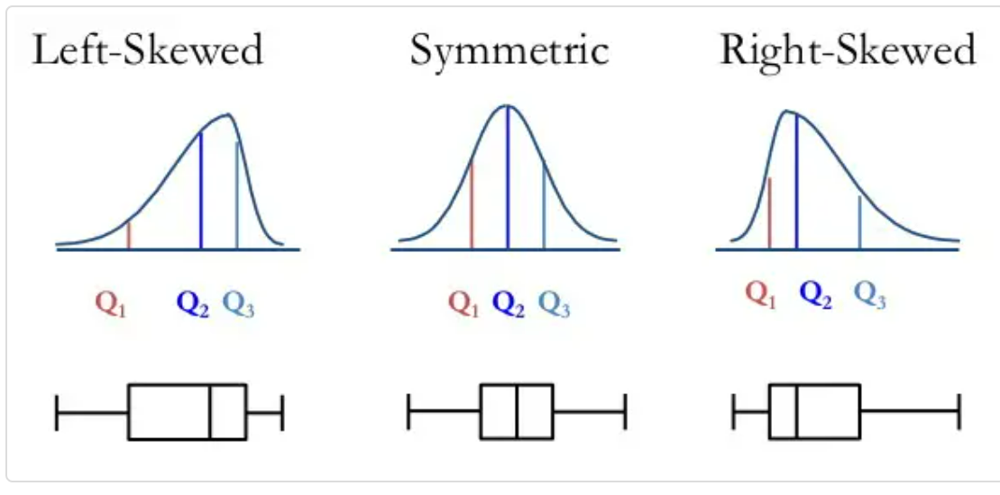

Box plots visually show the distribution of numerical data and skewness through displaying the data quartiles (or percentiles) and averages.

1. When the median is closer to the bottom of the box, and if the whisker is shorter on the lower end of the box, then the distribution is positively skewed (skewed right).

2. When the median is closer to the top of the box, and if the whisker is shorter on the upper end of the box, then the distribution is negatively skewed (skewed left).

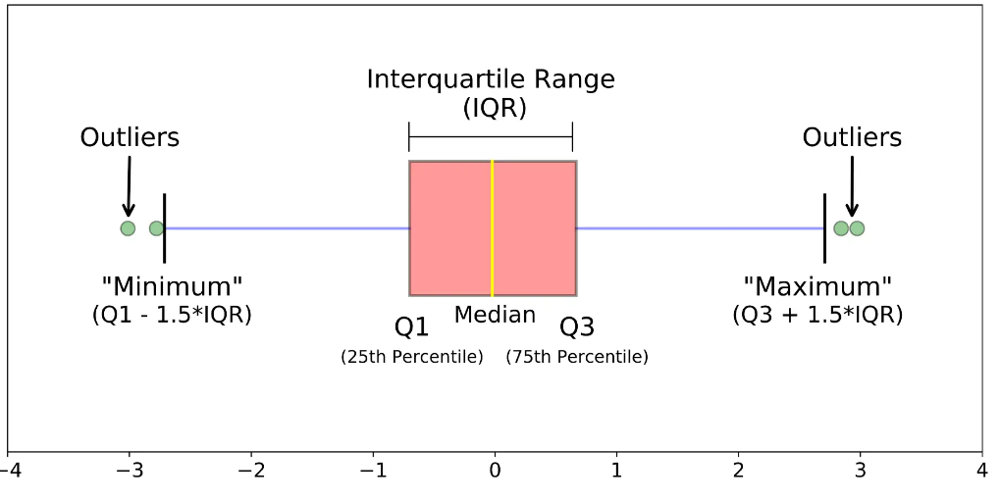

1. If the skewness is between -0.5 and 0.5, the data is fairly symmetrical. If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed. If the skewness is less than -1 or greater than 1, the data are highly skewed.

2. When the value of the skewness is negative, the tail of the distribution is longer towards the left hand side of the curve. and vice-versa

### Univariate/Bivariate distributions

In [56]:
def plot_comparison(data, col, title):
    fig, ax = plt.subplots(3, 1, sharex=True, figsize=[18,18])
    sns.histplot(data=train_df, x=col, kde=True, ax=ax[0], color = 'cornflowerblue')
    ax[0].set_title('Histogram + KDE')
    sns.boxenplot(x=col, ax=ax[1], color = 'cornflowerblue')
    ax[1].set_title('Boxplot')
    sns.violinplot(x=col, saturation=1, ax=ax[2], color = 'cornflowerblue', bw=.15, cut=0)
    ax[2].set_title('Violin plot')
    fig.suptitle(title, fontsize=16)
    plt.show()

age
Skew : -0.63
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 5
% of nulls : 2.01


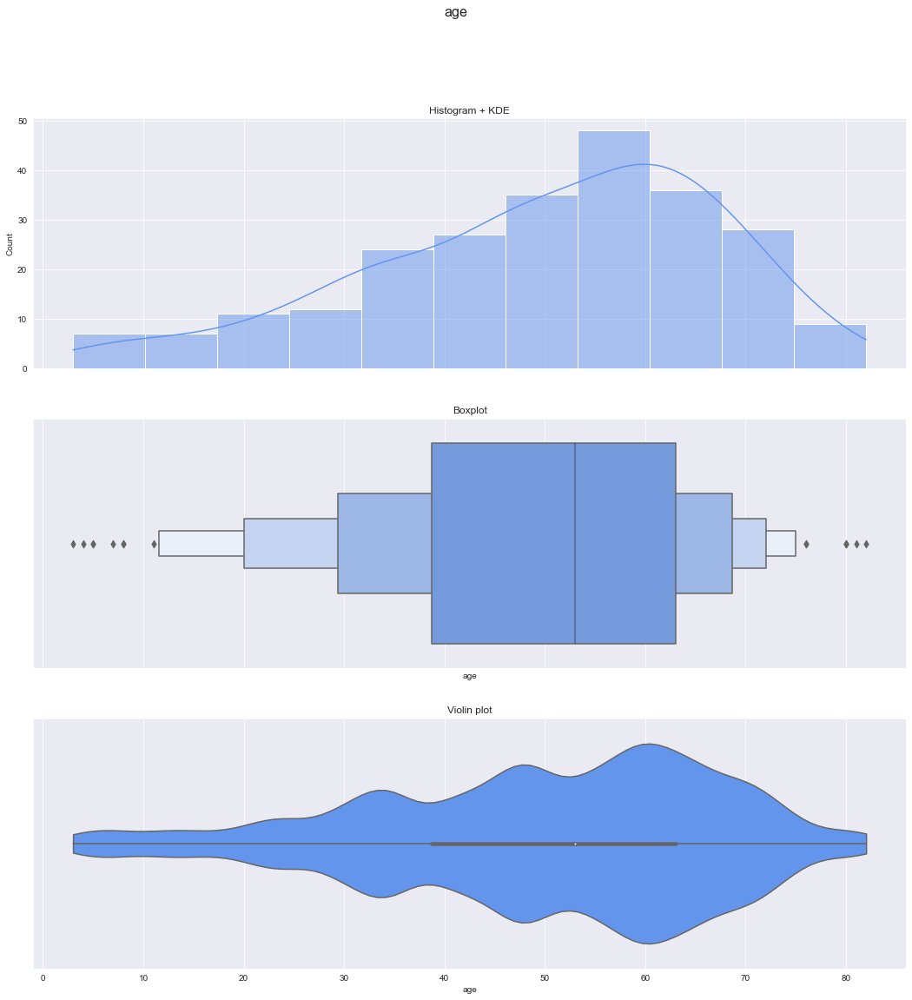

bgr
Skew : 1.95
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 21
% of nulls : 8.43


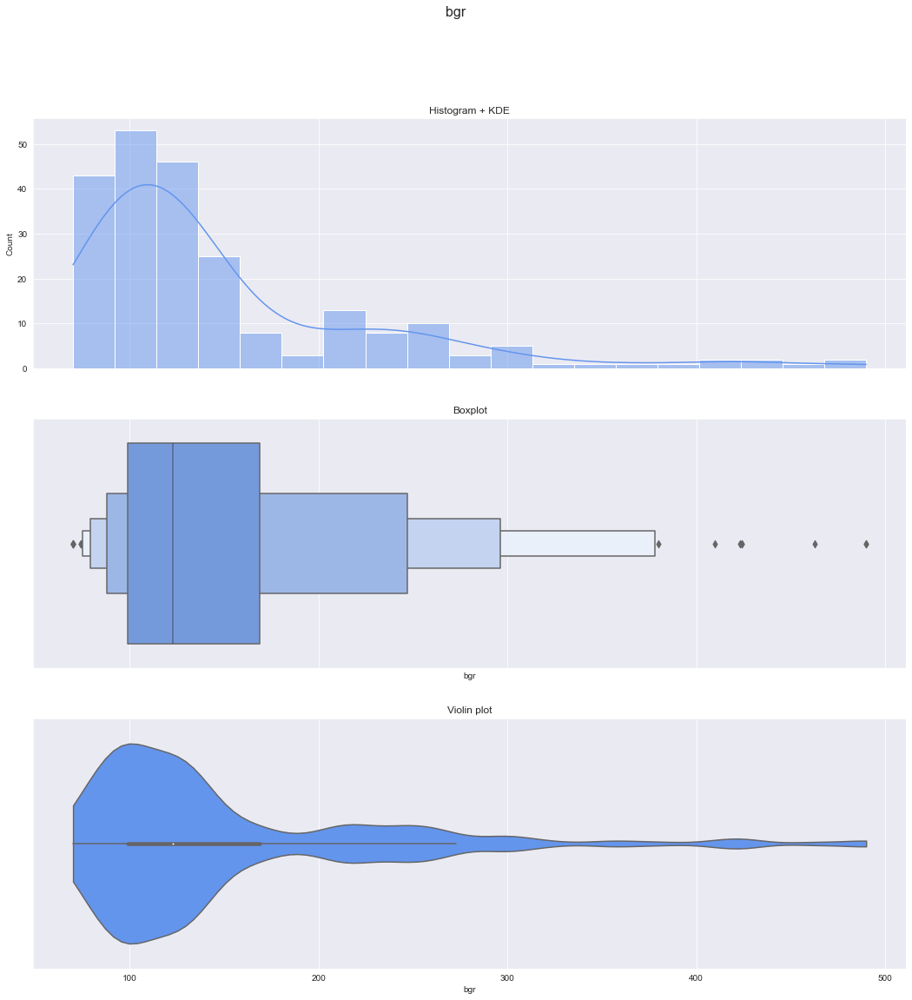

bu
Skew : 2.51
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 5
% of nulls : 2.01


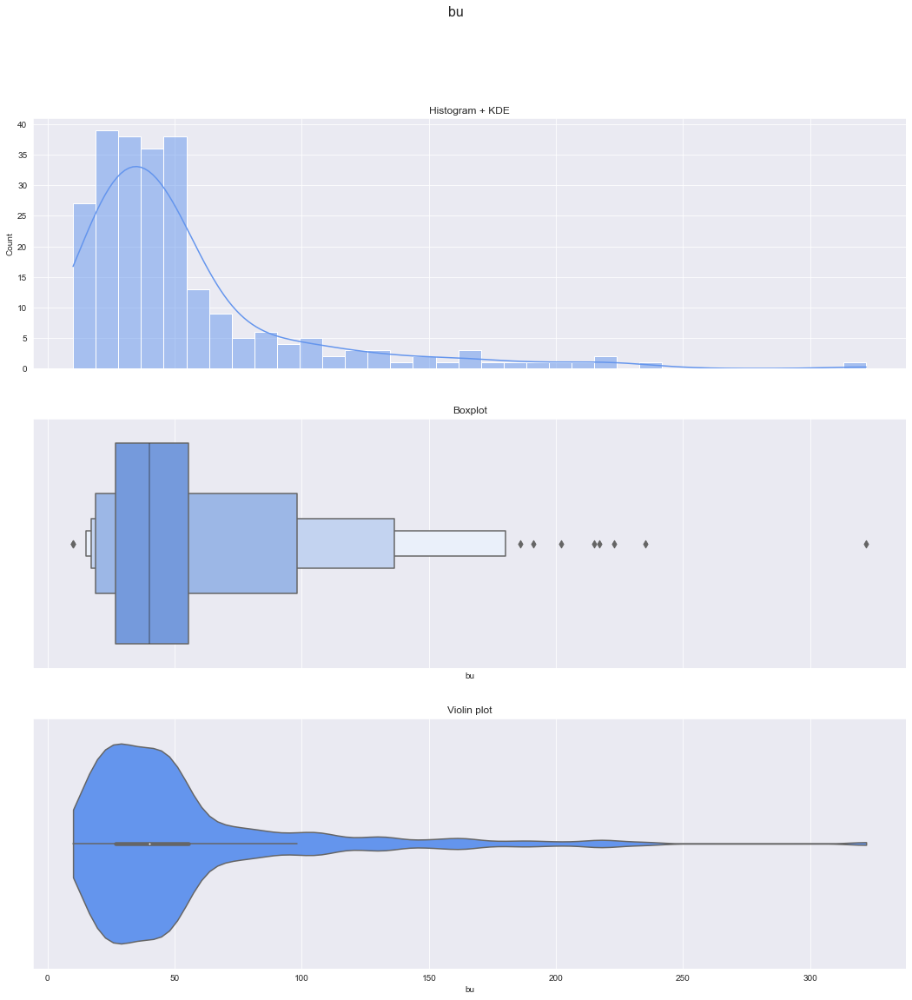

sc
Skew : 3.03
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 6
% of nulls : 2.41


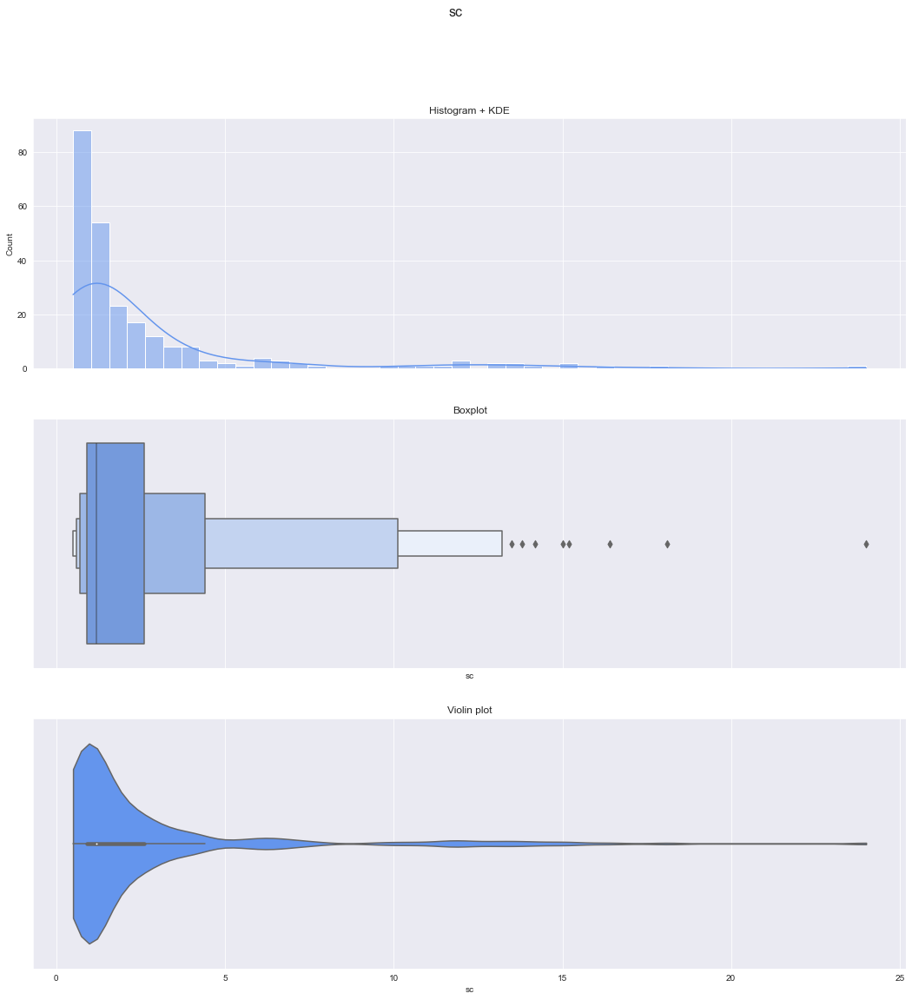

sod
Skew : -1.23
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 45
% of nulls : 18.07


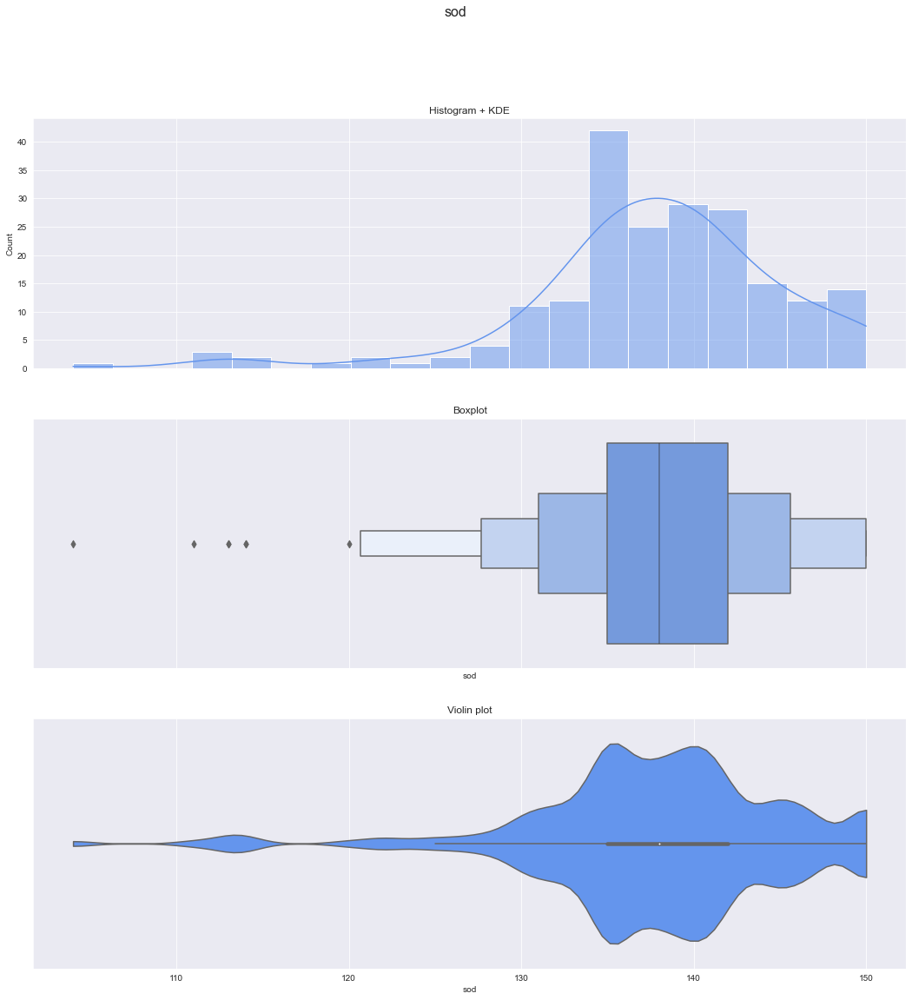

pot
Skew : 12.97
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 45
% of nulls : 18.07


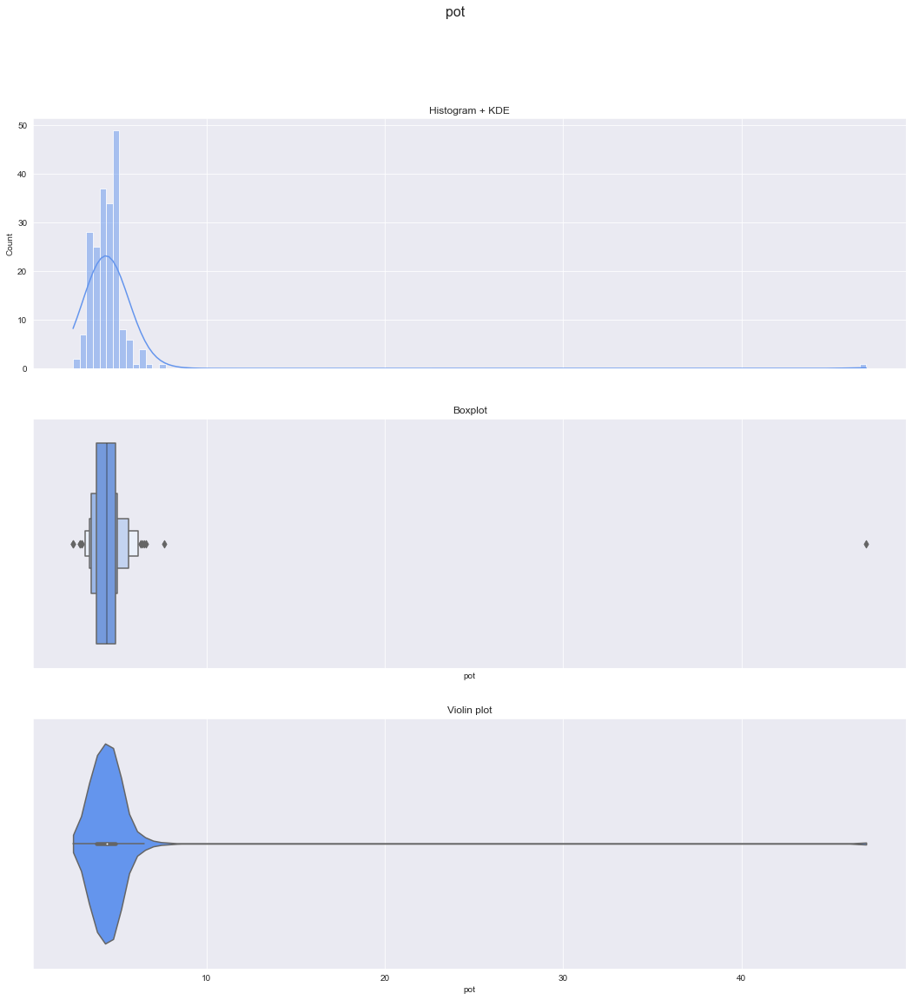

hemo
Skew : -0.38
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 18
% of nulls : 7.23


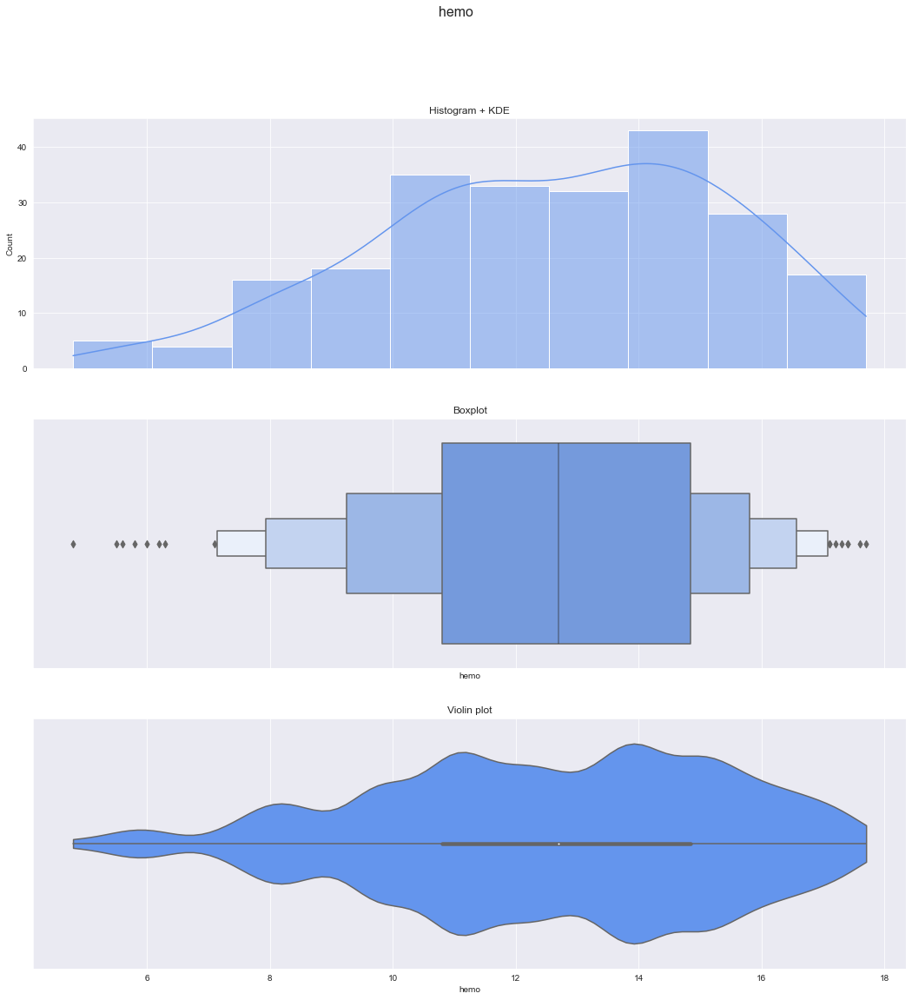

pcv
Skew : -0.39
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 26
% of nulls : 10.44


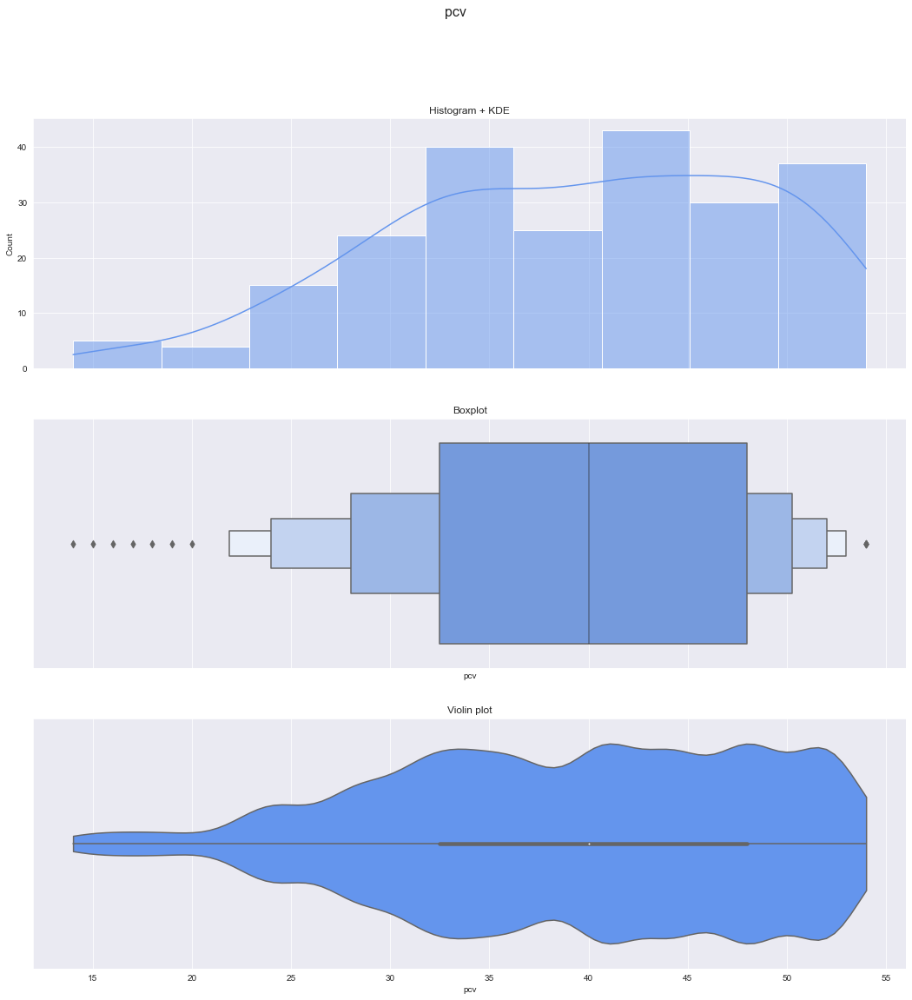

wc
Skew : 1.81
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 46
% of nulls : 18.47


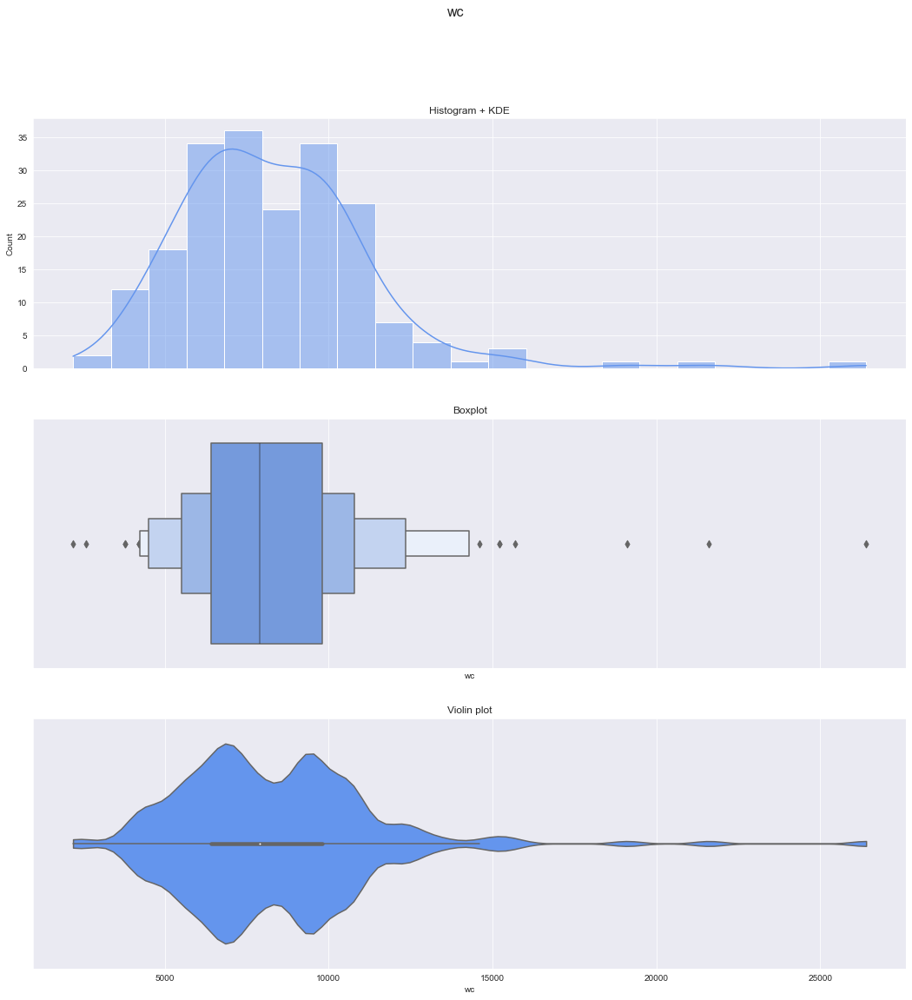

rc
Skew : -0.33
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 63
% of nulls : 25.3


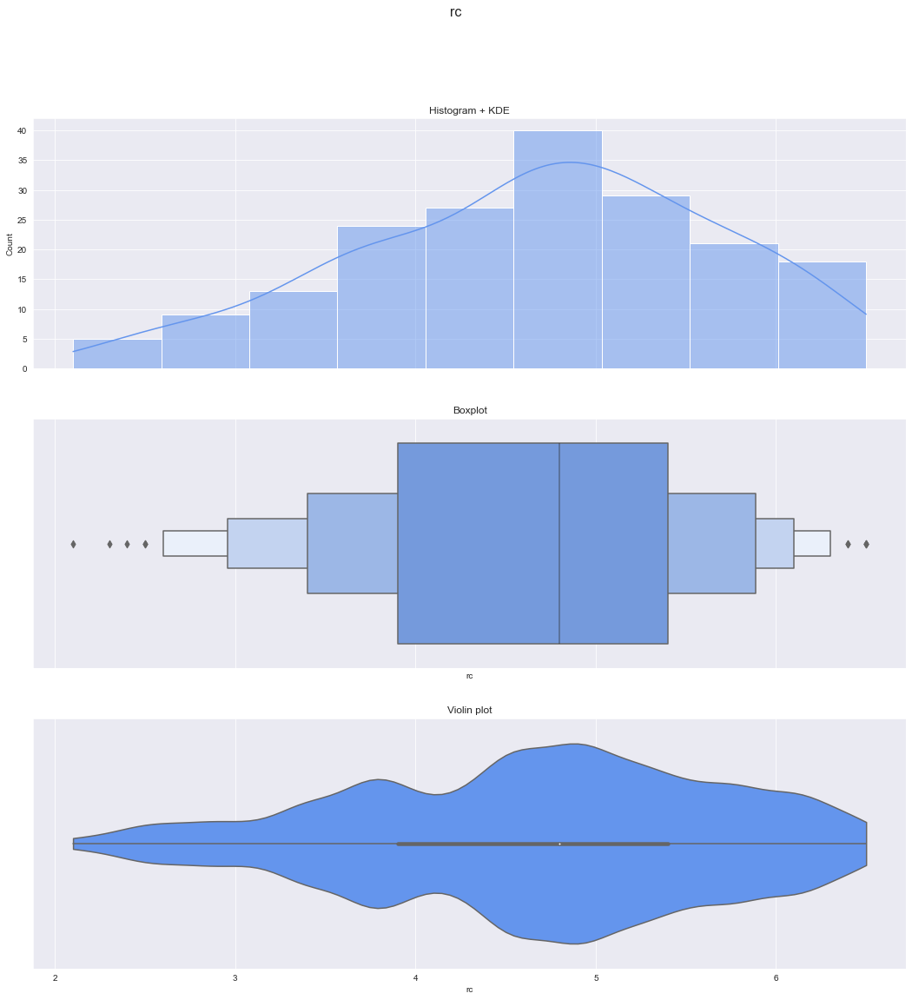

In [57]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    print('no.of zeros :',(train_df[col]==0).sum())
    print('% of zeros :',np.round_((train_df[col]==0).sum()/len(train_df)*100,decimals=2))
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_comparison(train_df, train_df[col], col)

age
no.of nulls : 5
% of nulls : 2.01
Skew : -0.63


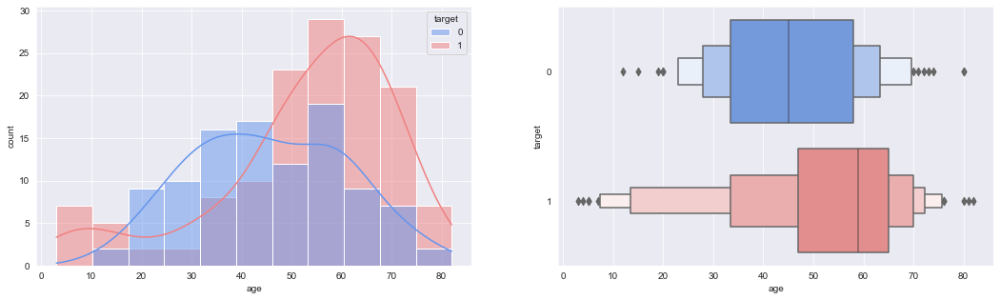

bgr
no.of nulls : 21
% of nulls : 8.43
Skew : 1.95


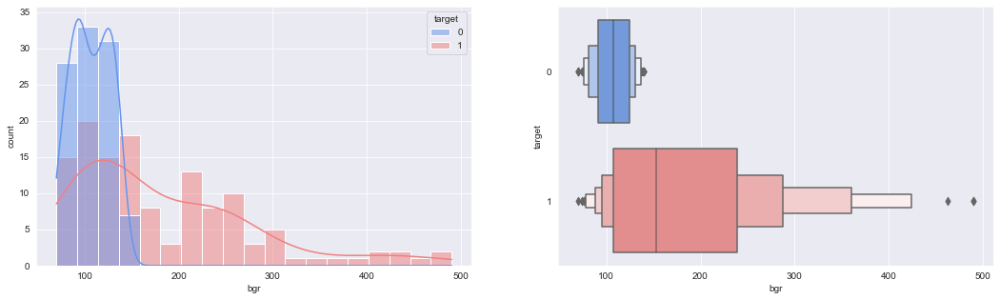

bu
no.of nulls : 5
% of nulls : 2.01
Skew : 2.51


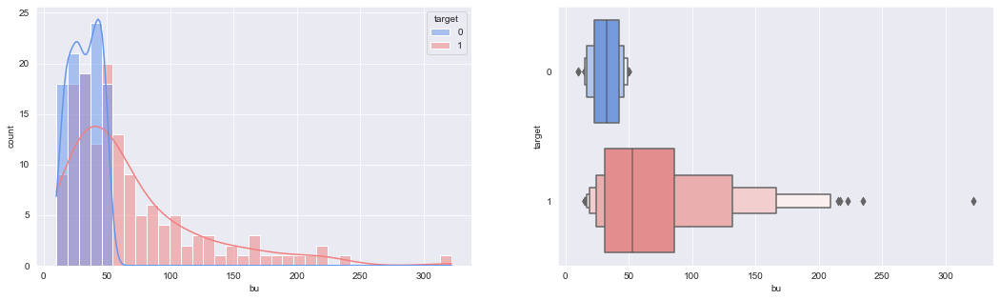

sc
no.of nulls : 6
% of nulls : 2.41
Skew : 3.03


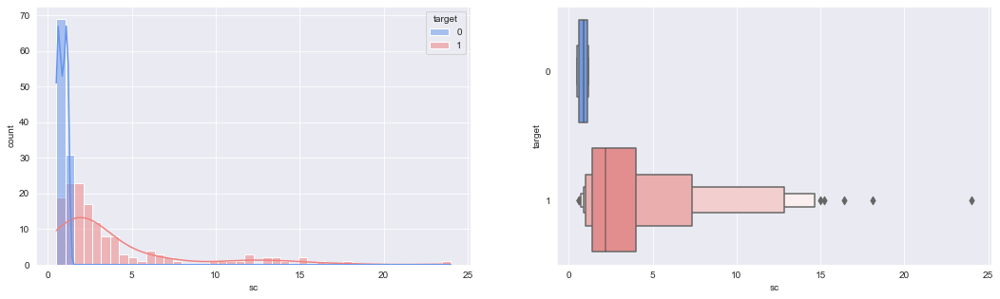

sod
no.of nulls : 45
% of nulls : 18.07
Skew : -1.23


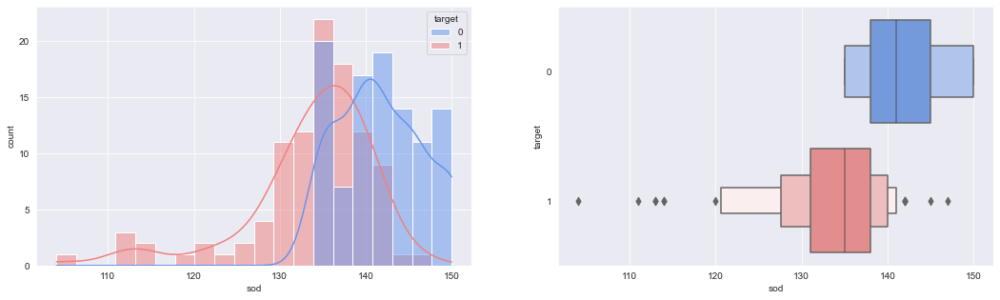

pot
no.of nulls : 45
% of nulls : 18.07
Skew : 12.97


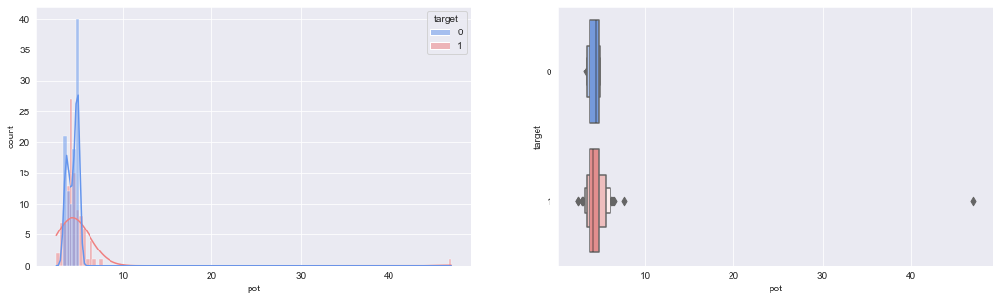

hemo
no.of nulls : 18
% of nulls : 7.23
Skew : -0.38


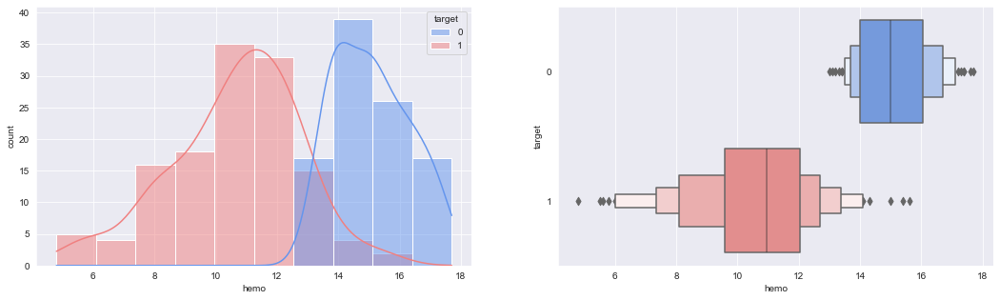

pcv
no.of nulls : 26
% of nulls : 10.44
Skew : -0.39


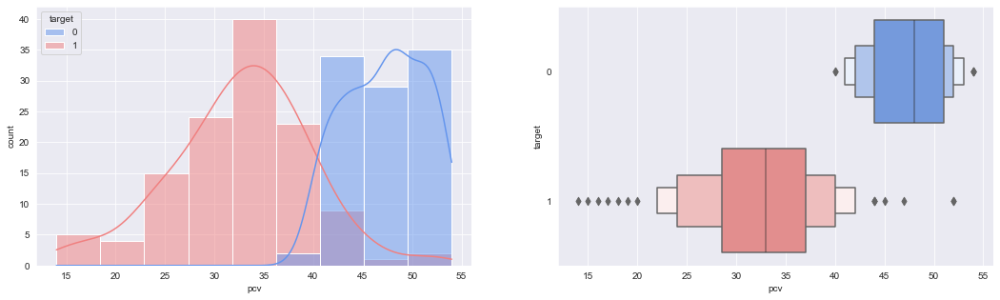

wc
no.of nulls : 46
% of nulls : 18.47
Skew : 1.81


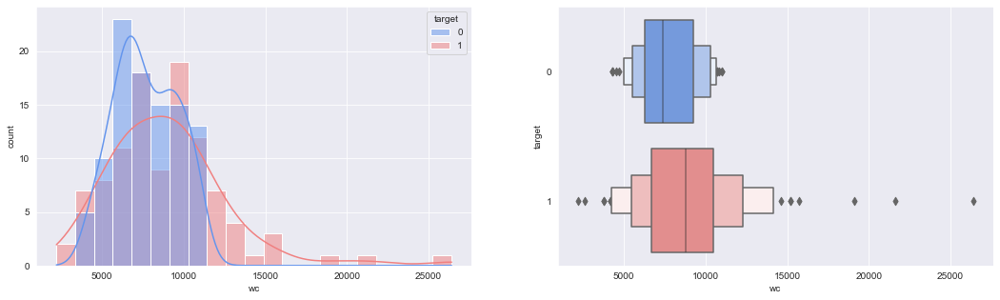

rc
no.of nulls : 63
% of nulls : 25.3
Skew : -0.33


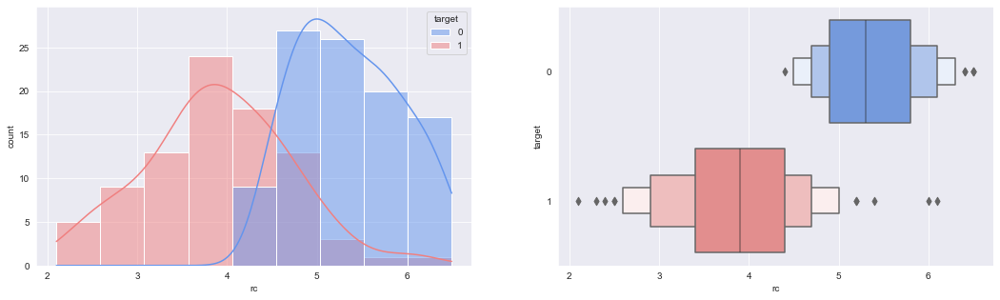

In [58]:
for col in continuous_features:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxenplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'])
    plt.show()

age
Skew : -0.63


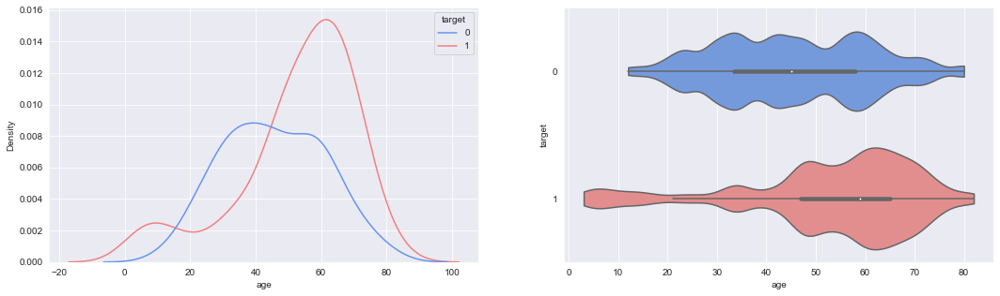

bgr
Skew : 1.95


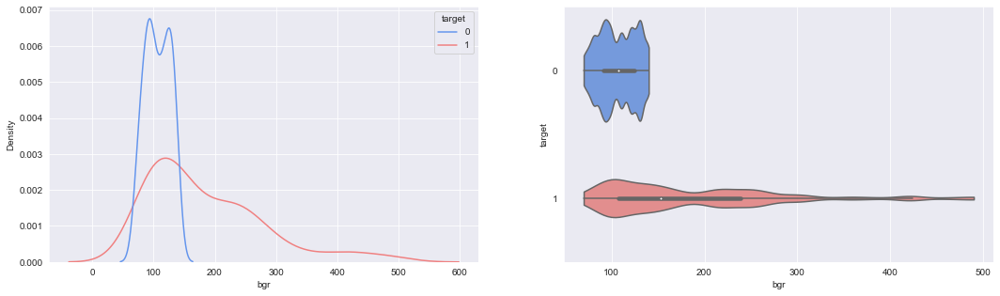

bu
Skew : 2.51


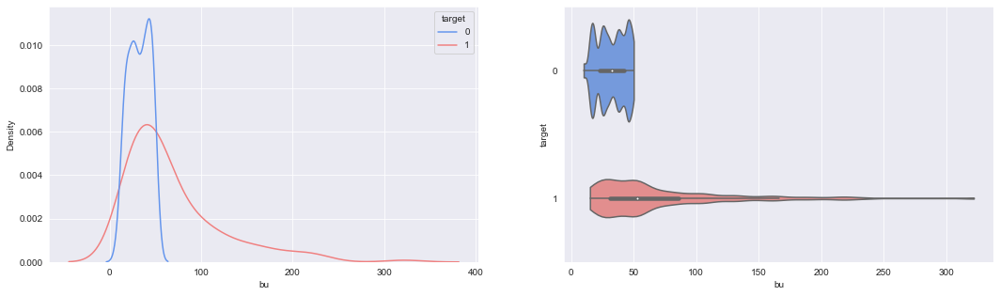

sc
Skew : 3.03


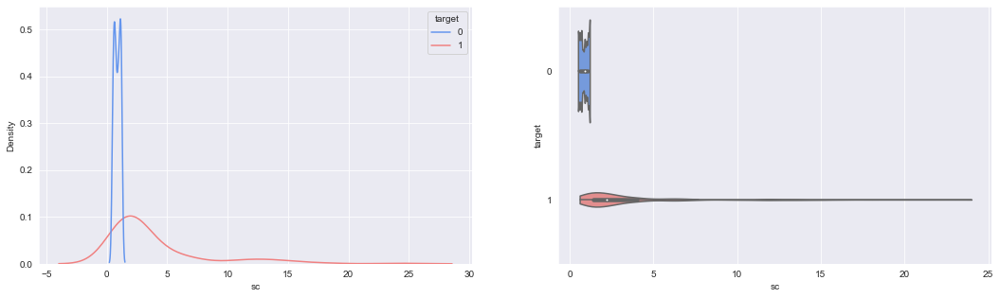

sod
Skew : -1.23


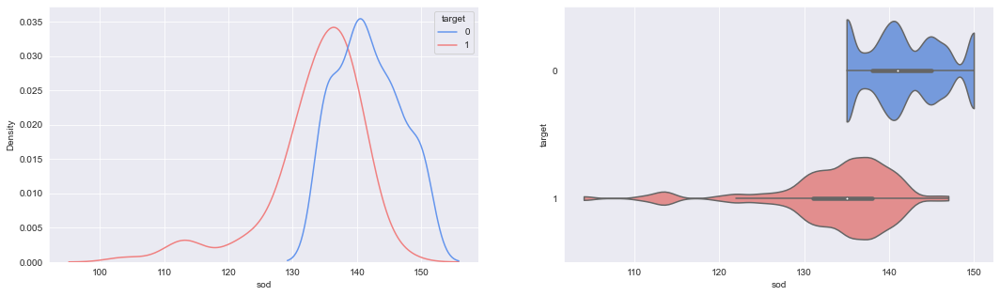

pot
Skew : 12.97


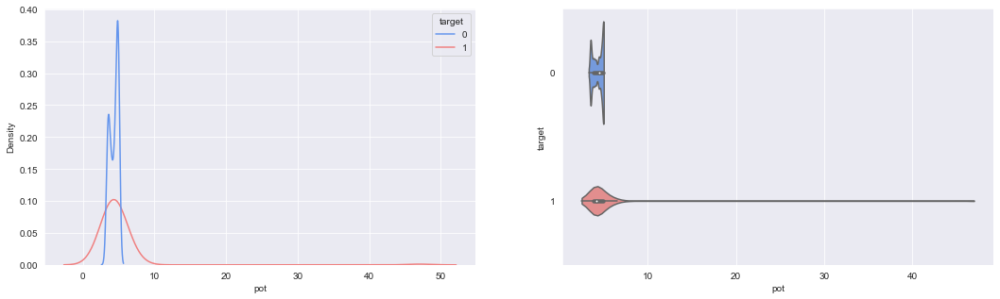

hemo
Skew : -0.38


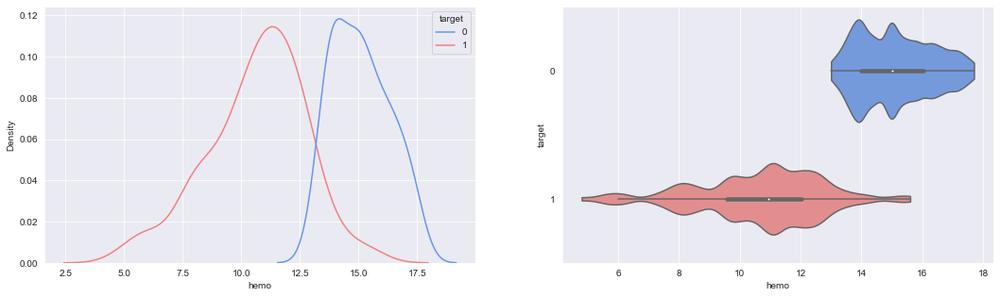

pcv
Skew : -0.39


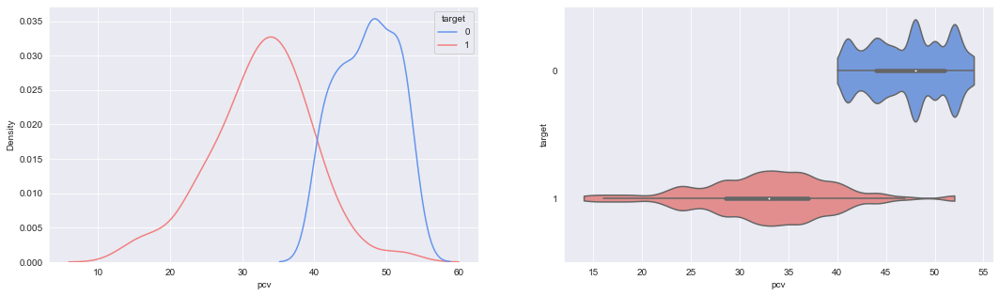

wc
Skew : 1.81


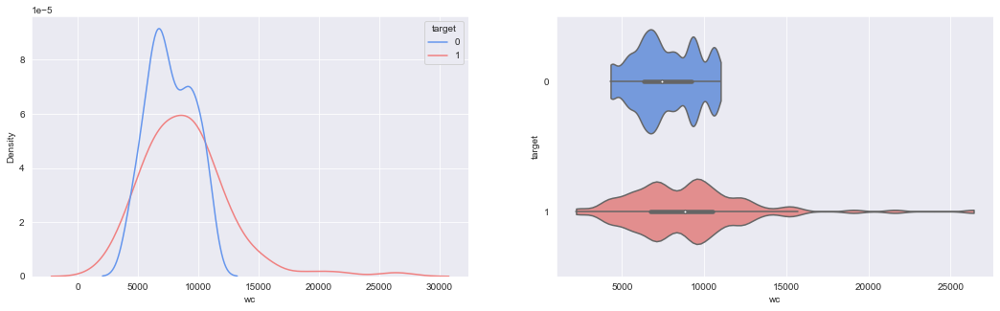

rc
Skew : -0.33


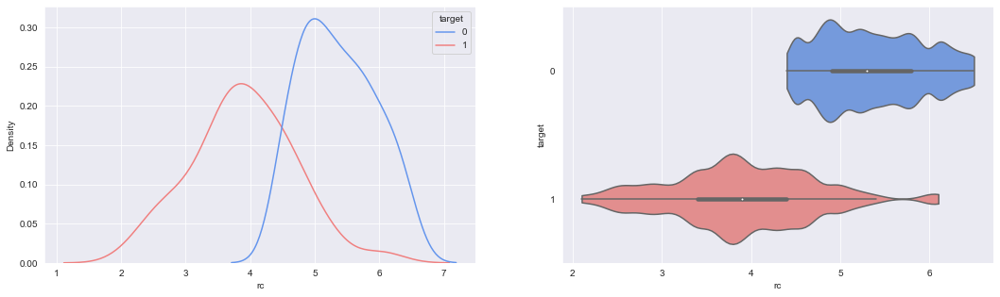

In [59]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.kdeplot(data=train_df, x=col,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.subplot(1, 2, 2)
    #sns.violinplot(x=train_df[col],saturation=1)
    sns.violinplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'], bw=.15,cut=0)
    plt.show()

#### If you want to check whether feature is guassian or normal distributed
#### Q-Q plot

In [60]:
import scipy.stats as stat
import pylab 

age
Skew : -0.63
nan


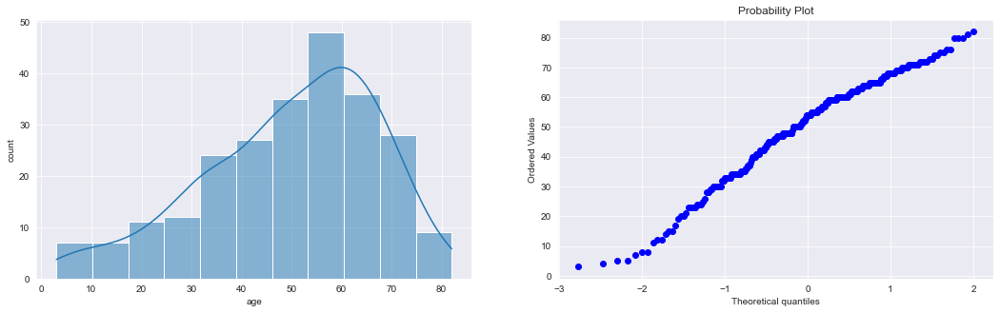

bgr
Skew : 1.95
nan


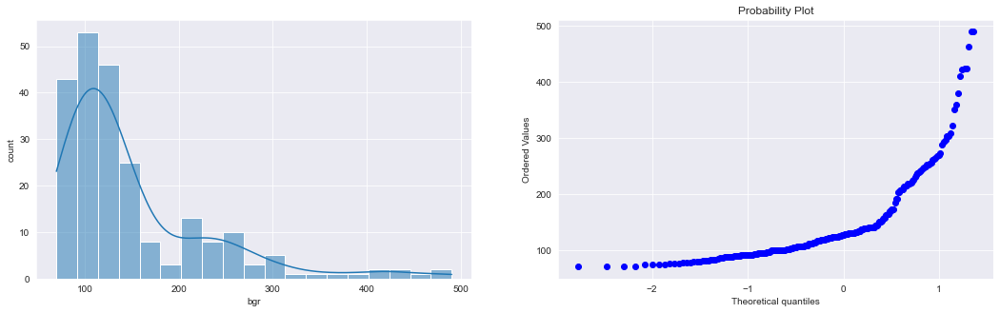

bu
Skew : 2.51
nan


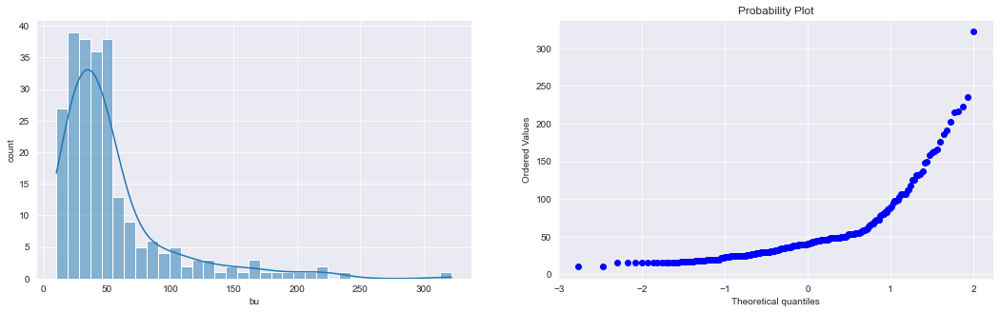

sc
Skew : 3.03
nan


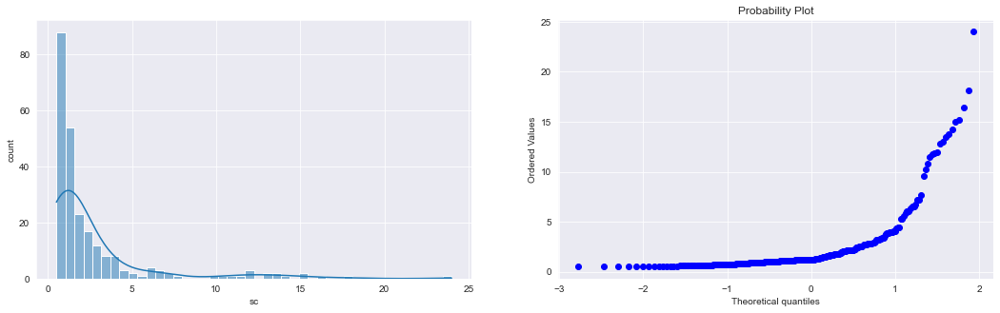

sod
Skew : -1.23
nan


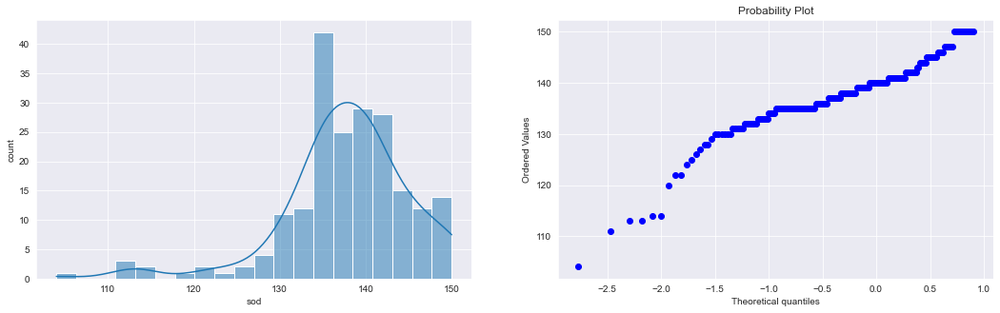

pot
Skew : 12.97
nan


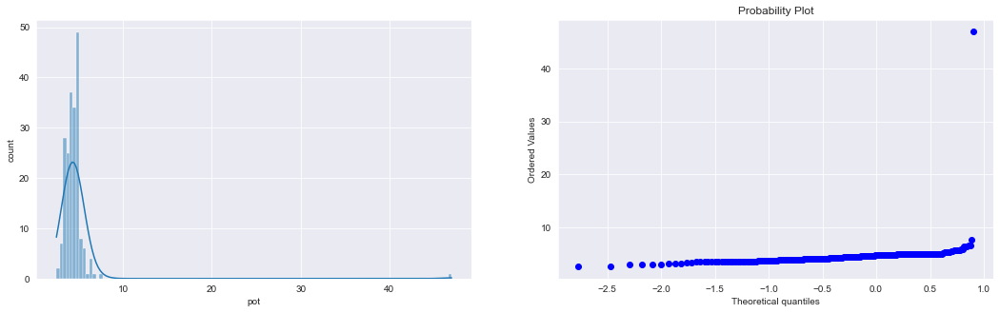

hemo
Skew : -0.38
nan


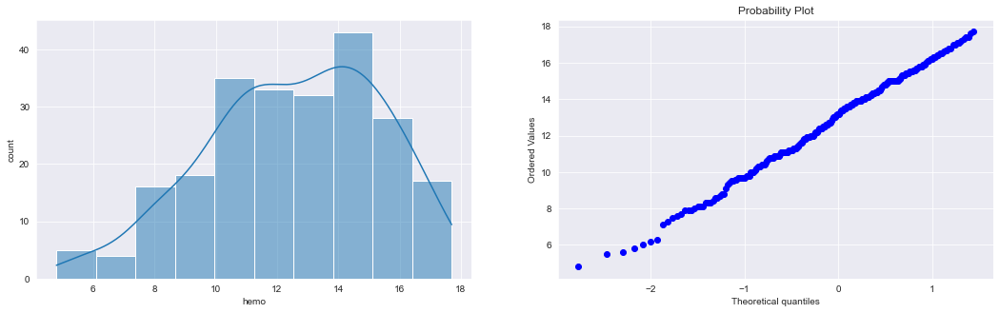

pcv
Skew : -0.39
nan


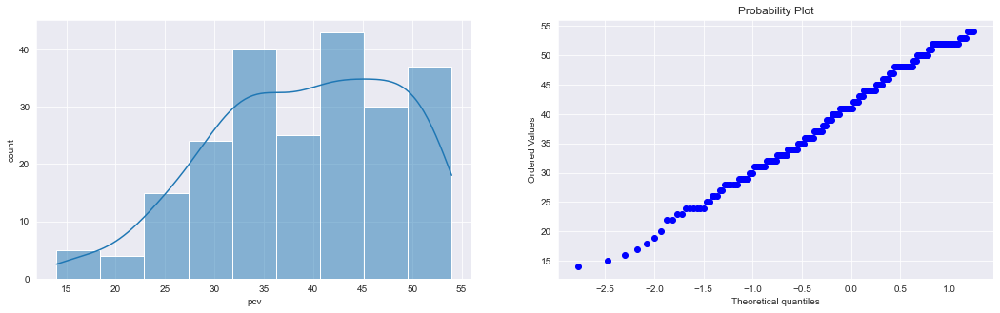

wc
Skew : 1.81
nan


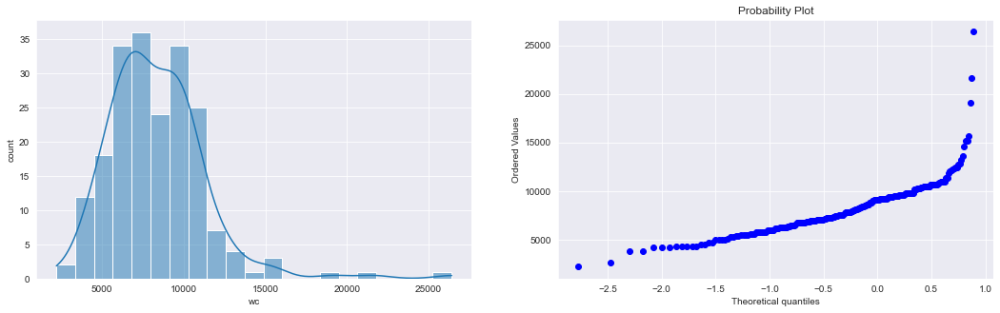

rc
Skew : -0.33
nan


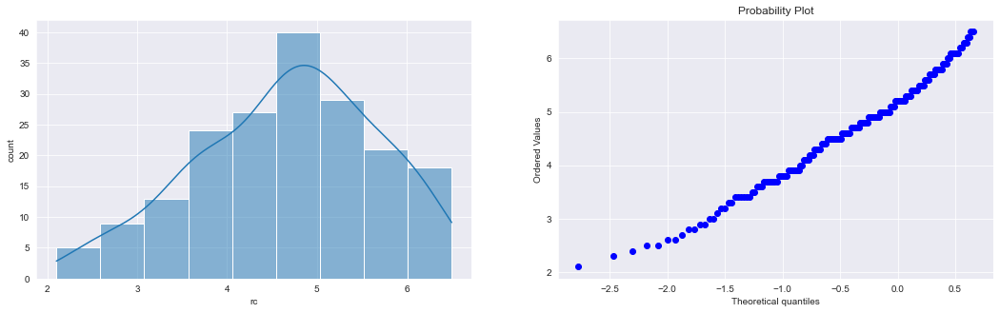

In [61]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    _, p = stat.normaltest(train_df[col].to_numpy())
    print(p)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    stat.probplot(train_df[col],dist='norm',plot=pylab)
    plt.show()

1. A normal fasting blood glucose level is lower than 95 mg/dL (5.3 mmol/L). One hour after drinking the glucose solution, a normal blood glucose level is lower than 180 mg/dL (10 mmol/L). Two hours after drinking the glucose solution, a normal blood glucose level is lower than 155 mg/dL (8.6 mmol/L).
2. Insulin allows the cells in the muscles, fat and liver to absorb glucose that is in the blood. The glucose serves as energy to these cells, or it can be converted into fat when needed

### Observations :

1. ['hemo','rc'] are close to normal dist. ignoring the outliers
2. ['age','sod','pcv'] seems left skewed
3. ['bgr','bu','sc','pot','wc',''] seems right skewed
4. ['bgr','bu','sc','sod','hemo','pcv','rc'] clearly distinguish the target categories

In [62]:
train_df.columns

Index(['age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr', 'bu',
       'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad',
       'appet', 'pe', 'ane', 'target'],
      dtype='object')

### Visualizing bivariate/multivariate distributions

Text(0, 0.5, 'No.of kidney disease people')

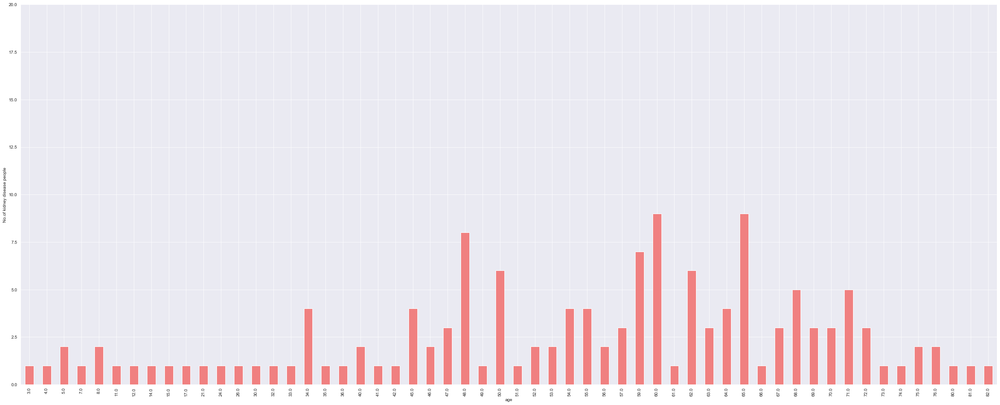

In [63]:
plt.figure(figsize = (40,16))
train_df.loc[train_df['target']==1]['age'].value_counts().sort_index().plot.bar(color = 'lightcoral')

plt.ylim(0, 20)

plt.xlabel('age')
plt.ylabel('No.of kidney disease people')

# Double click on the plot/graph to zoom in/zoom out

Text(0, 0.5, 'No.of Healthy people')

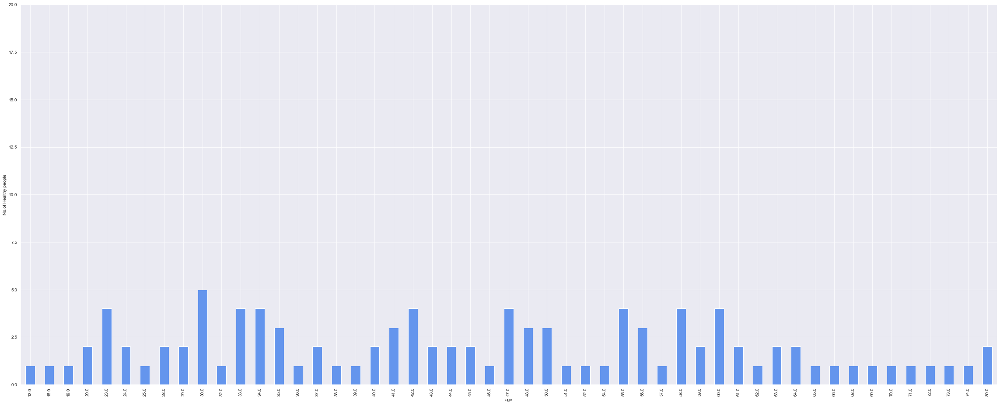

In [64]:
plt.figure(figsize = (40,16))
train_df.loc[train_df['target']==0]['age'].value_counts().sort_index().plot.bar(color = 'cornflowerblue')

plt.ylim(0, 20)

plt.xlabel('age')
plt.ylabel('No.of Healthy people')

# Double click on the plot/graph to zoom in

In [65]:
# From above we cannot clearly find any patterns with Age vs target 
# but one thing is clear that people aged between 45-65 are more prone to kidney disease

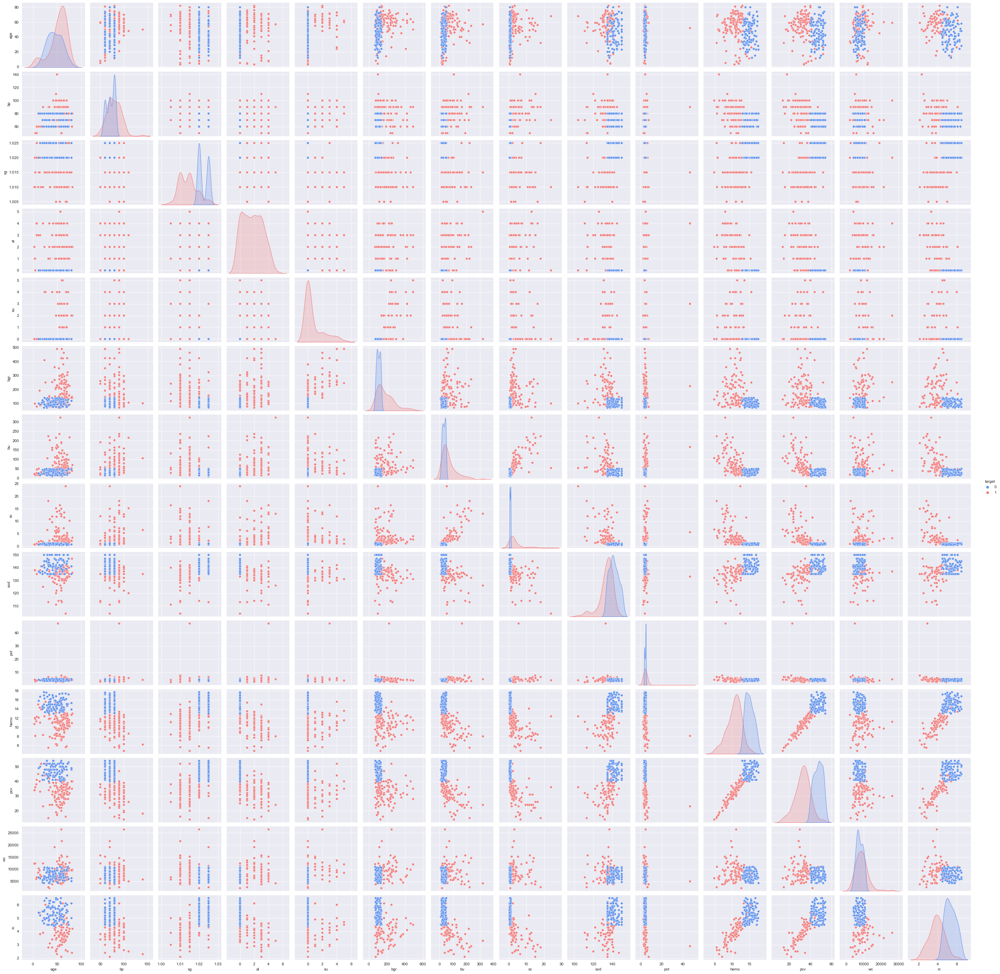

In [66]:
sns.pairplot(train_df, hue='target',palette=['cornflowerblue','lightcoral'])

# Its not clear to observe graphs closely we will plot indvidual plots for some features

In [67]:
continuous_features

['age', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc']

age


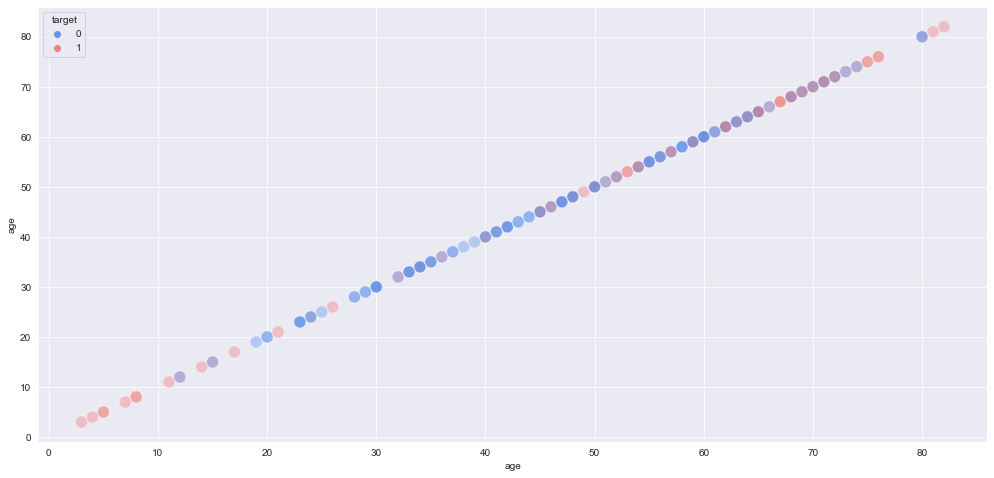

bgr


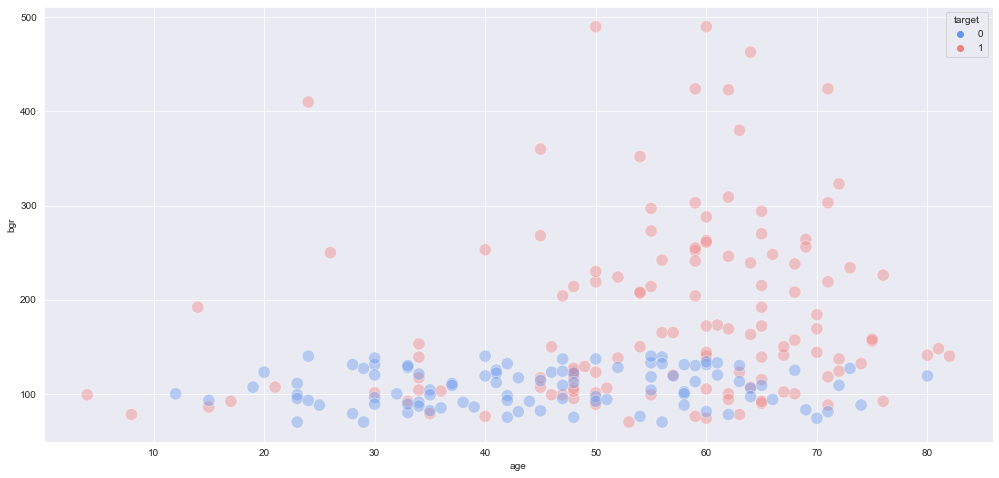

bu


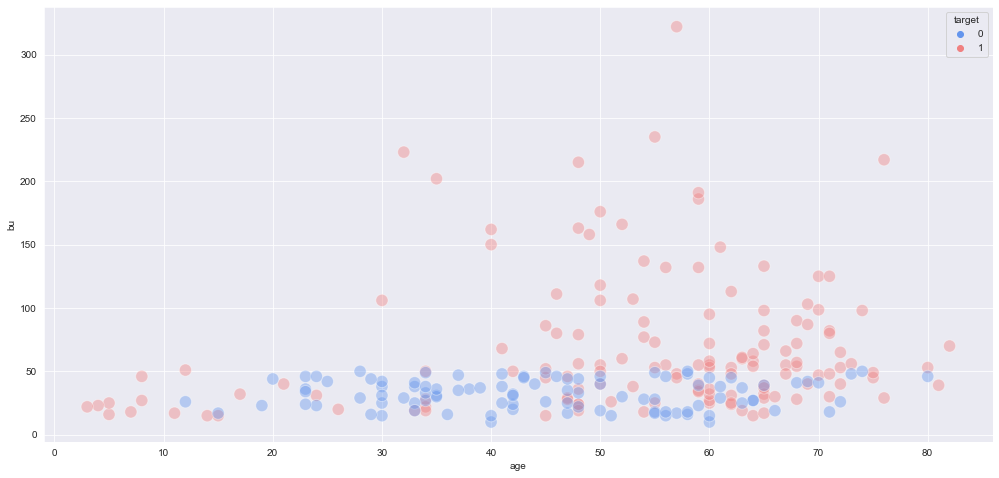

sc


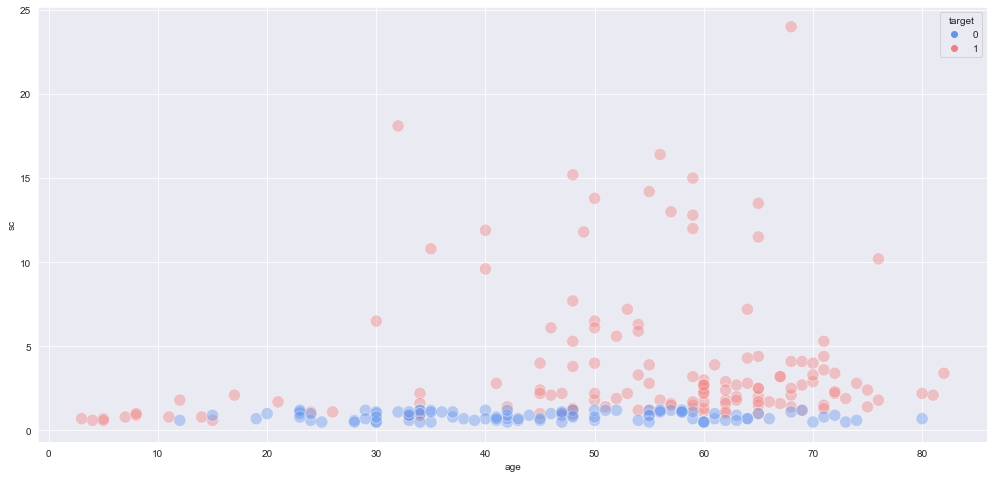

sod


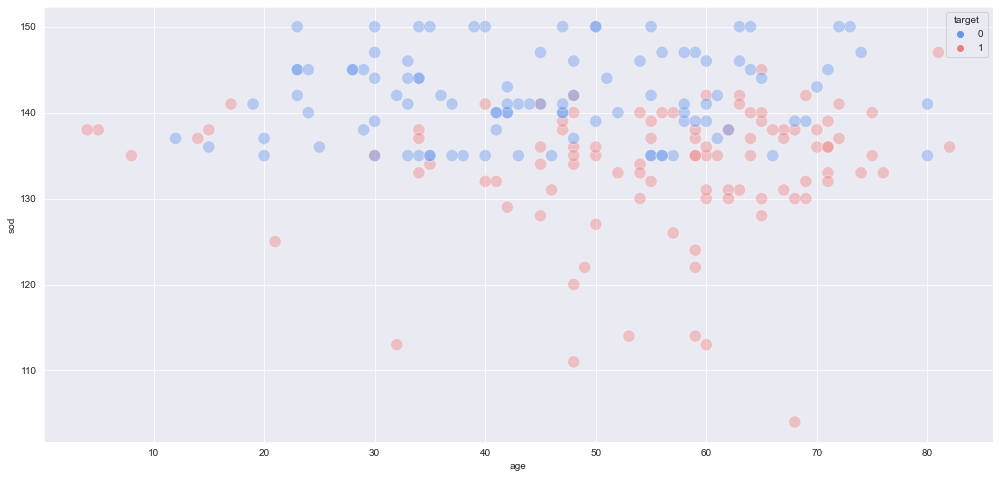

pot


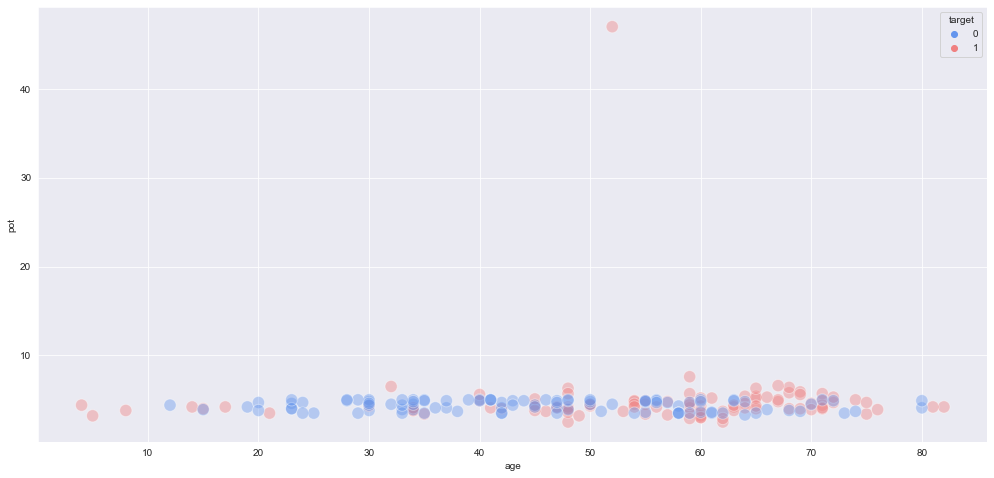

hemo


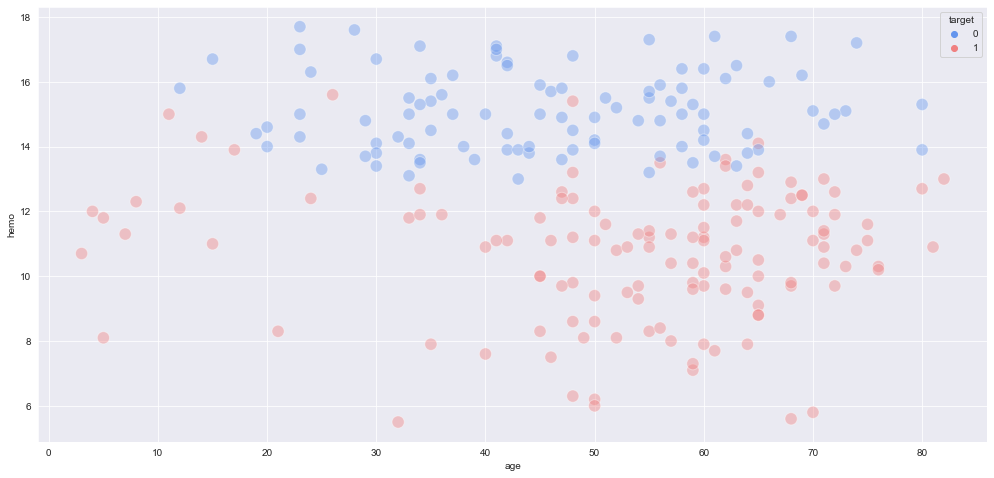

pcv


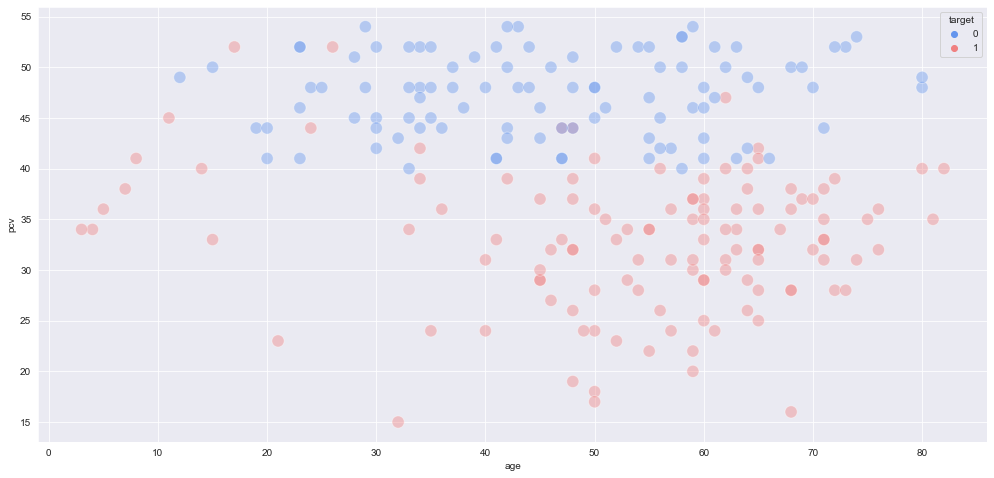

wc


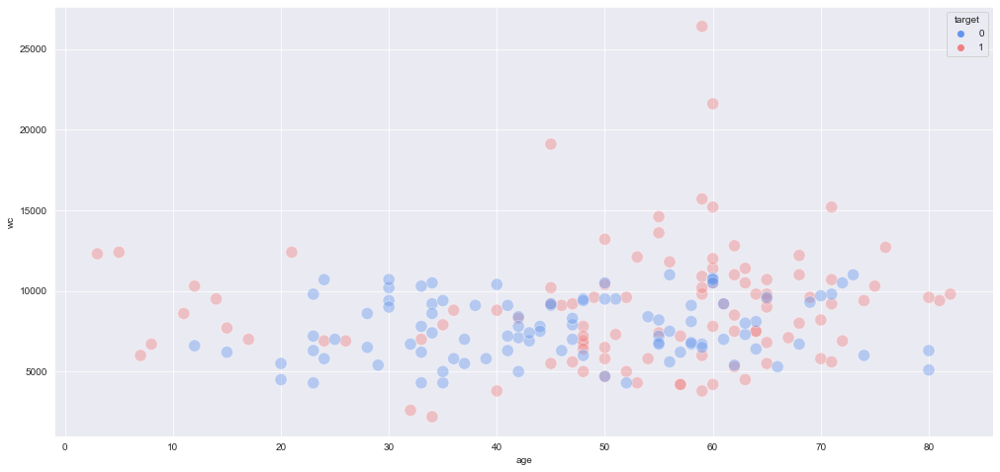

rc


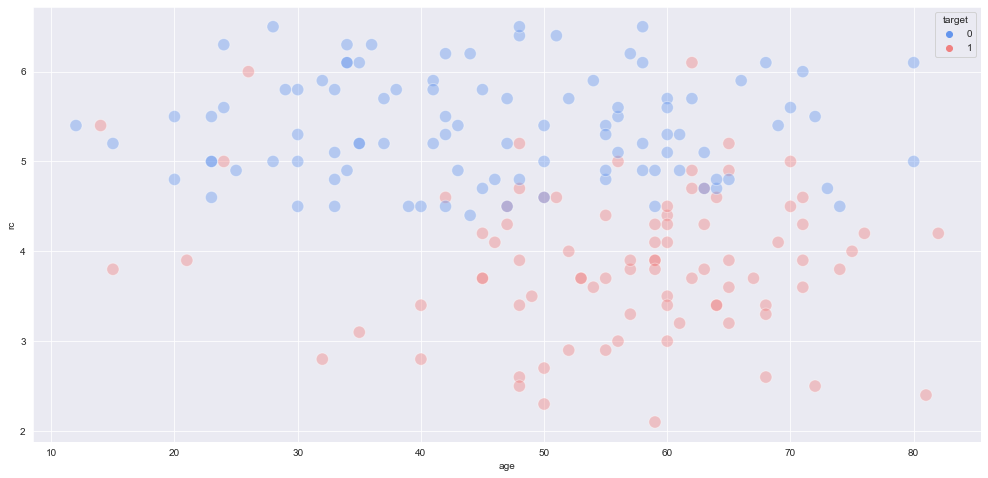

In [68]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='age',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('age')
    plt.ylabel(col)
    plt.show()

age


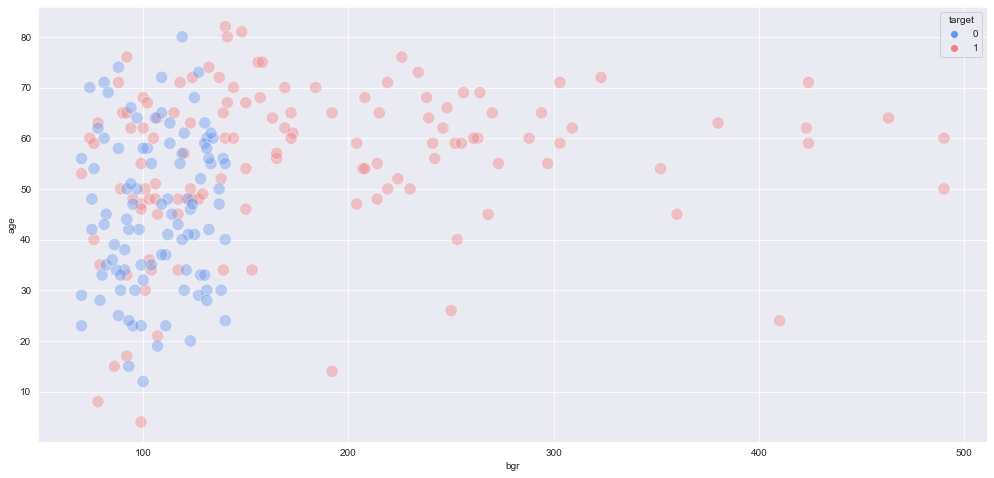

bgr


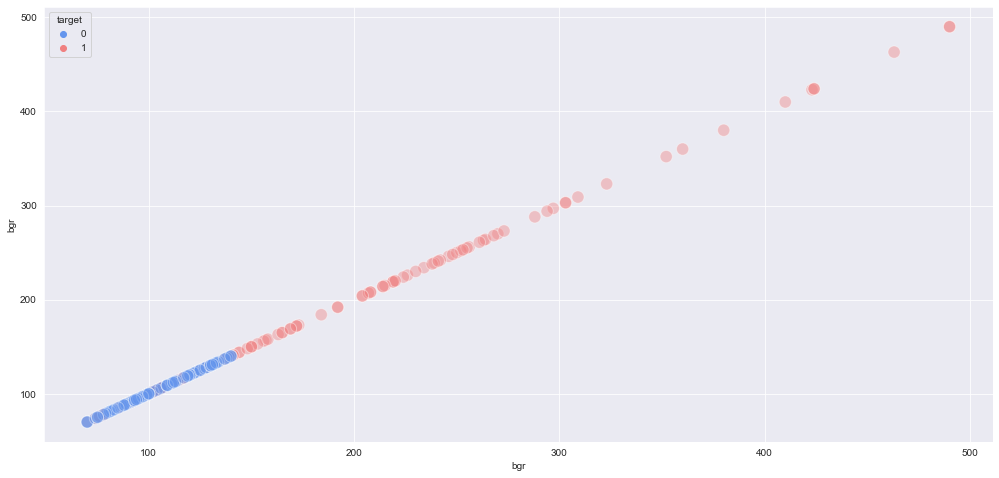

bu


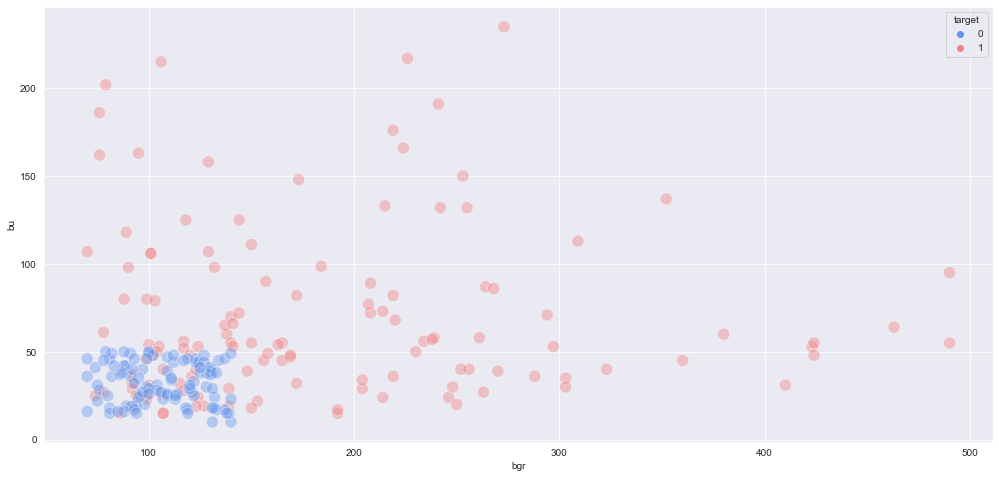

sc


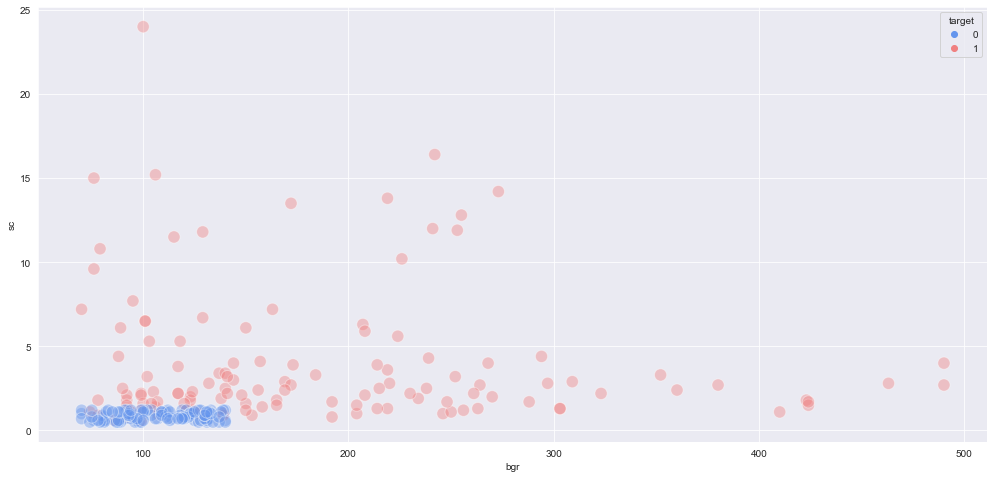

sod


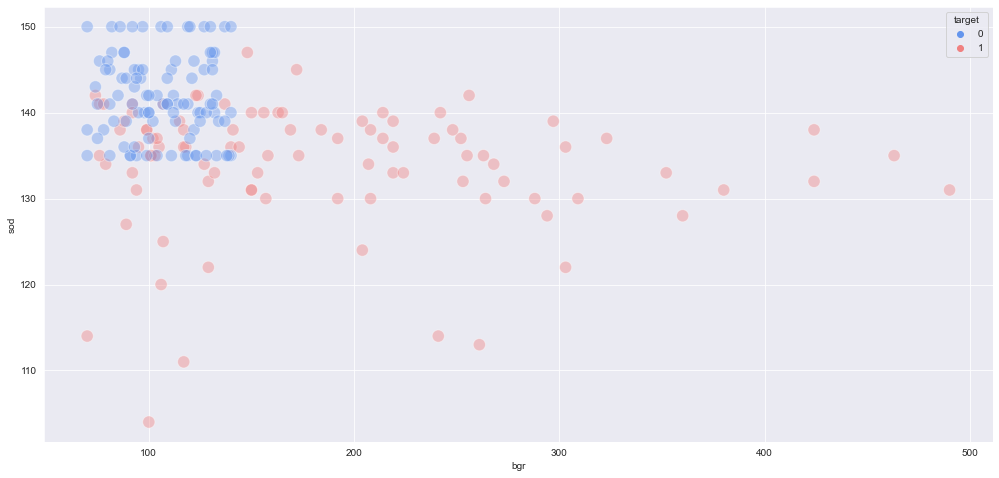

pot


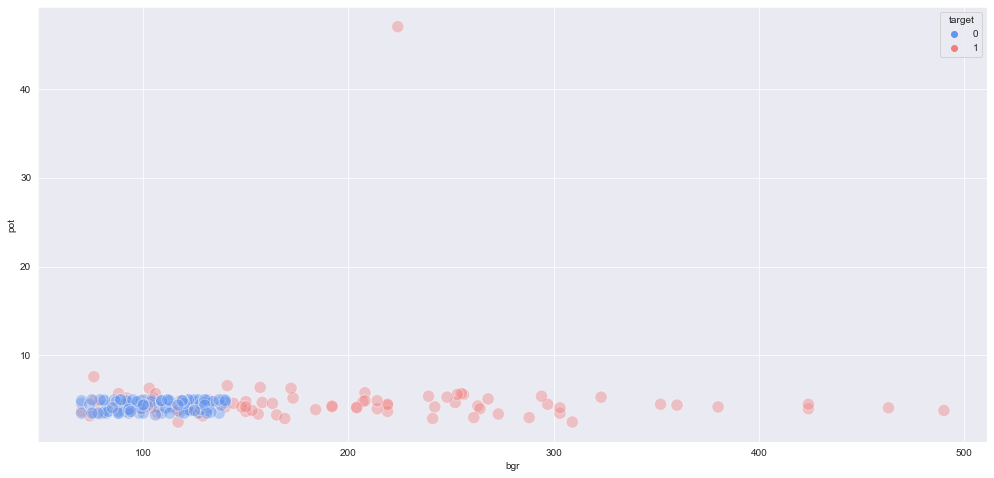

hemo


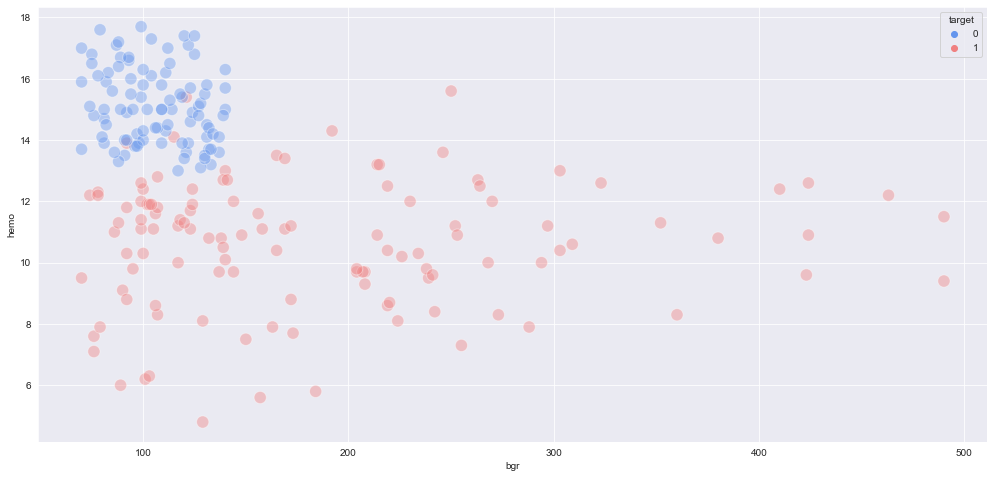

pcv


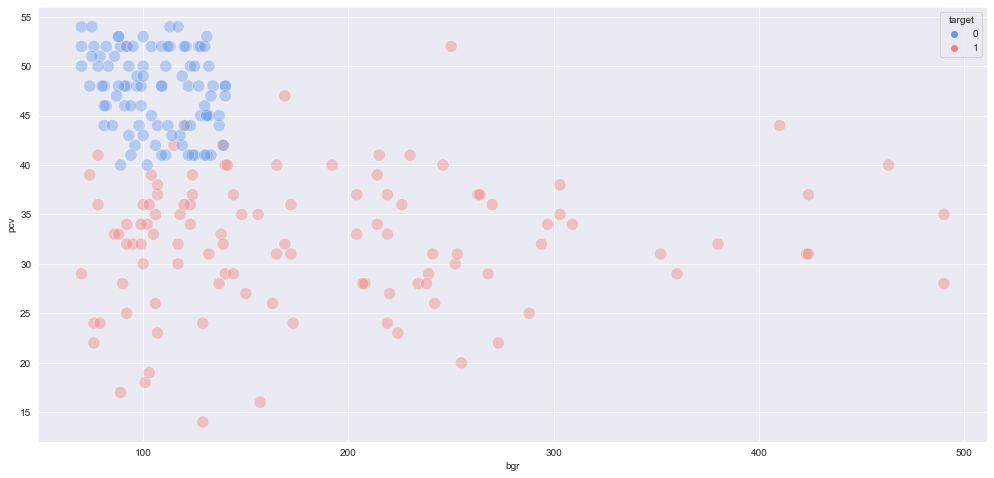

wc


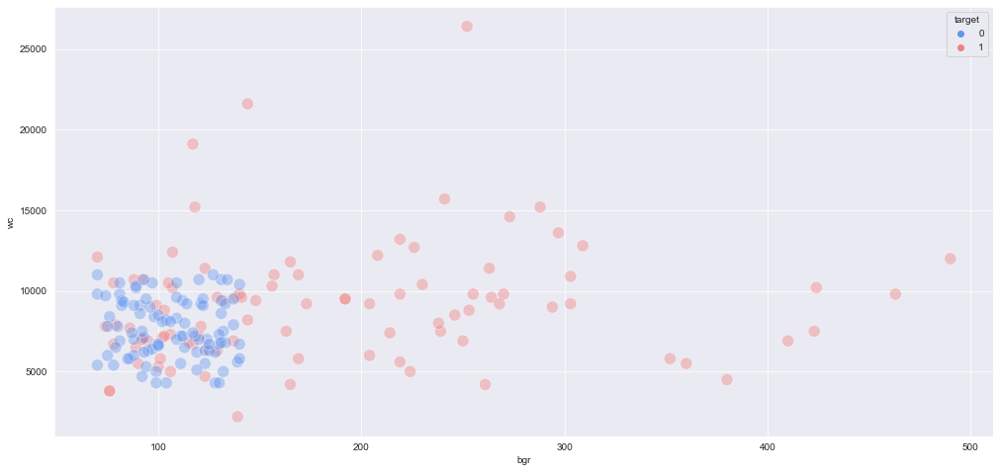

rc


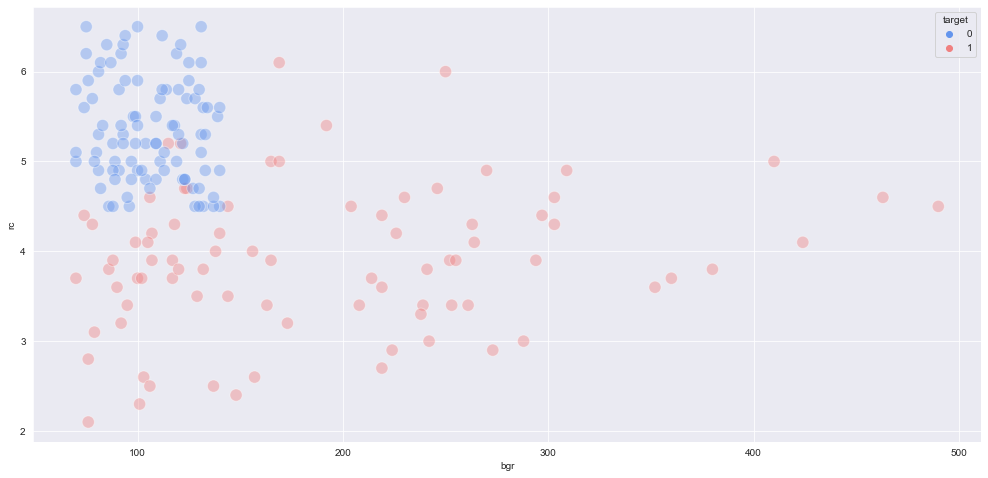

In [69]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='bgr',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('bgr')
    plt.ylabel(col)
    plt.show()

age


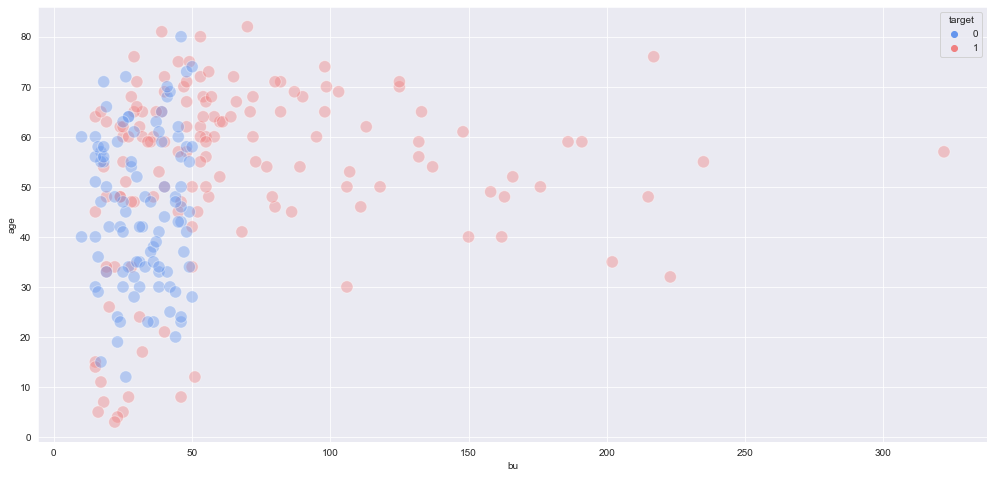

bgr


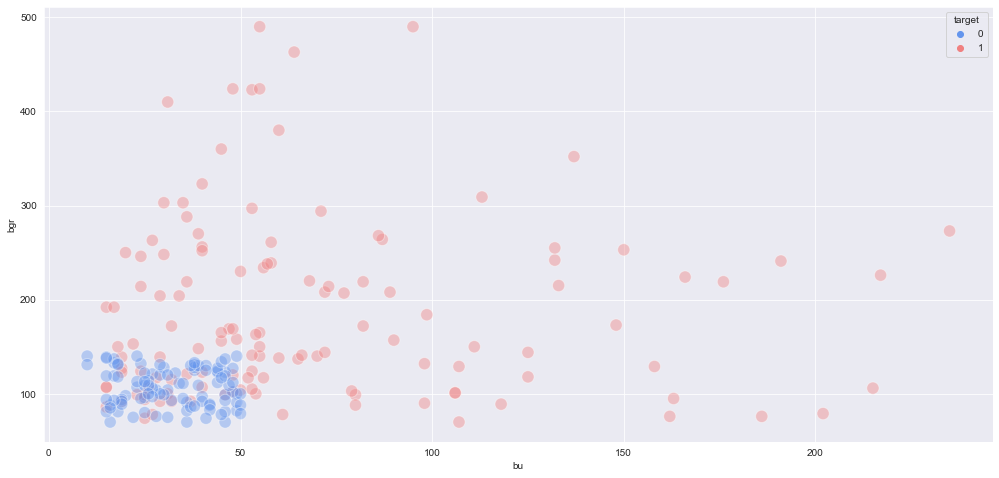

bu


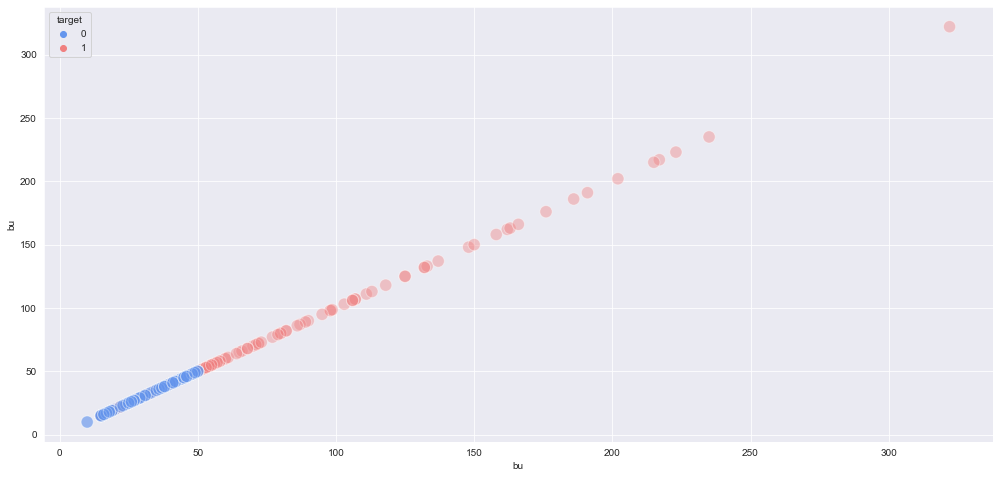

sc


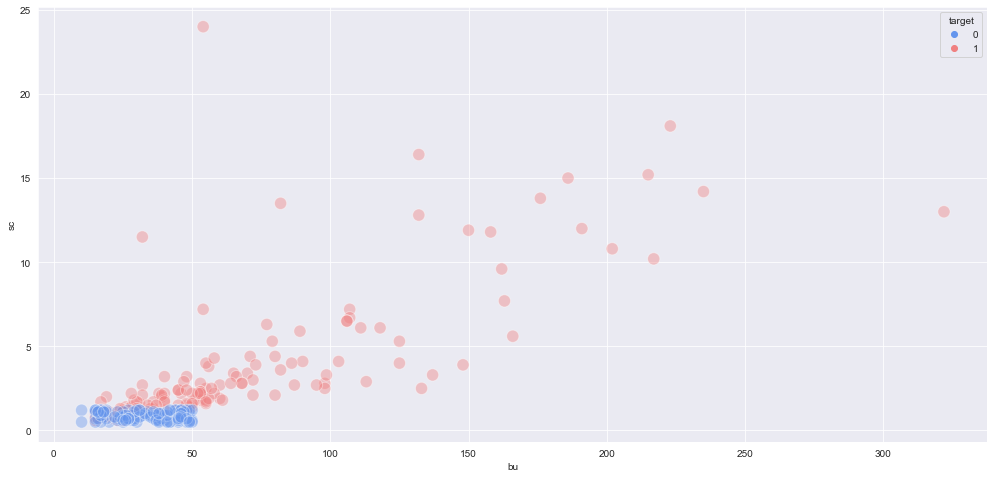

sod


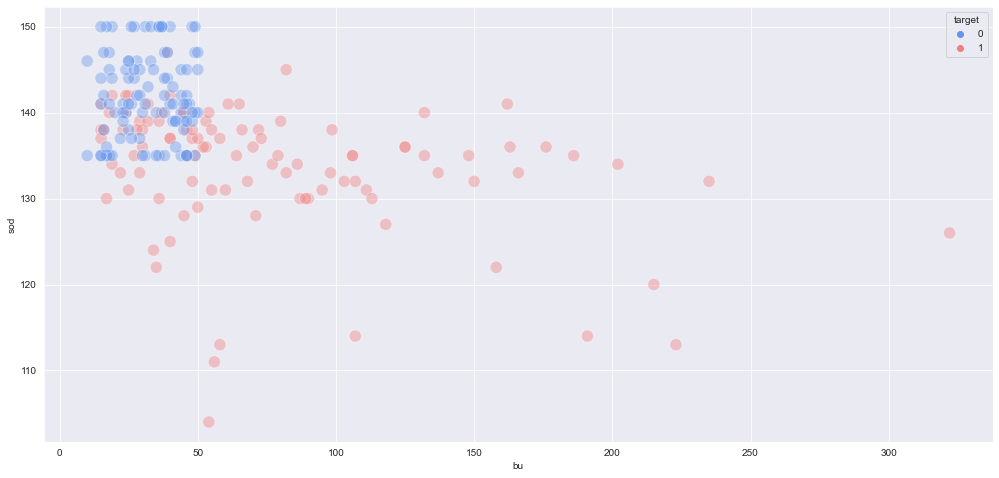

pot


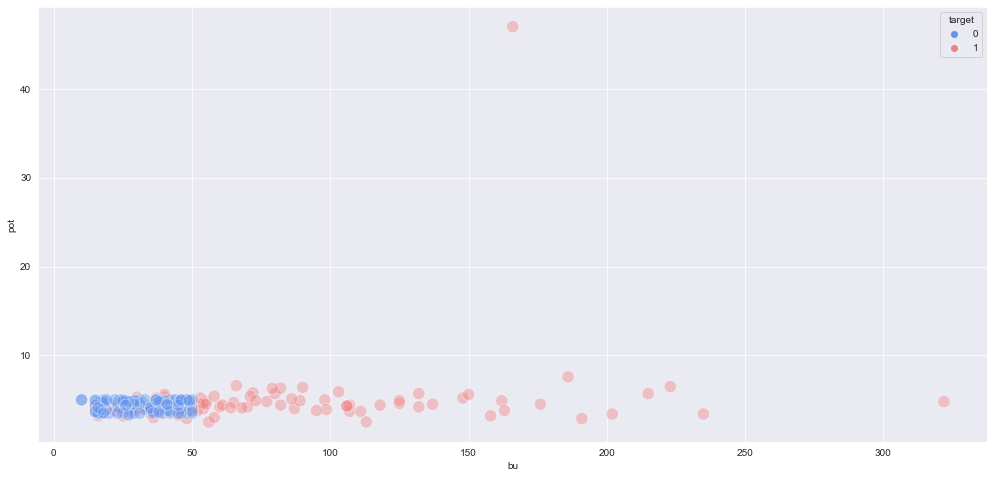

hemo


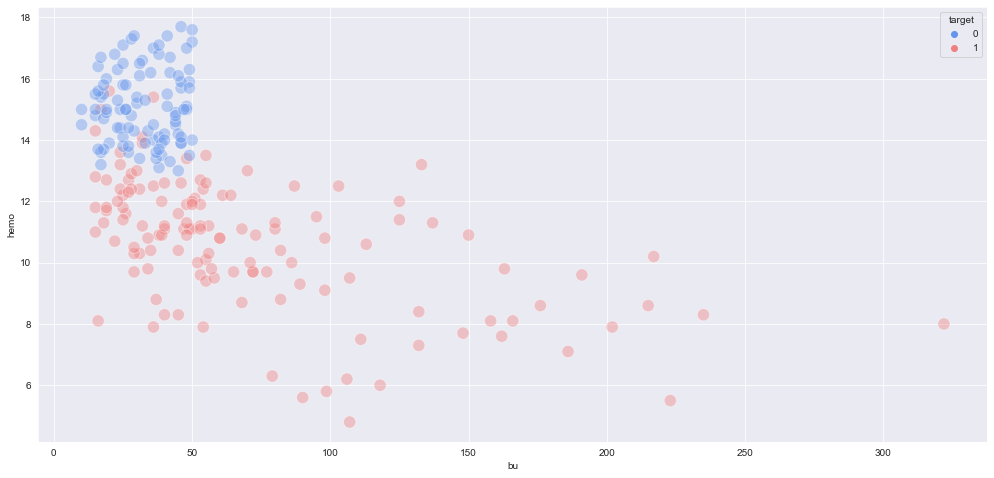

pcv


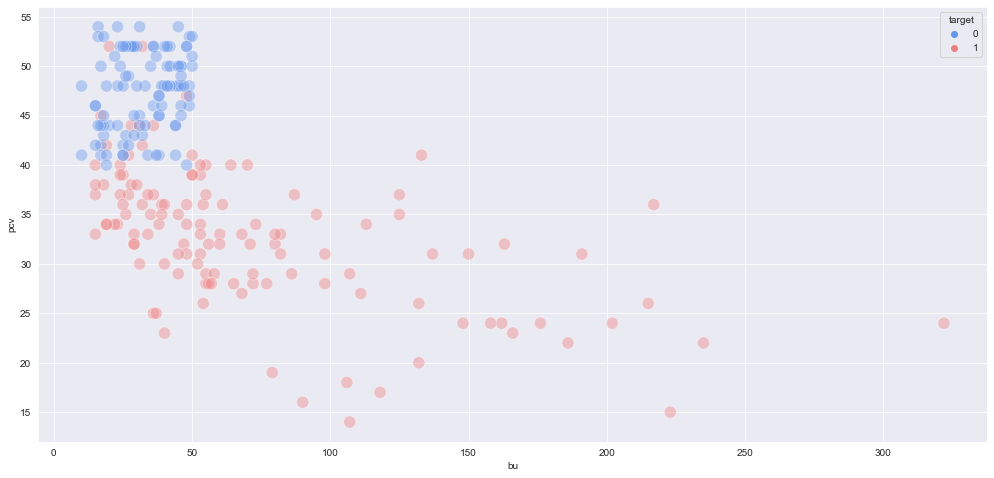

wc


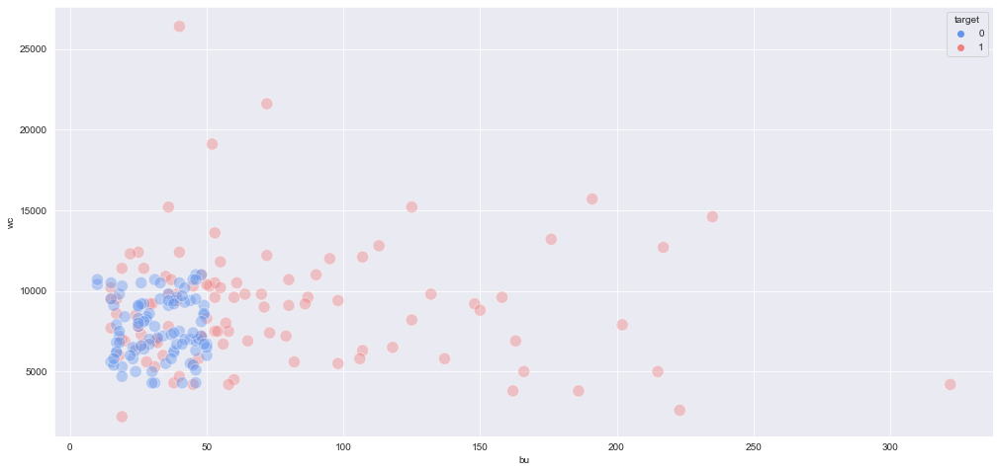

rc


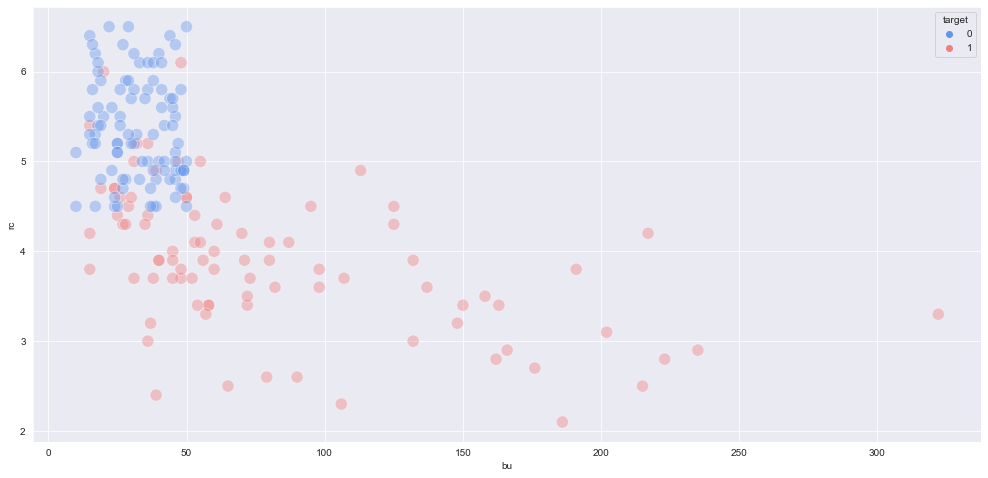

In [70]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='bu',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('bu')
    plt.ylabel(col)
    plt.show()

age


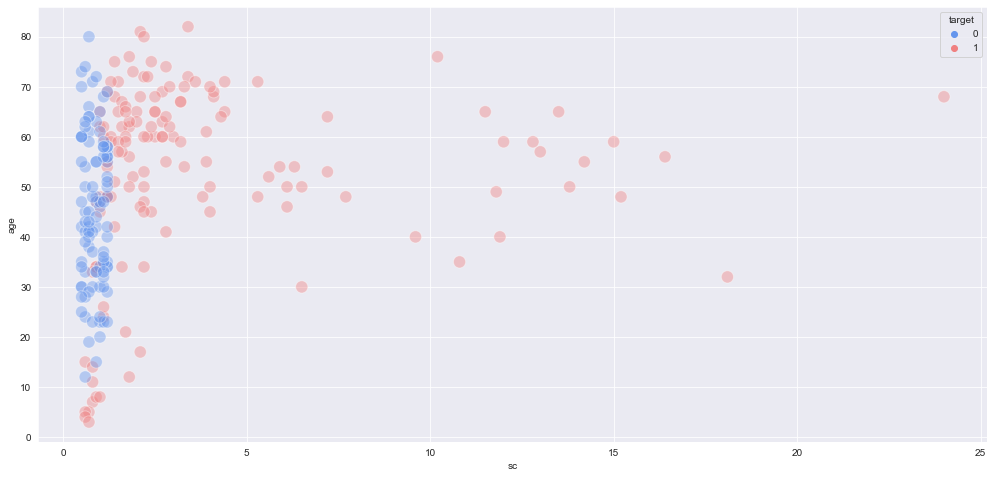

bgr


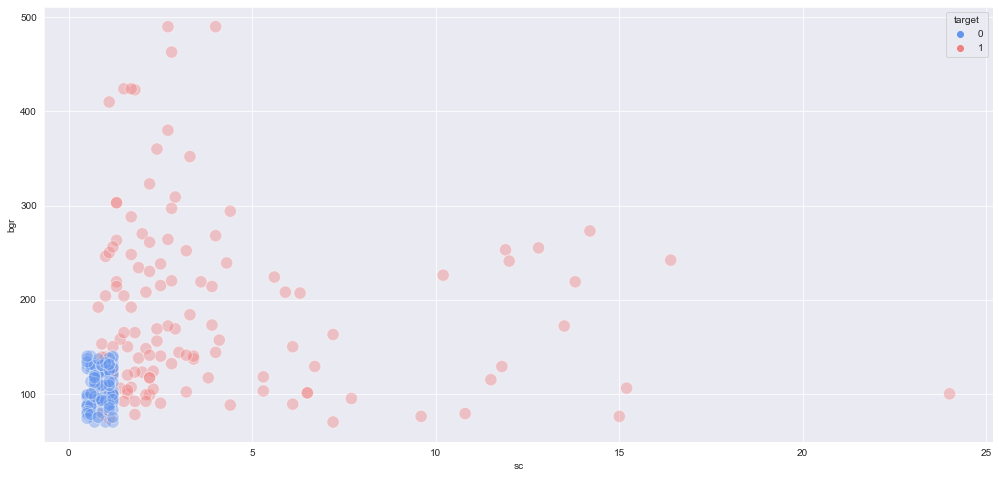

bu


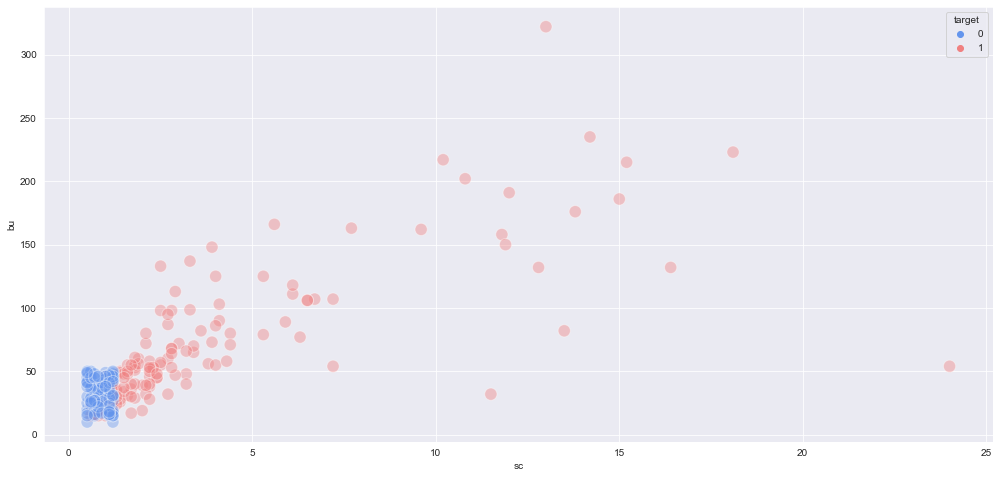

sc


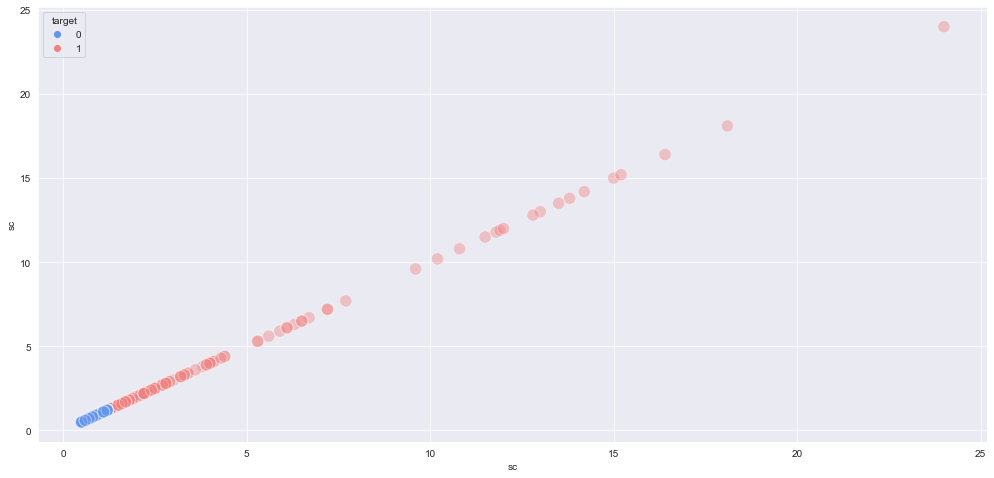

sod


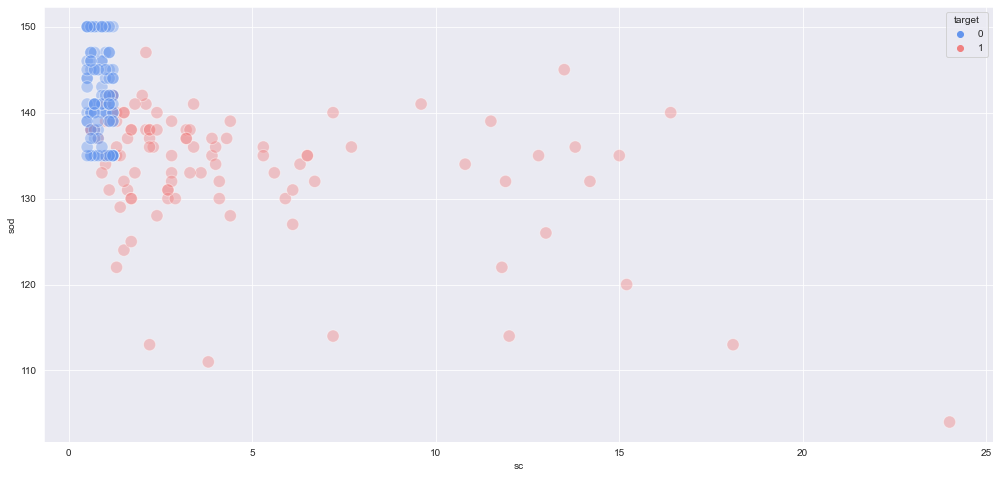

pot


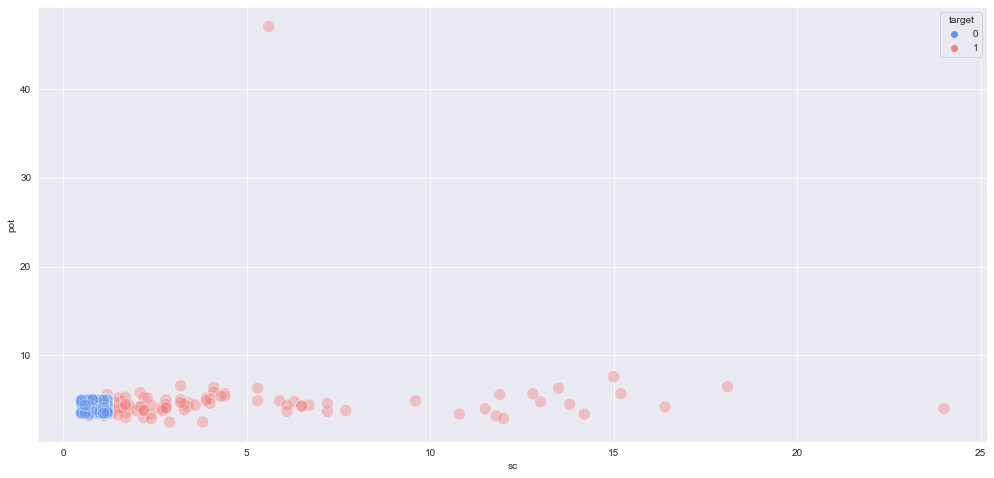

hemo


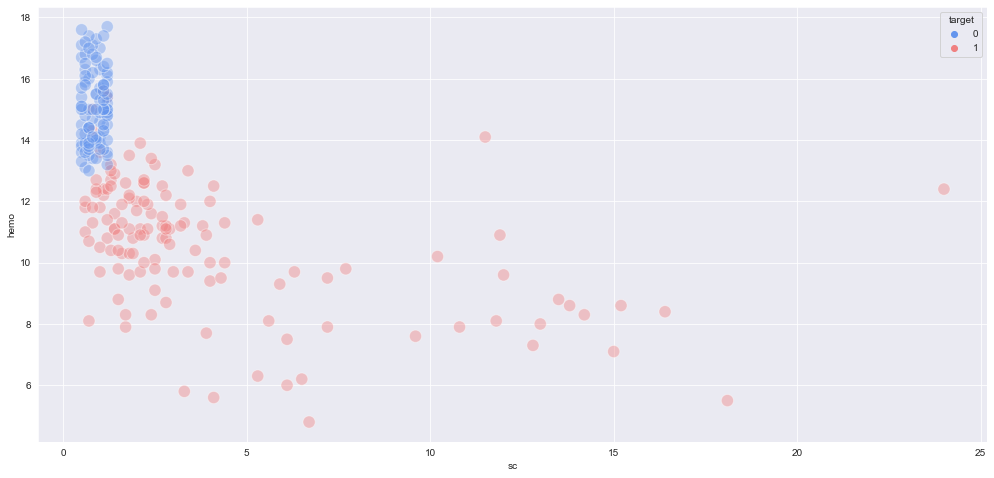

pcv


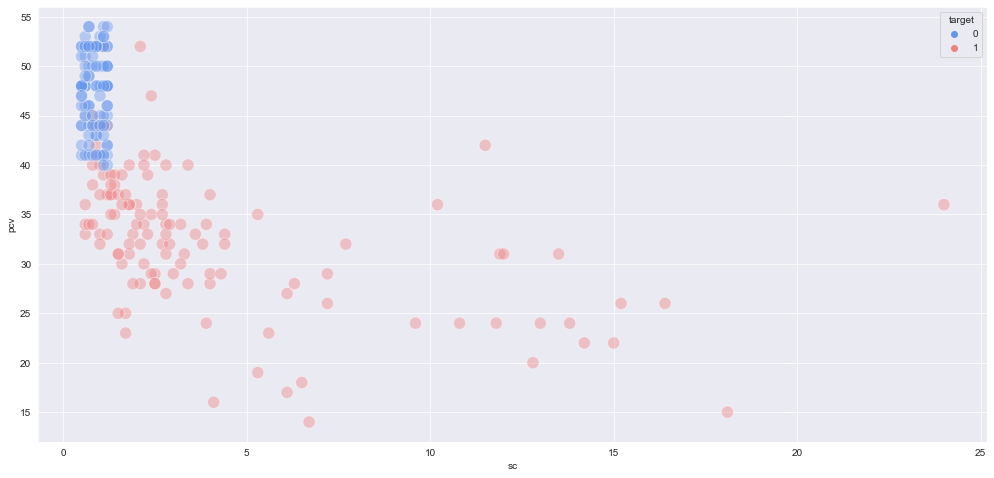

wc


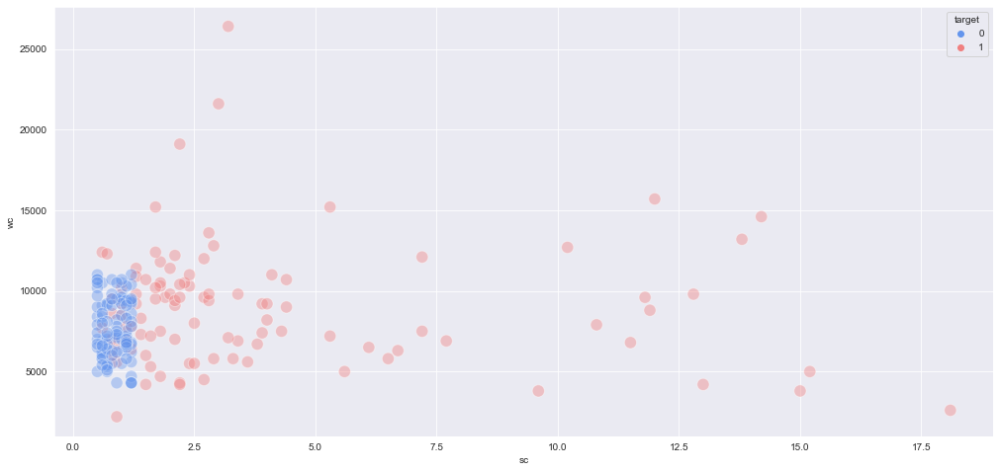

rc


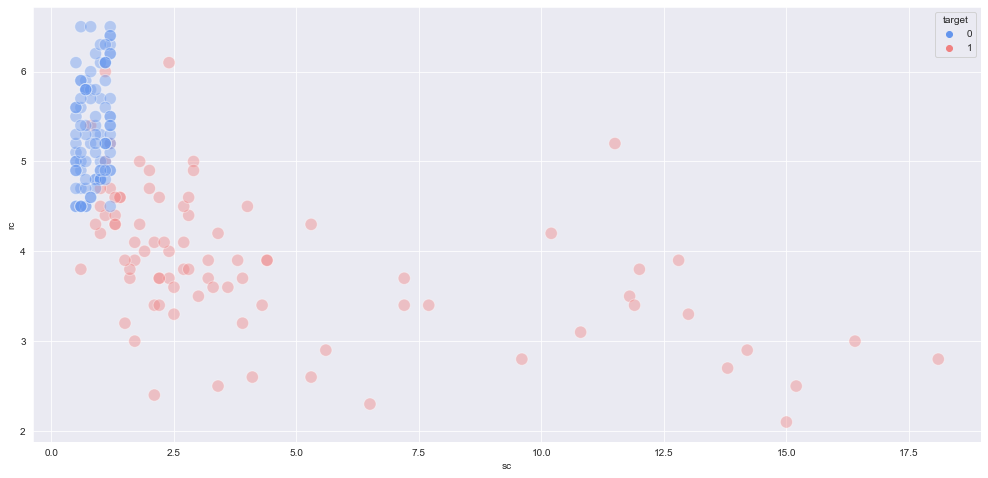

In [71]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='sc',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('sc')
    plt.ylabel(col)
    plt.show()

age


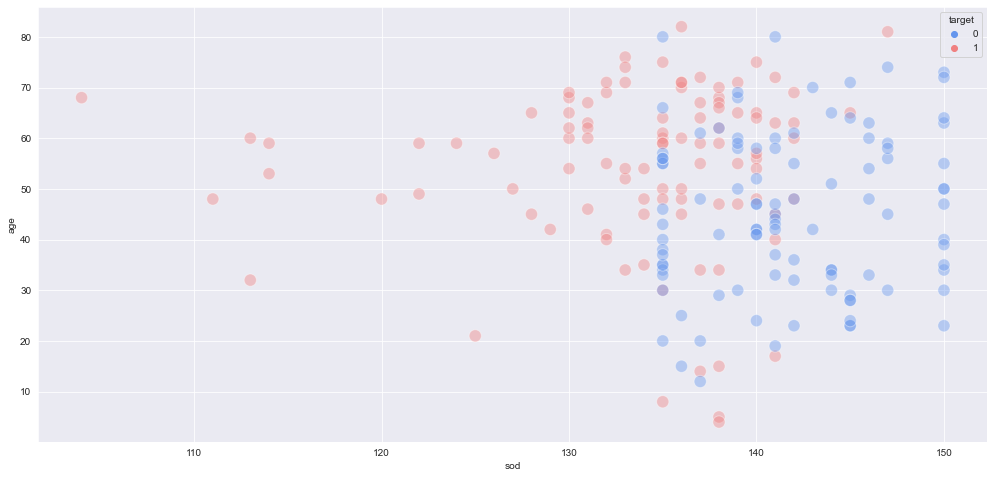

bgr


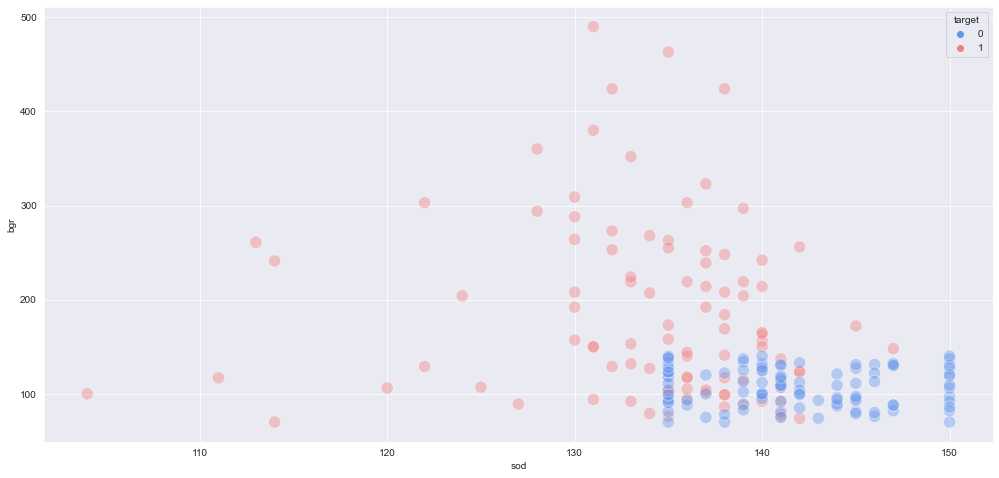

bu


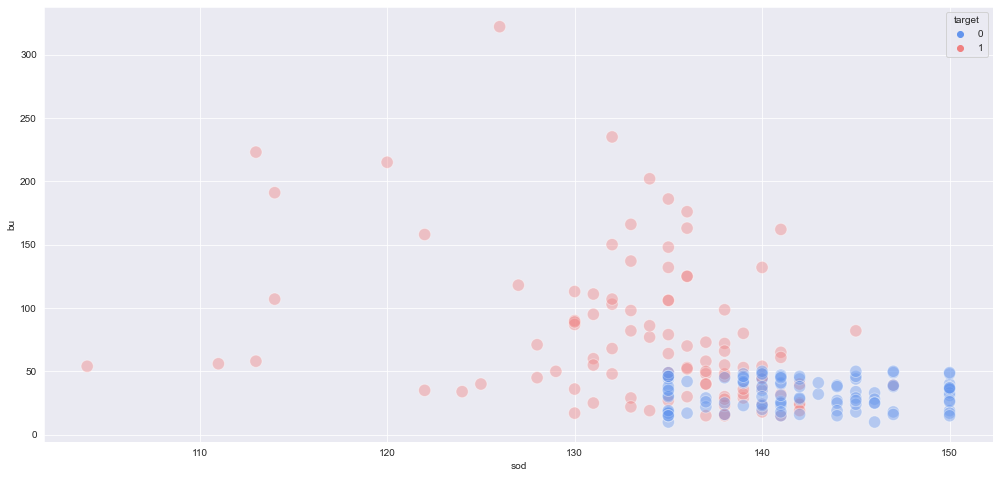

sc


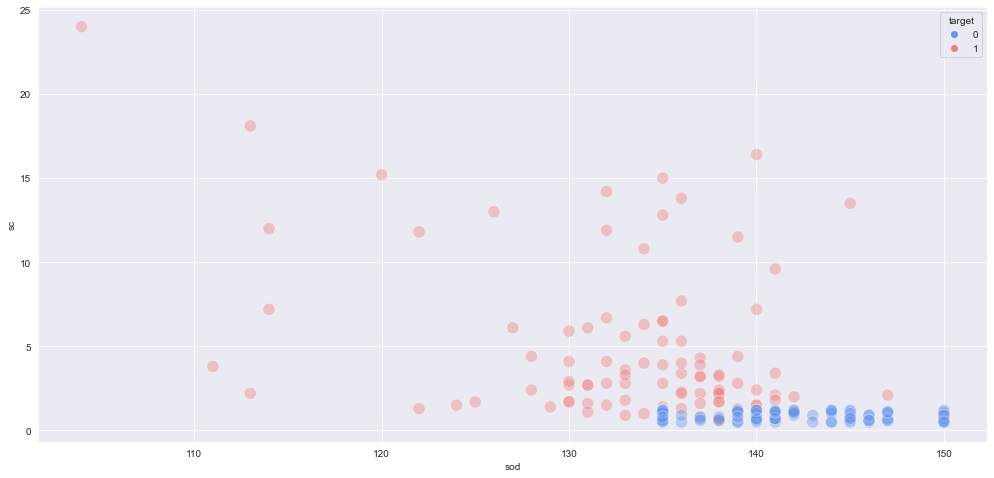

sod


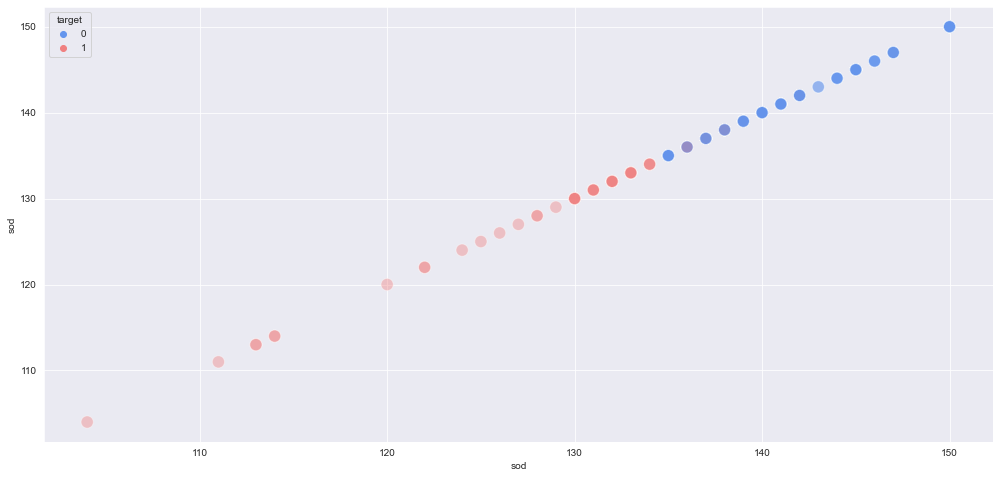

pot


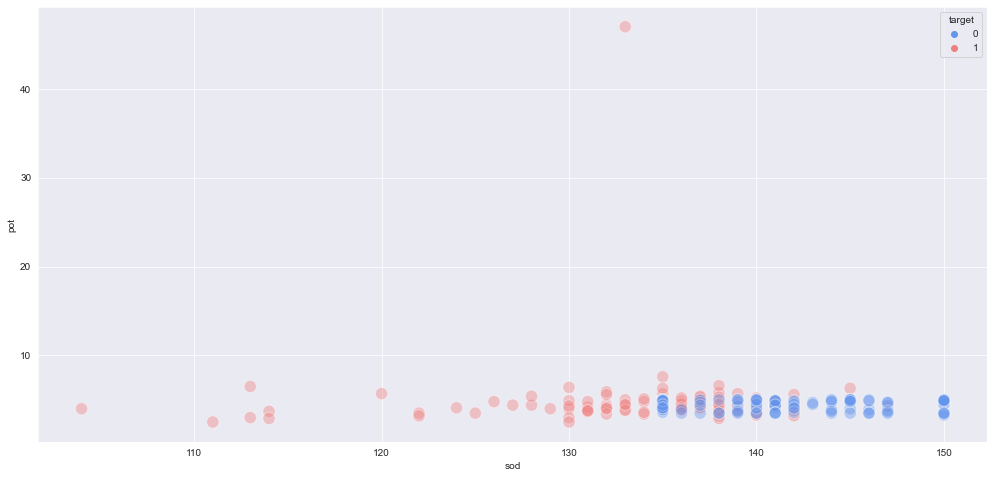

hemo


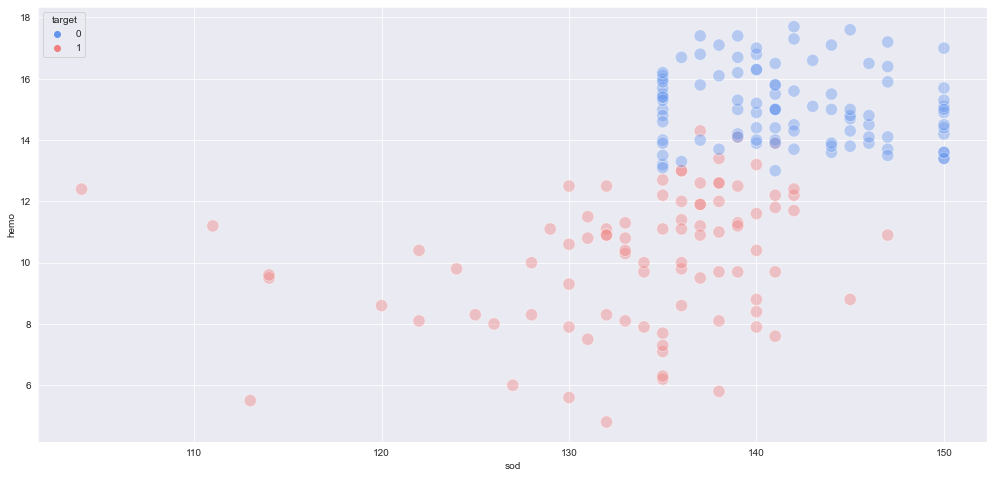

pcv


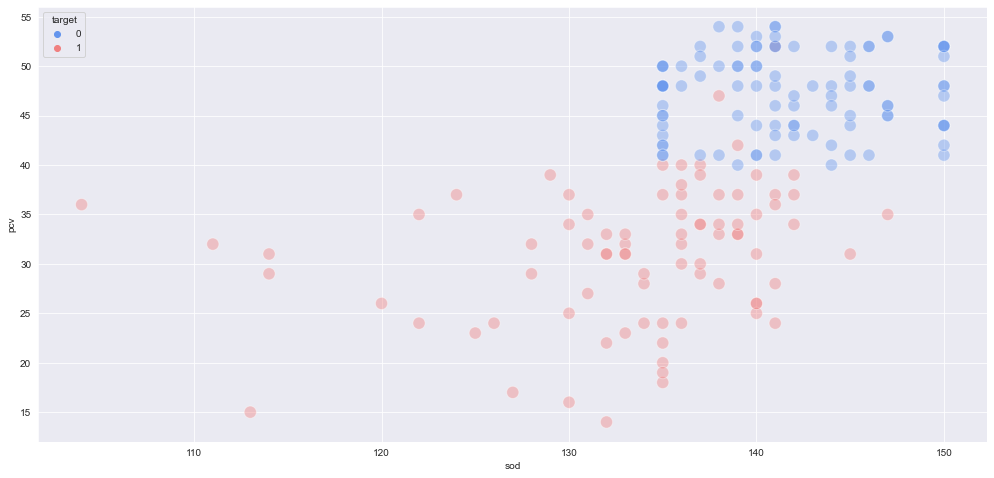

wc


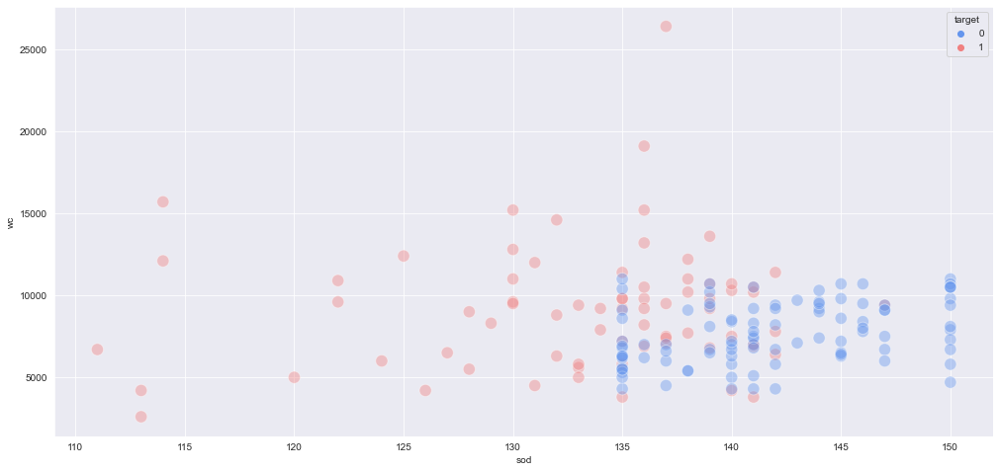

rc


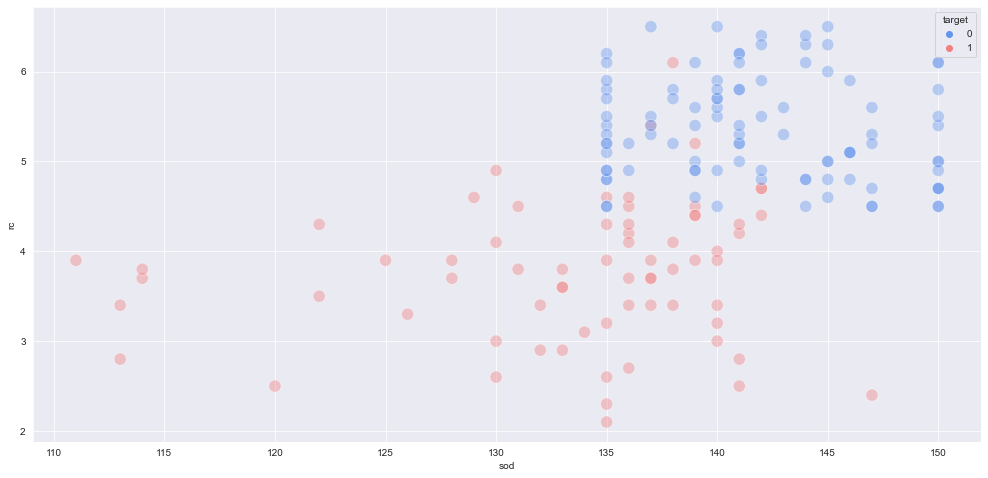

In [72]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='sod',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('sod')
    plt.ylabel(col)
    plt.show()

age


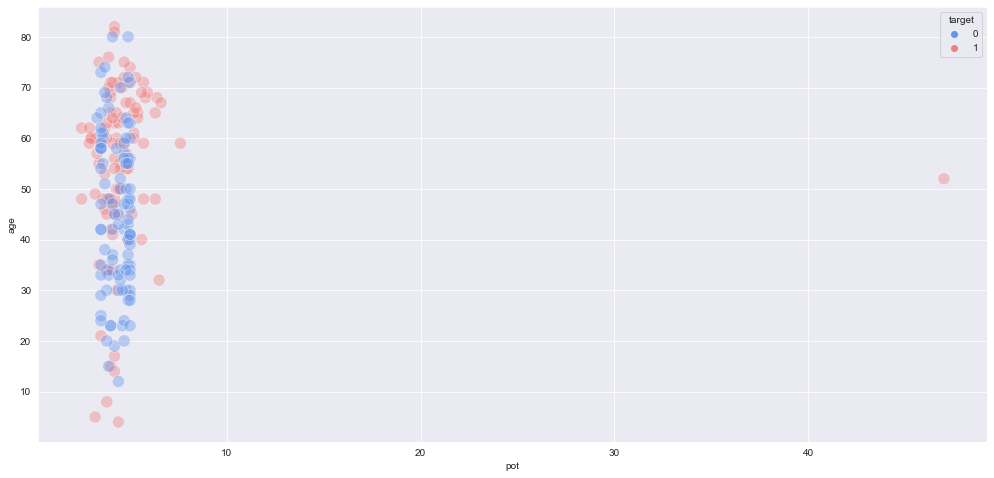

bgr


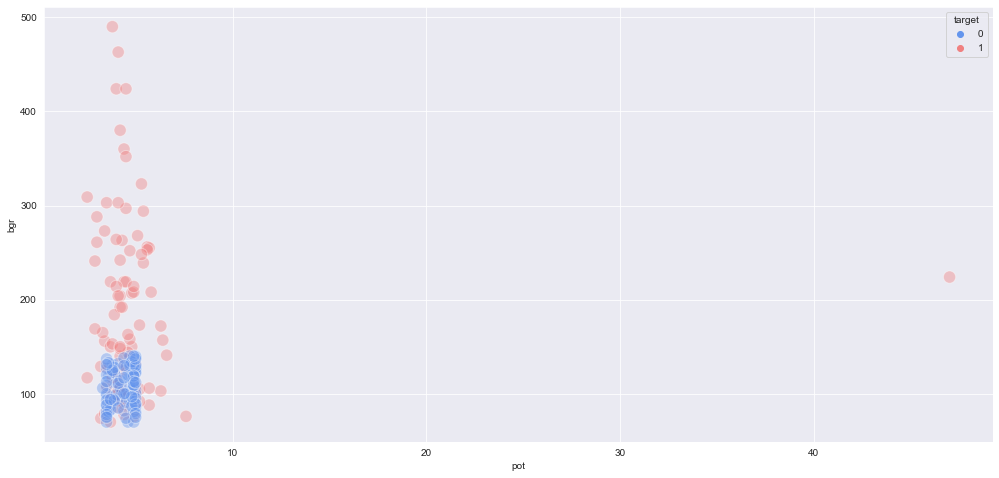

bu


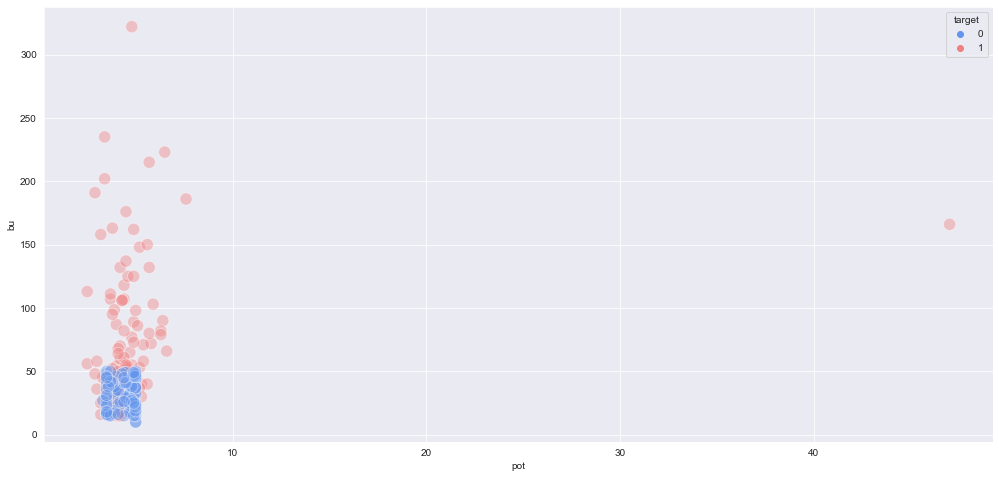

sc


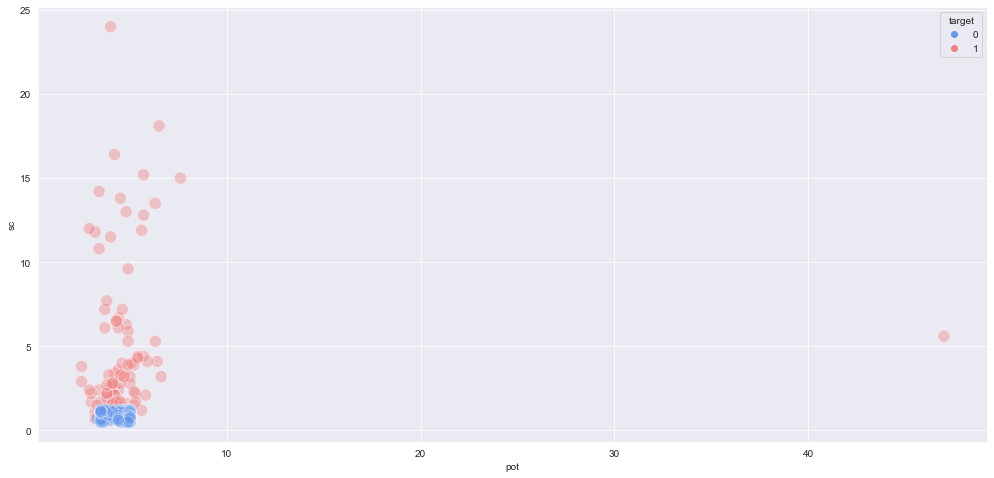

sod


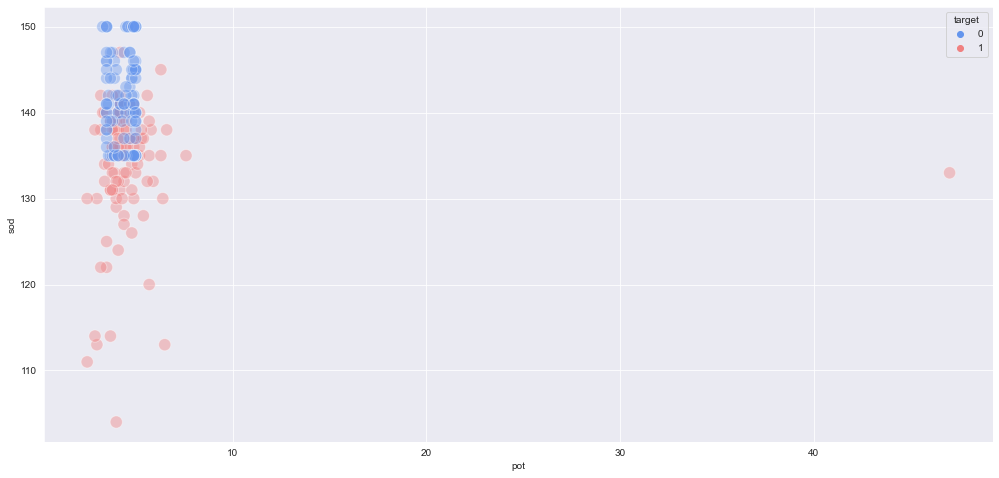

pot


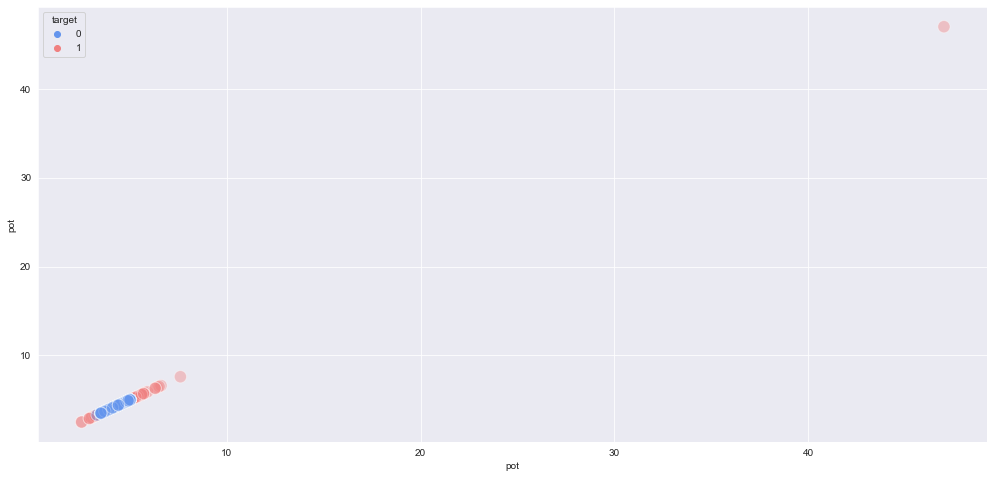

hemo


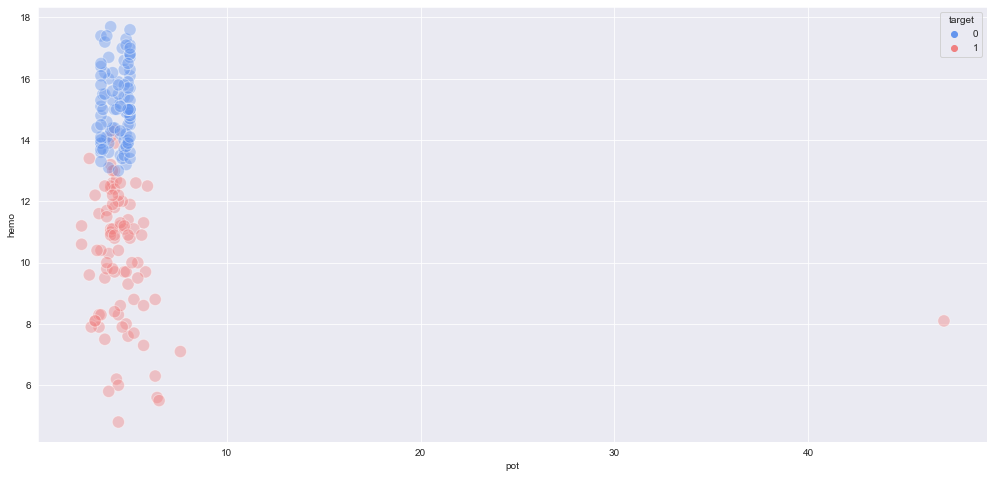

pcv


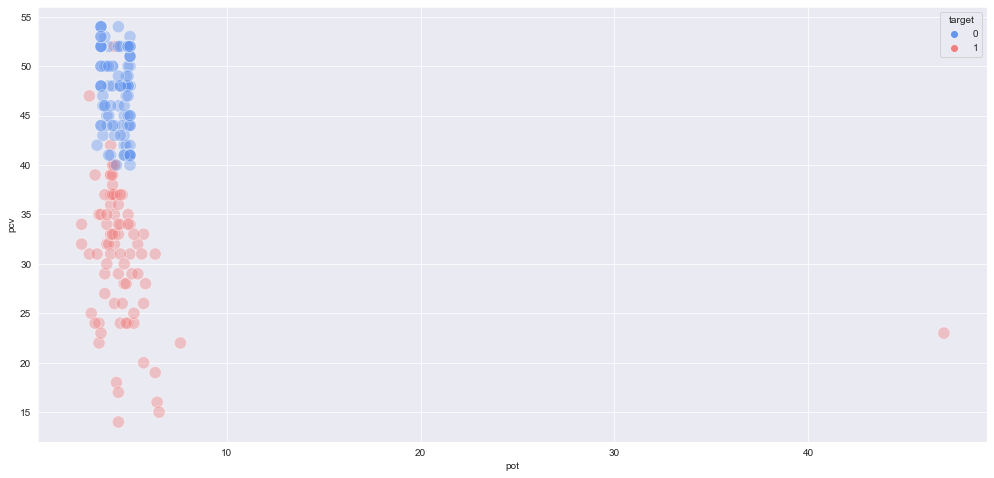

wc


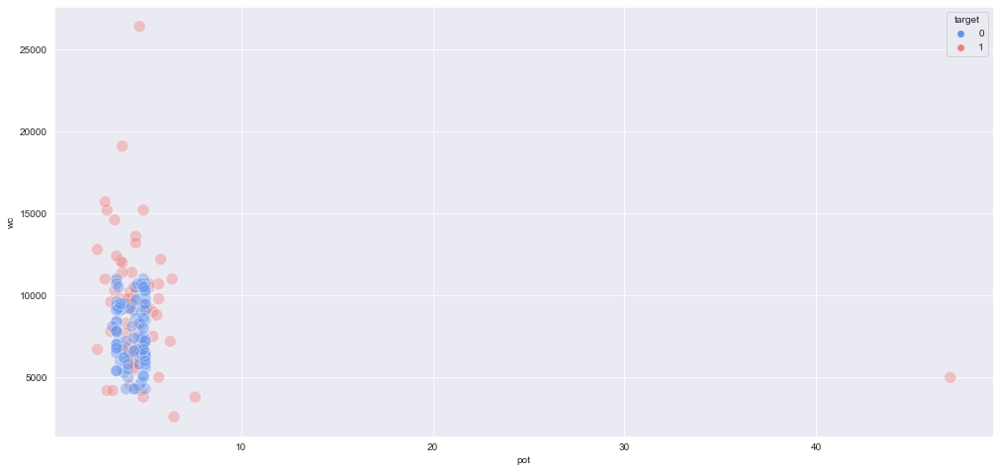

rc


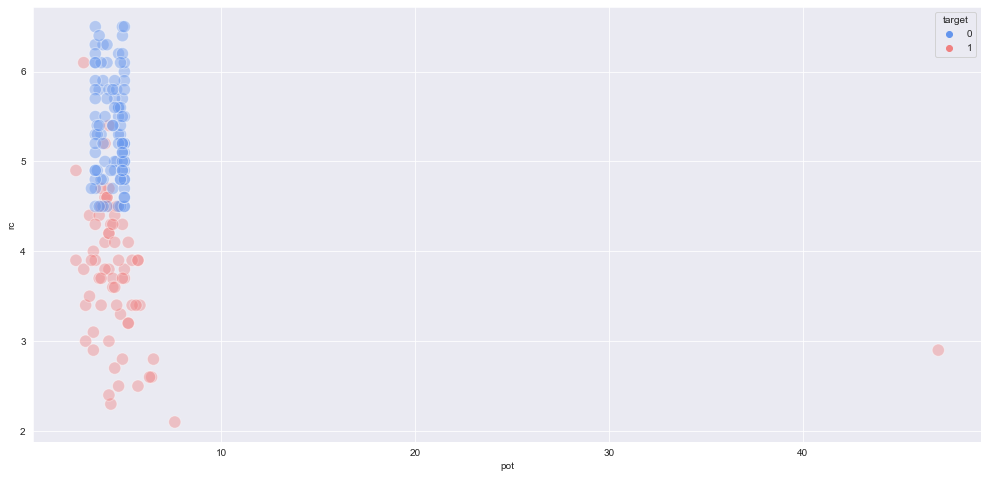

In [73]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='pot',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('pot')
    plt.ylabel(col)
    plt.show()

age


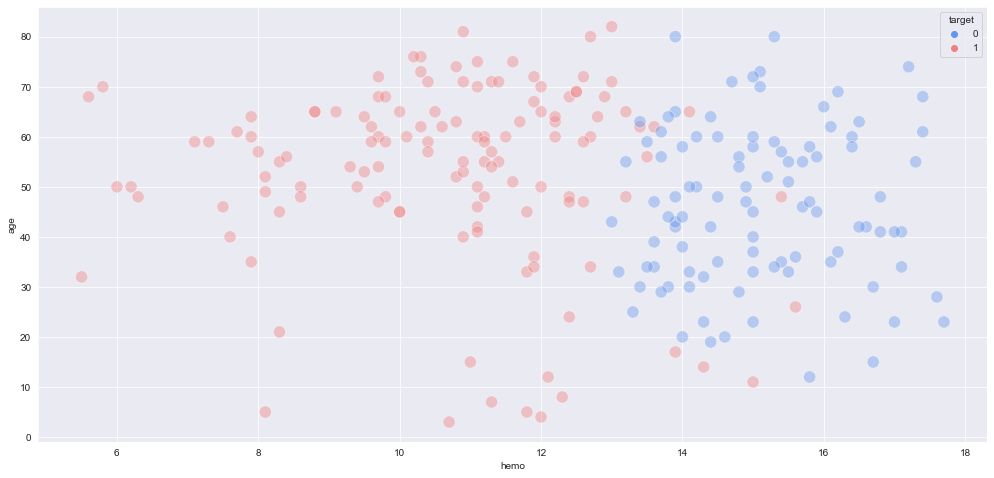

bgr


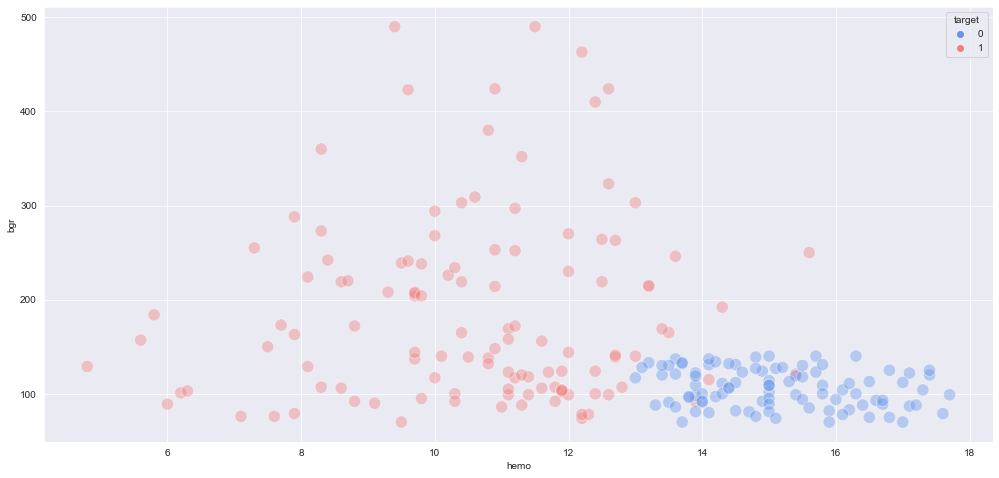

bu


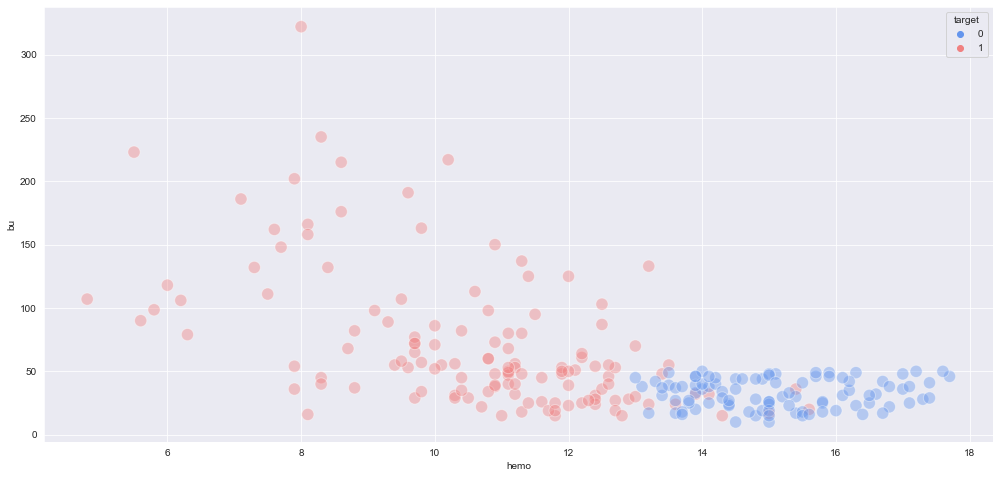

sc


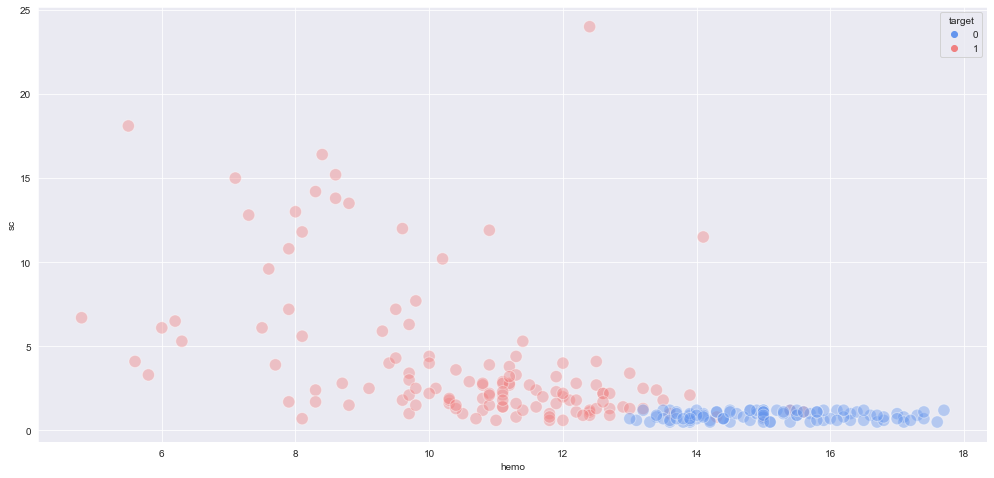

sod


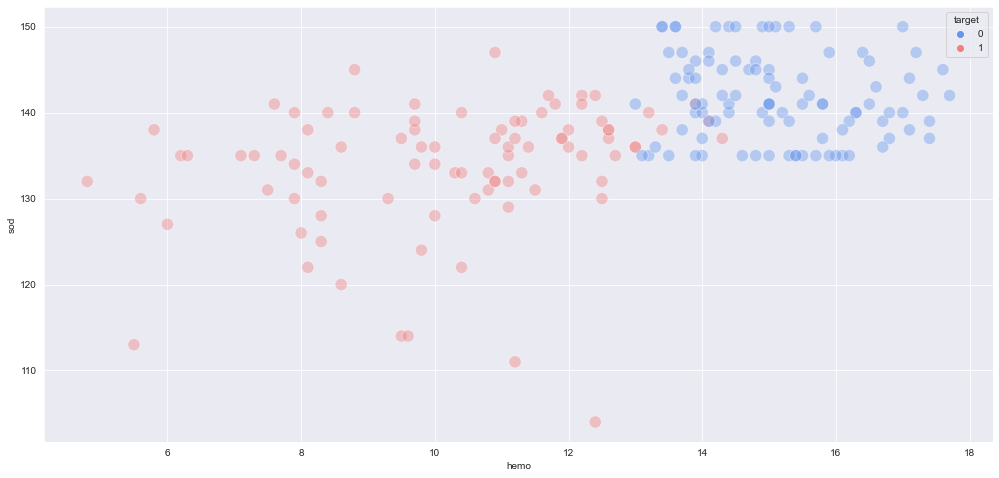

pot


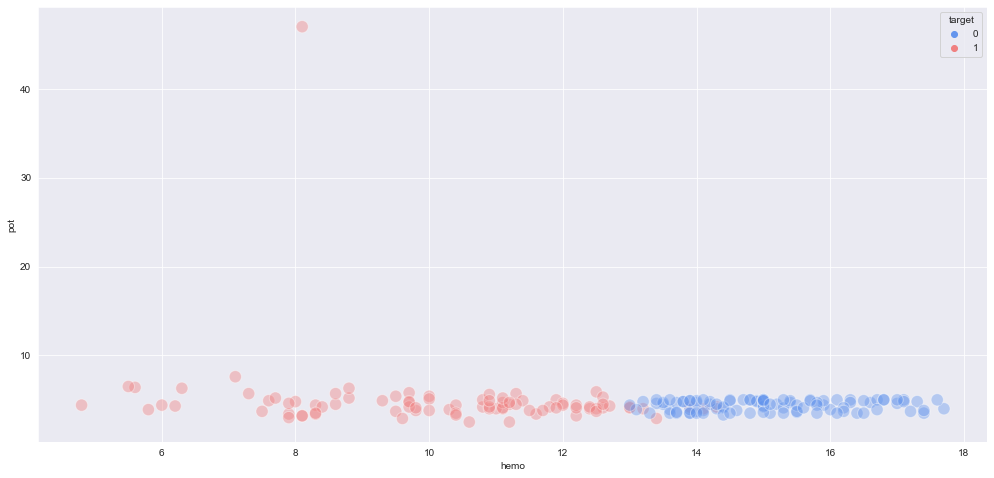

hemo


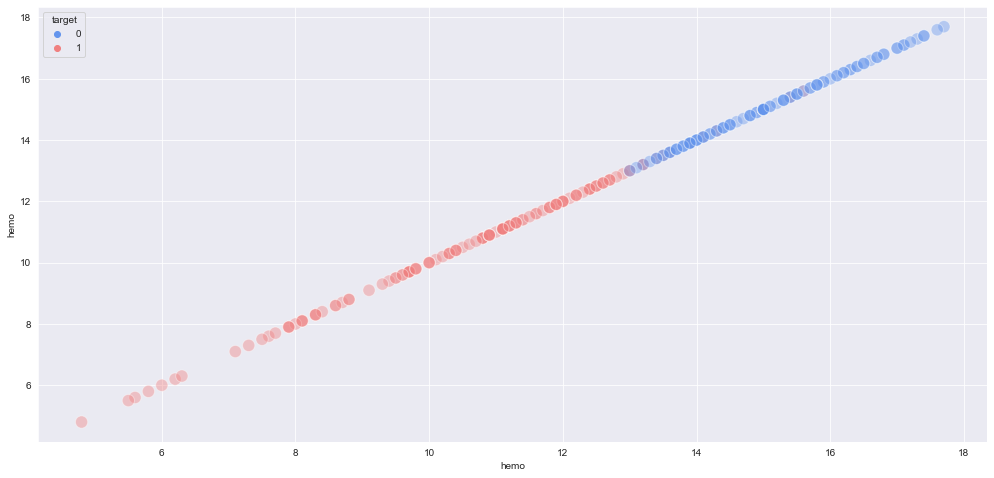

pcv


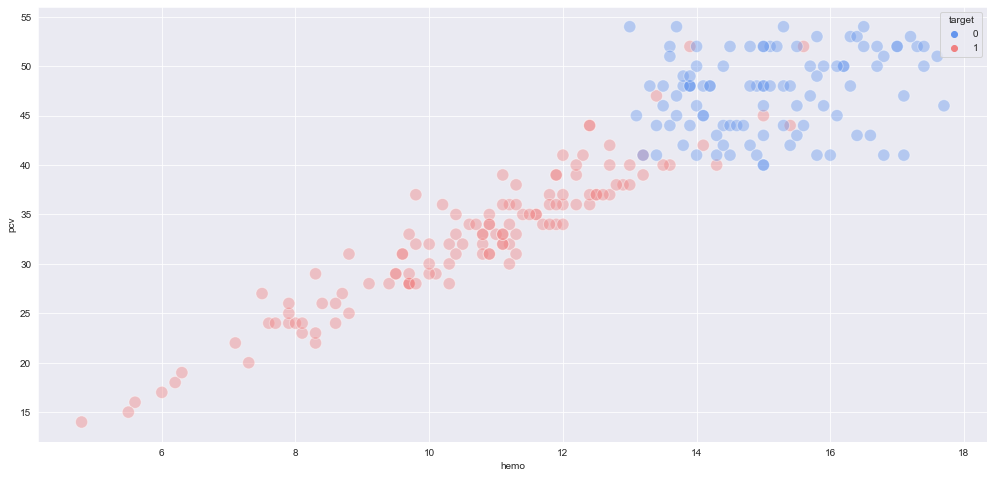

wc


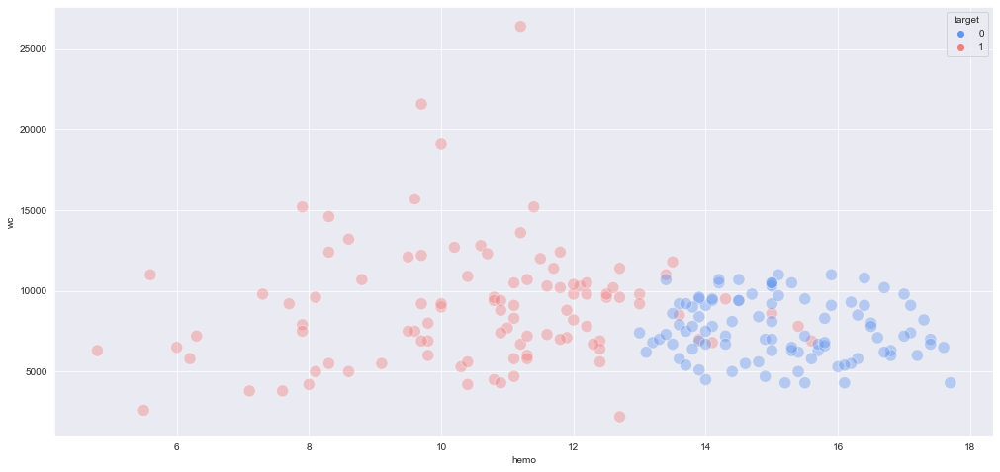

rc


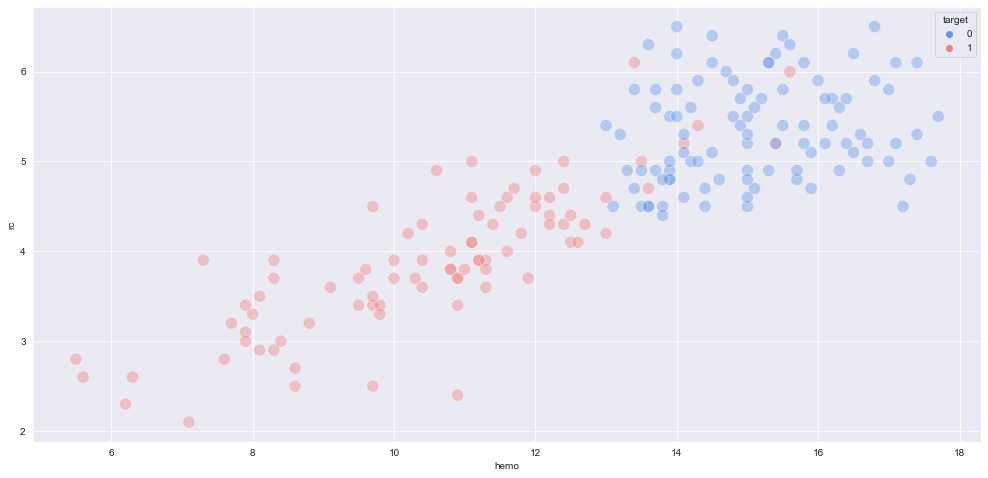

In [74]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='hemo',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('hemo')
    plt.ylabel(col)
    plt.show()

age


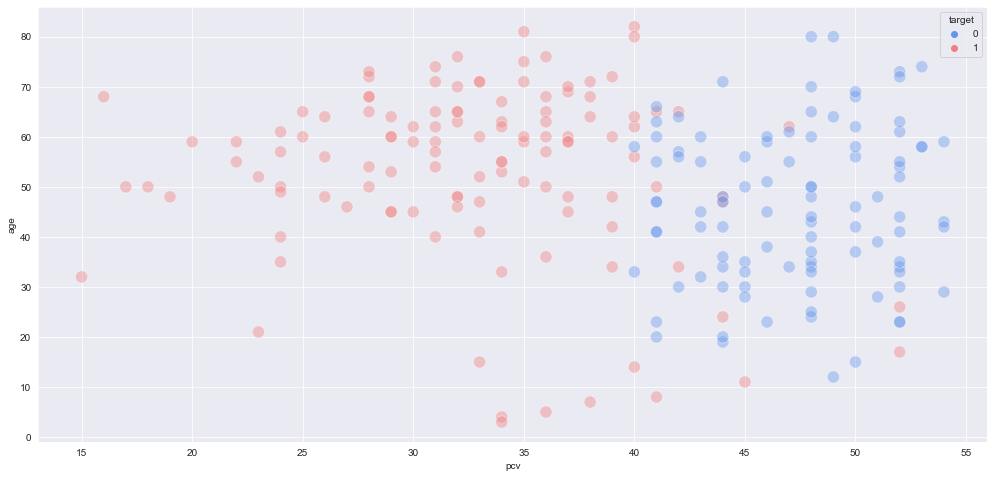

bgr


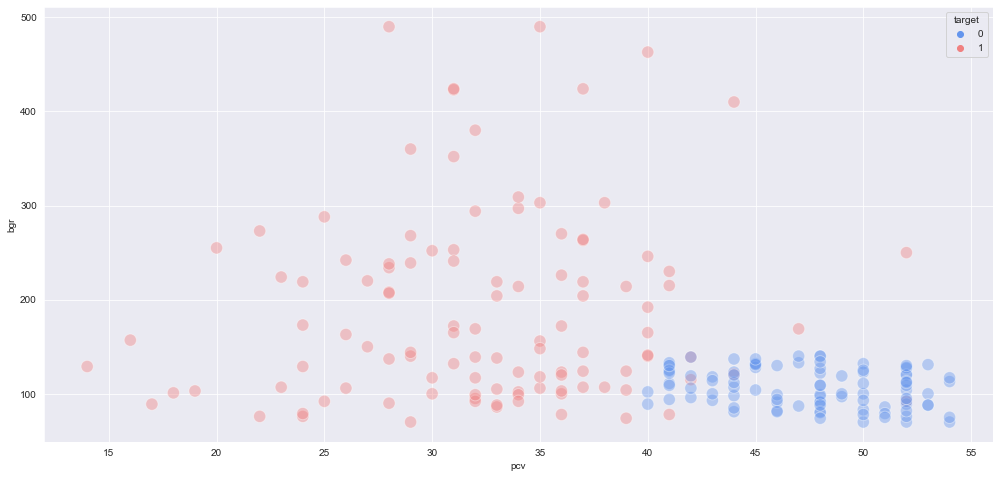

bu


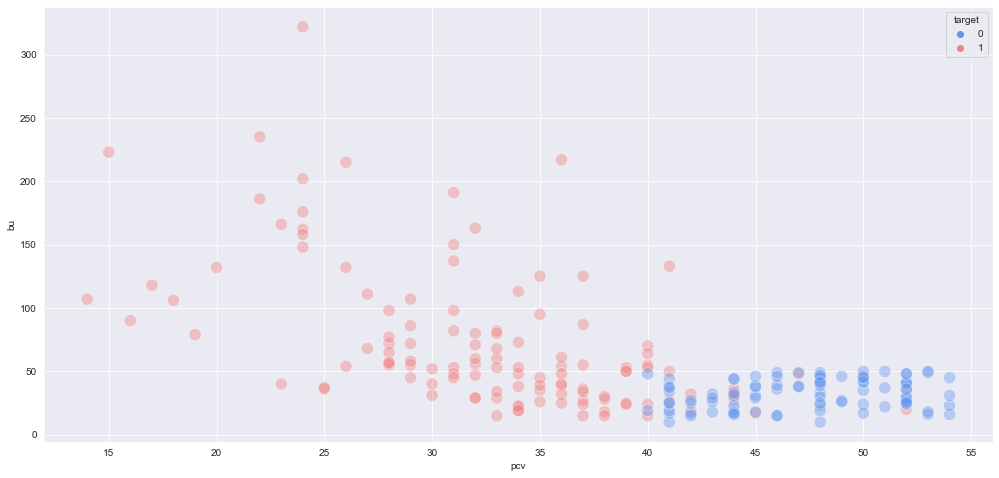

sc


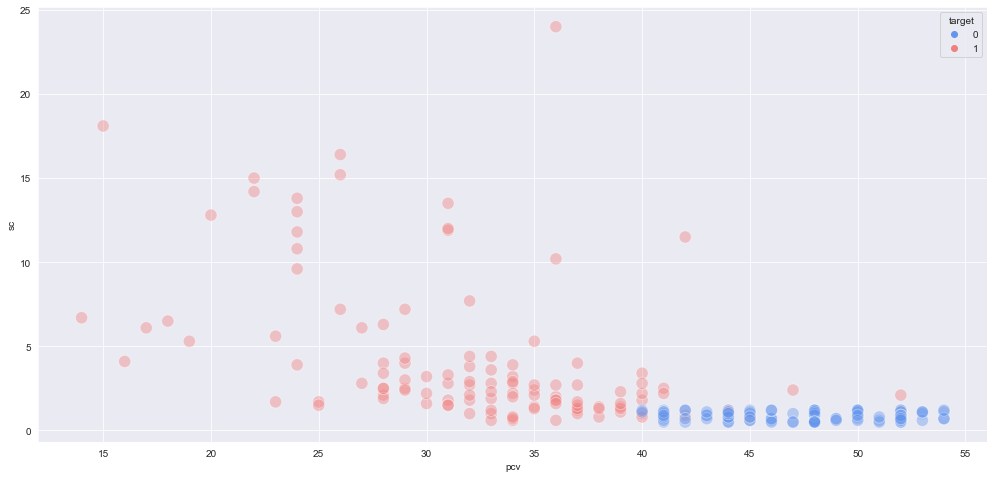

sod


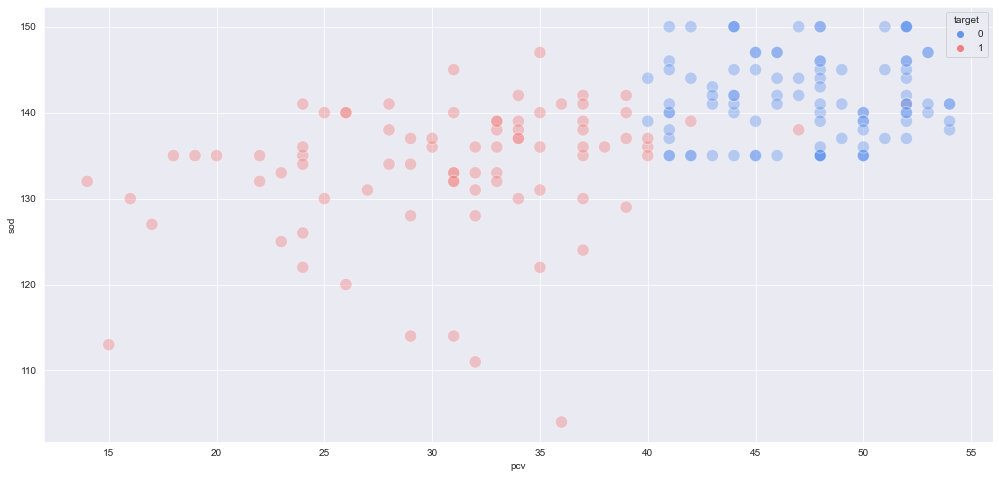

pot


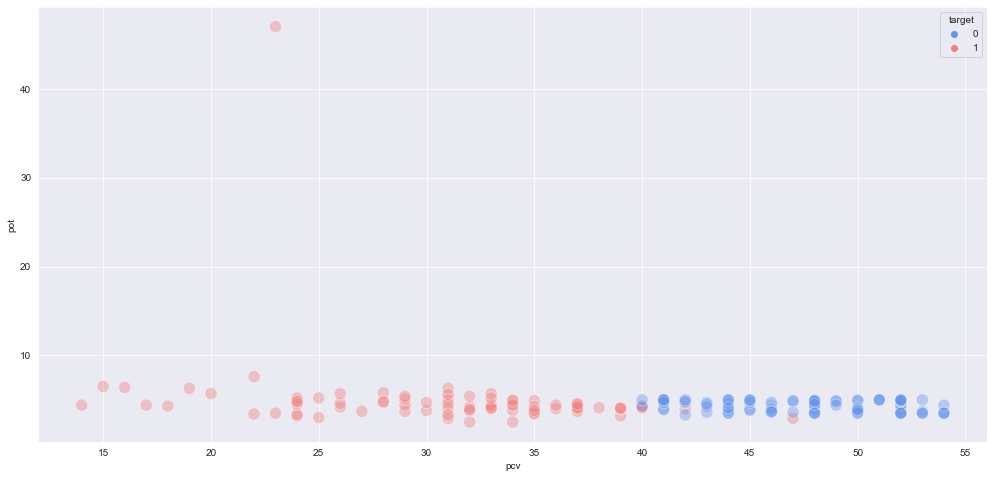

hemo


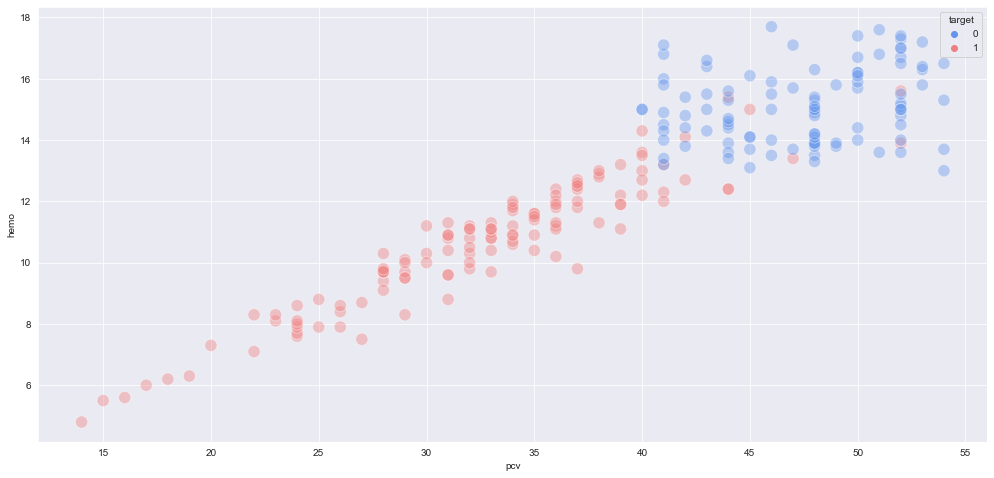

pcv


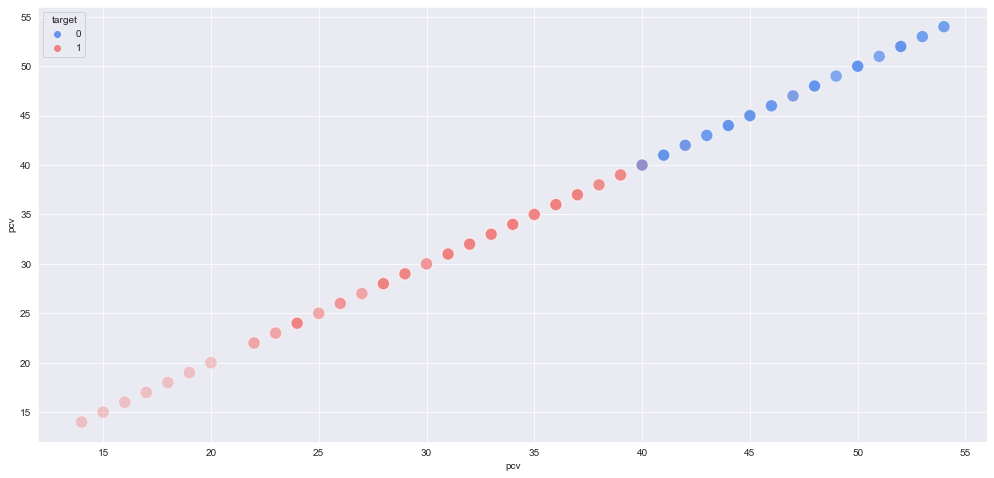

wc


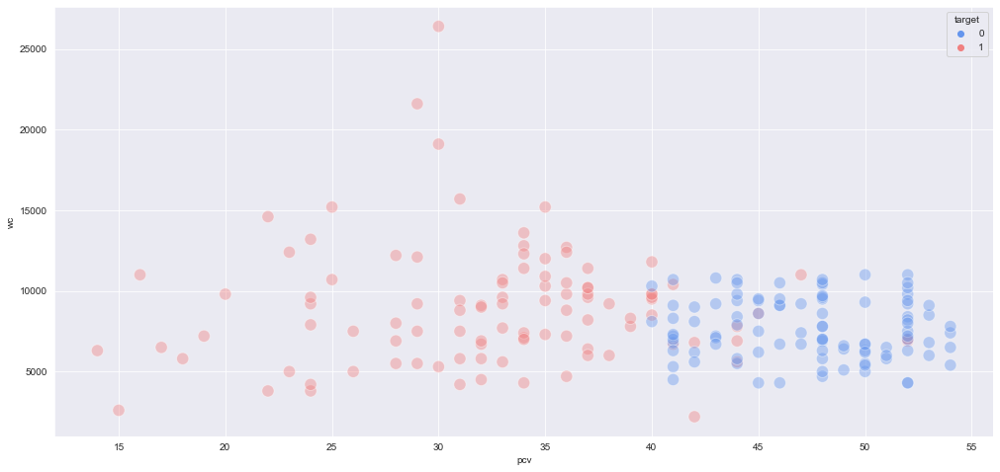

rc


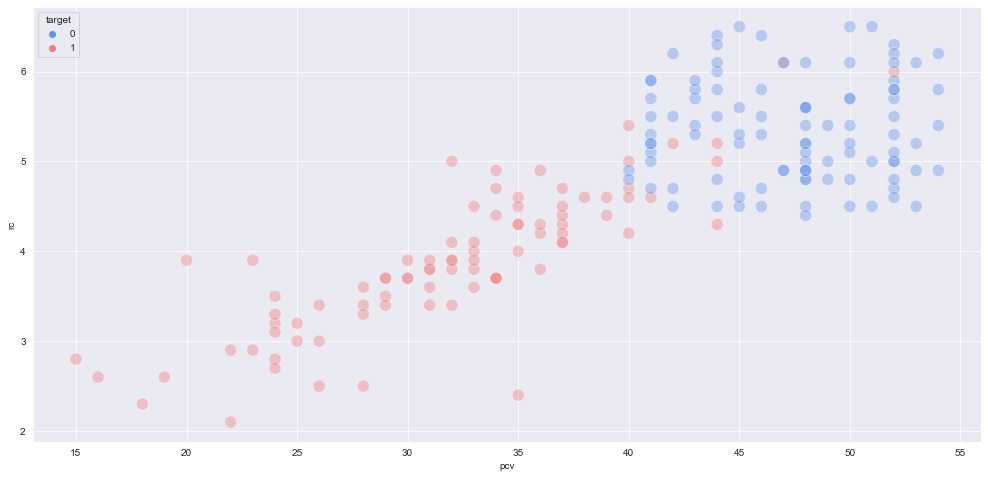

In [75]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='pcv',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('pcv')
    plt.ylabel(col)
    plt.show()

age


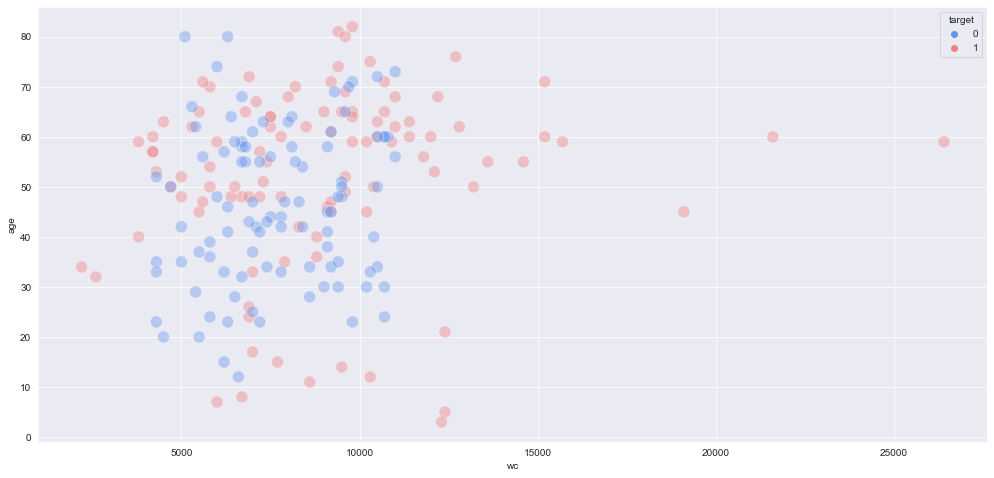

bgr


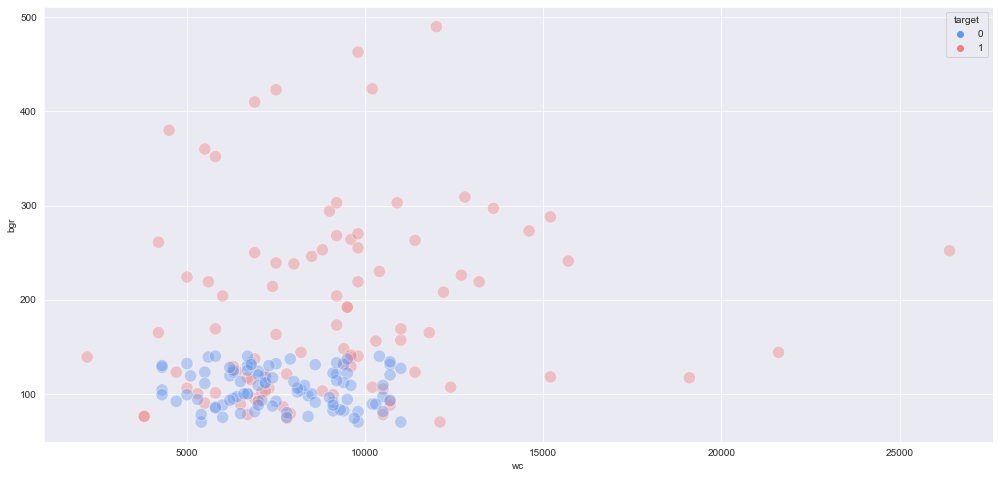

bu


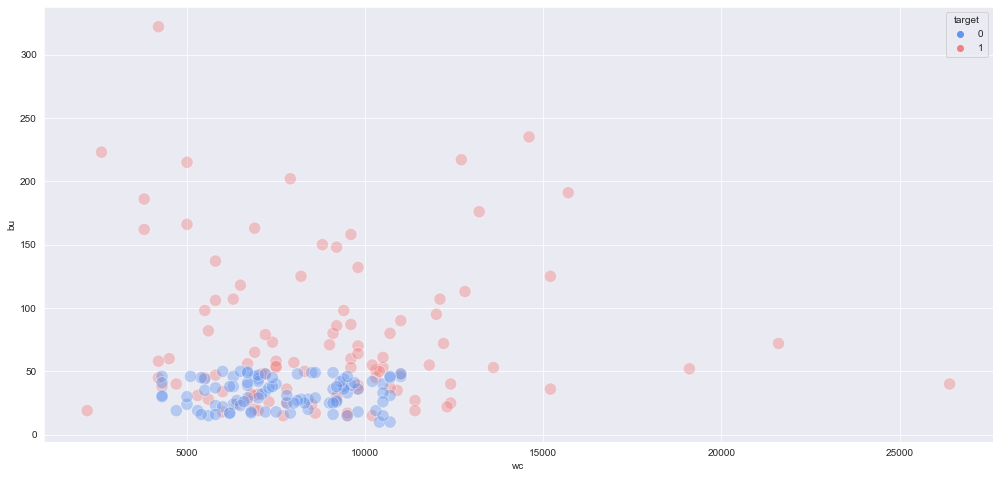

sc


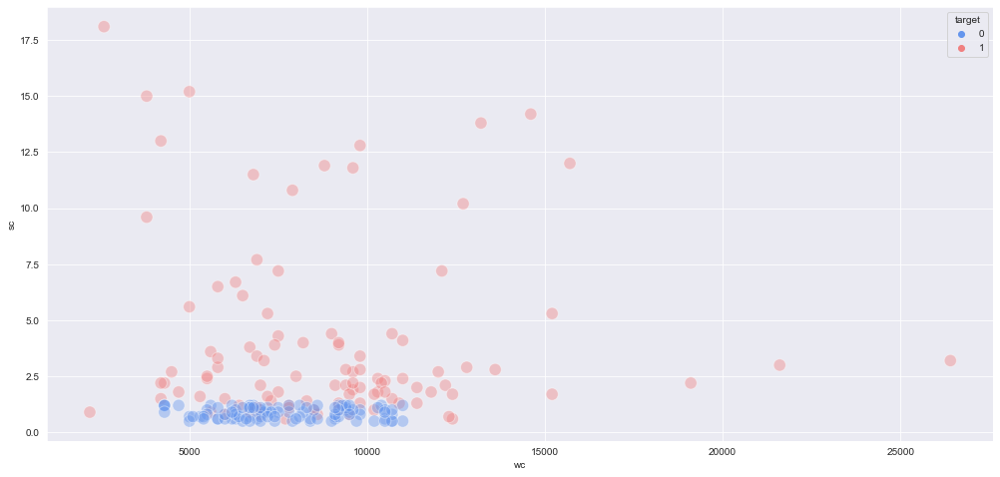

sod


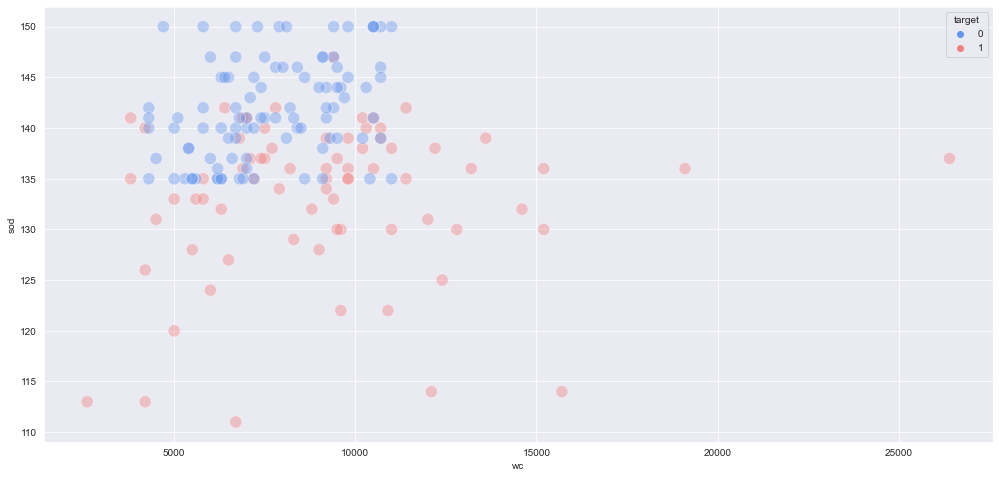

pot


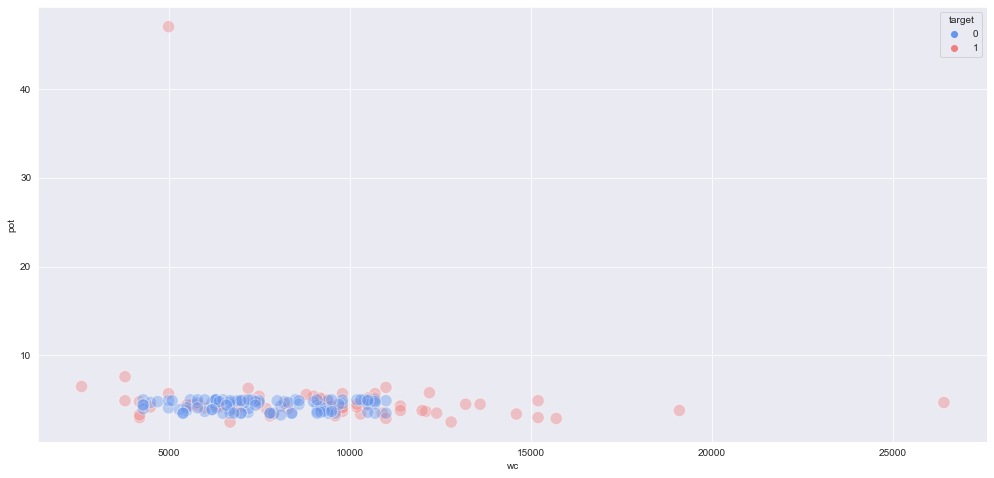

hemo


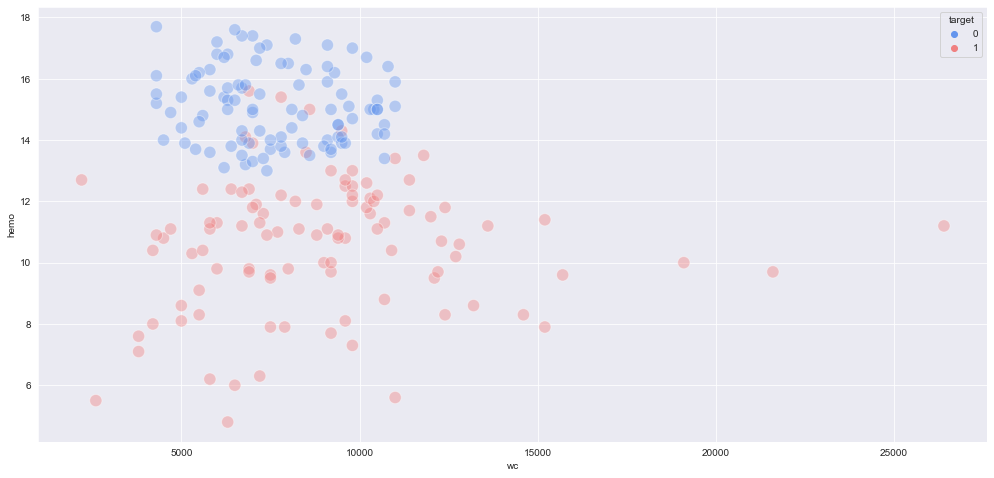

pcv


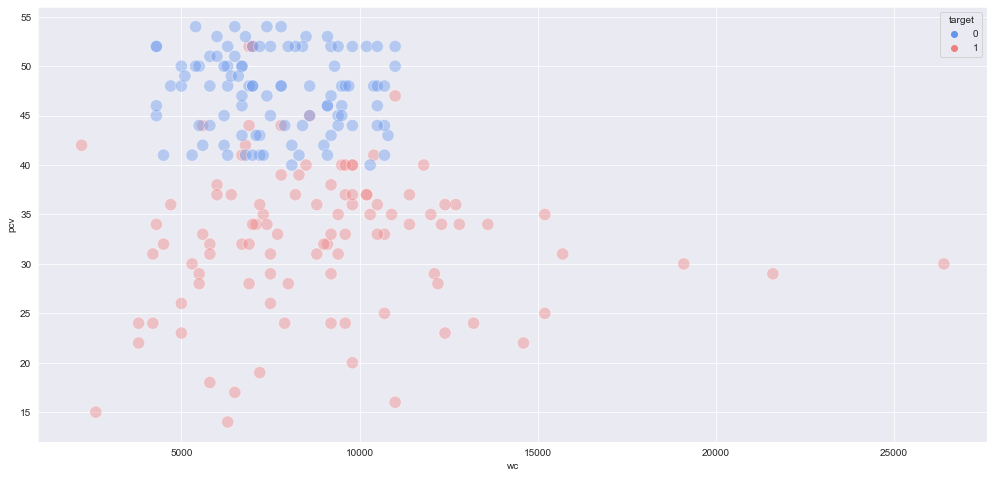

wc


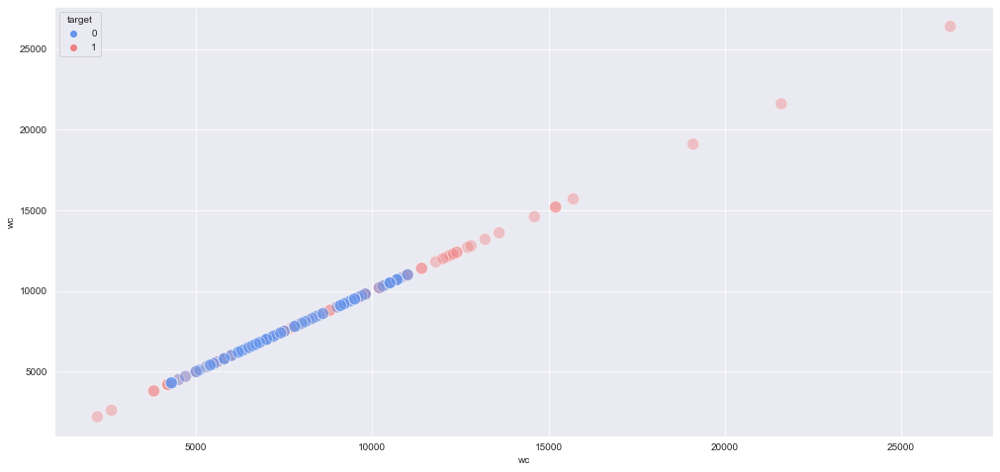

rc


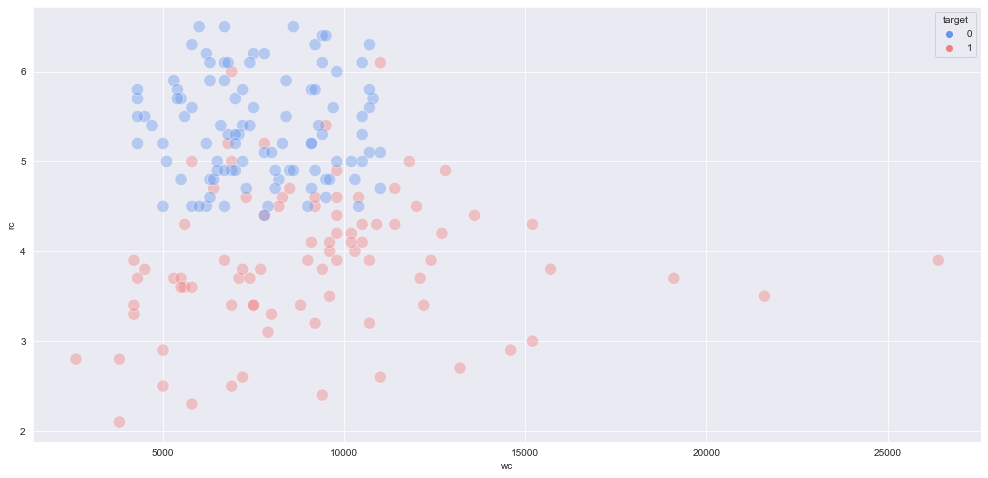

In [76]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='wc',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('wc')
    plt.ylabel(col)
    plt.show()

age


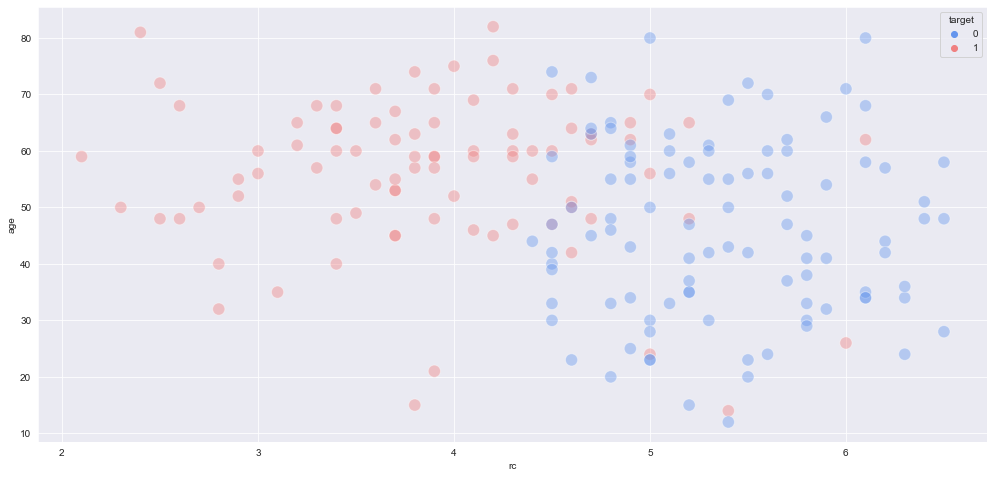

bgr


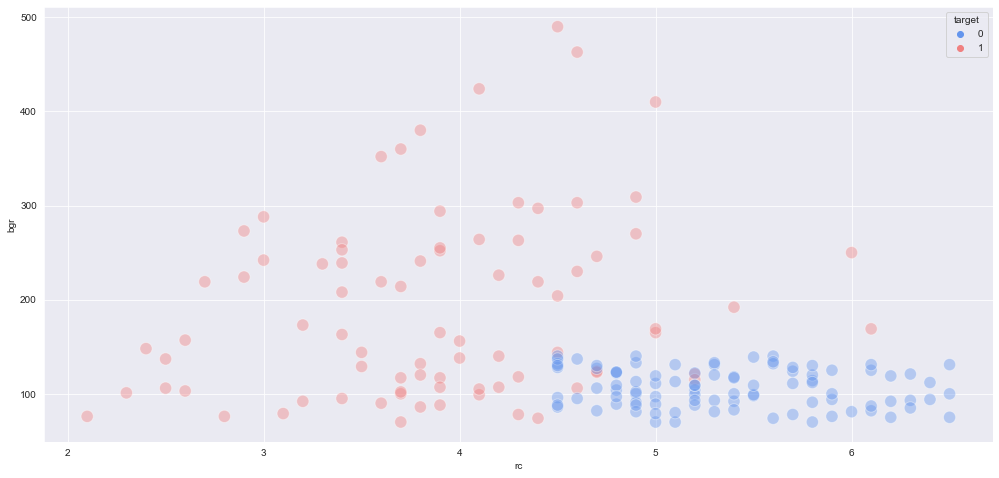

bu


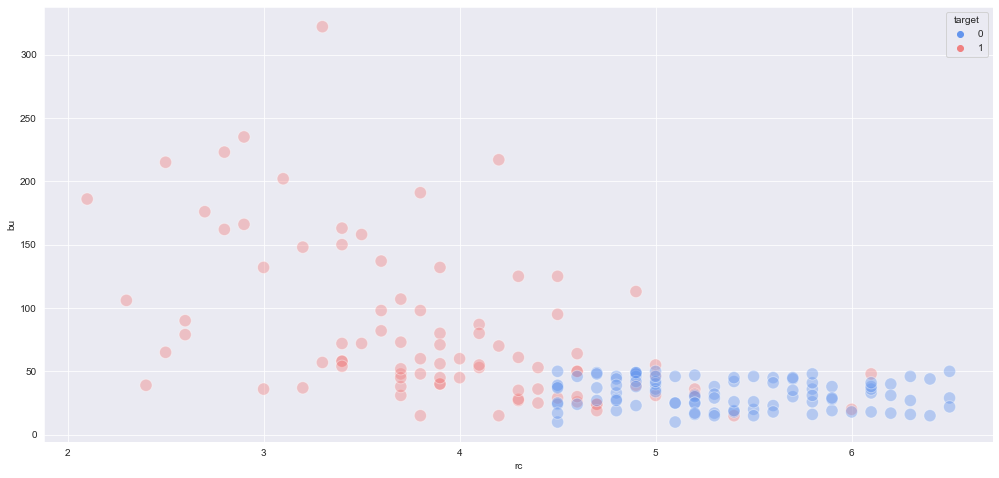

sc


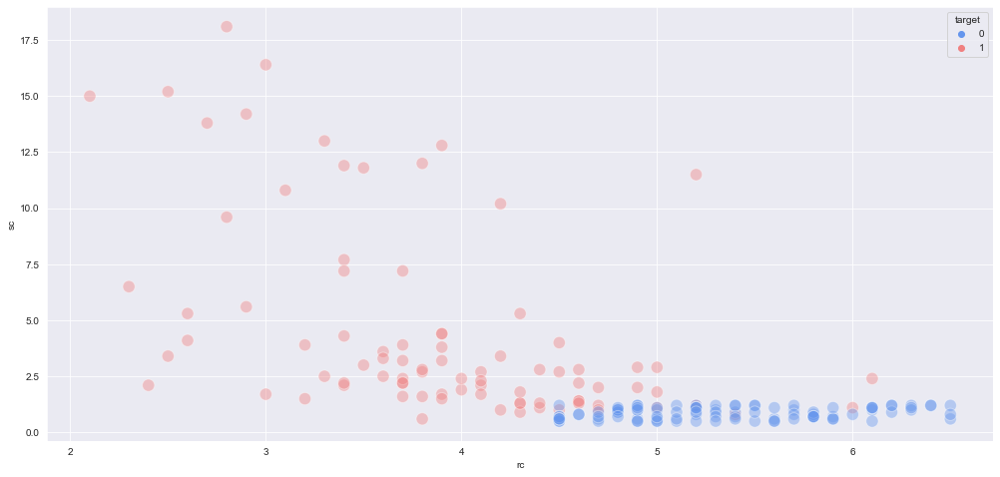

sod


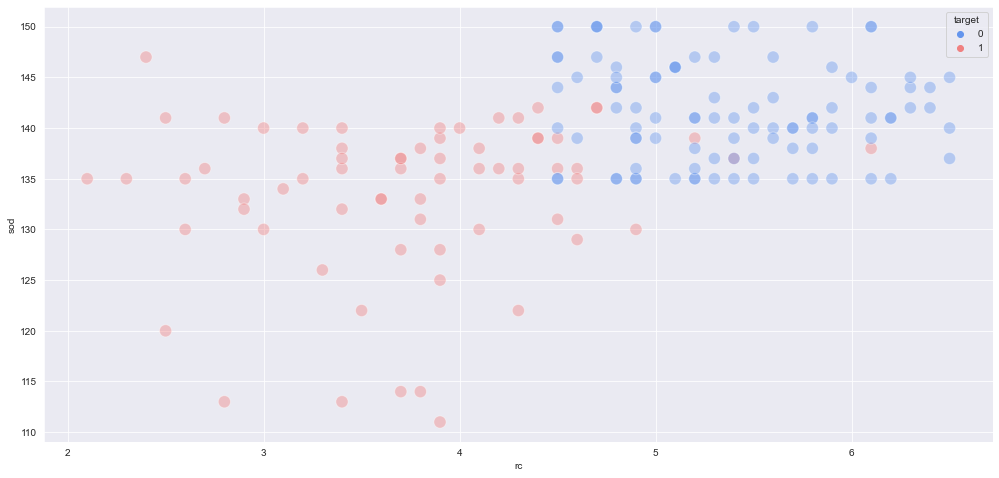

pot


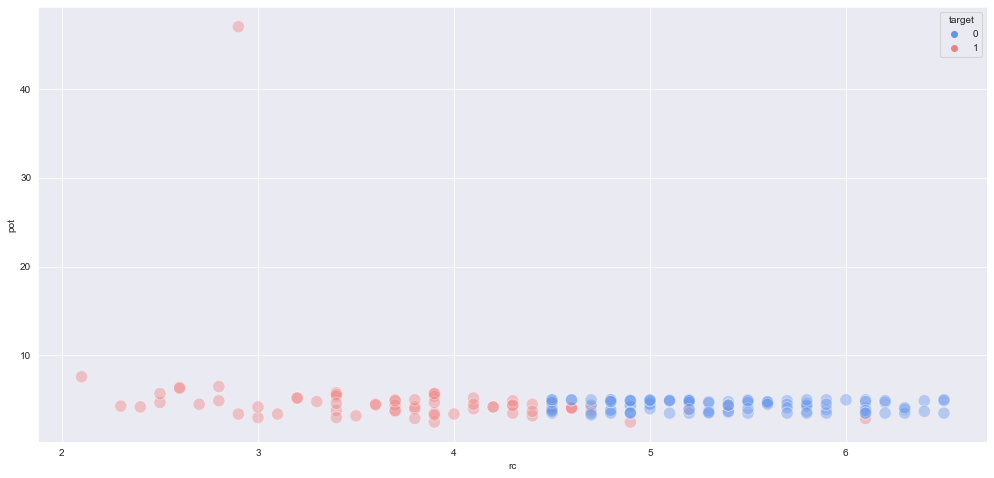

hemo


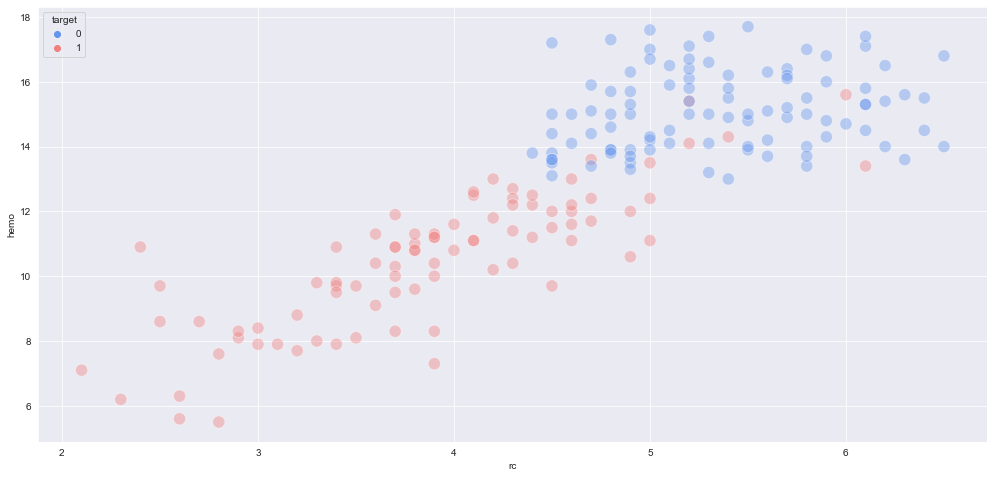

pcv


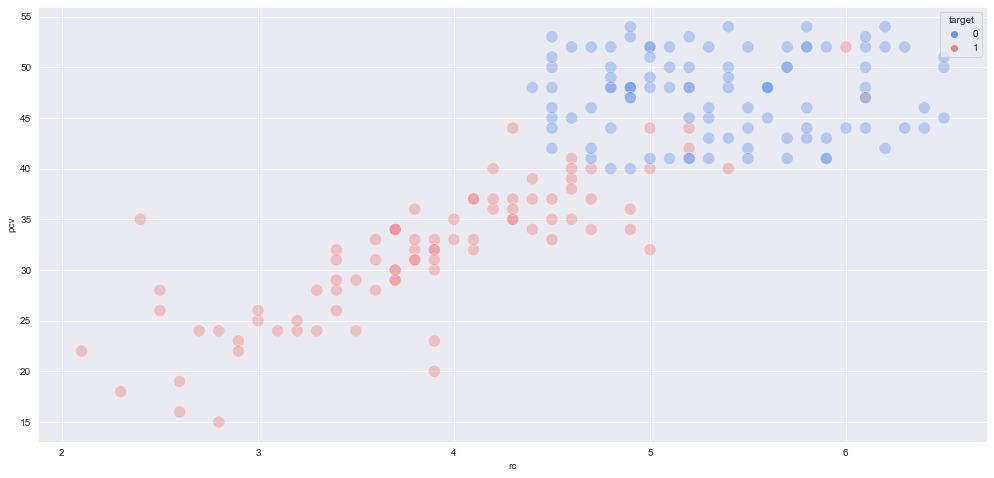

wc


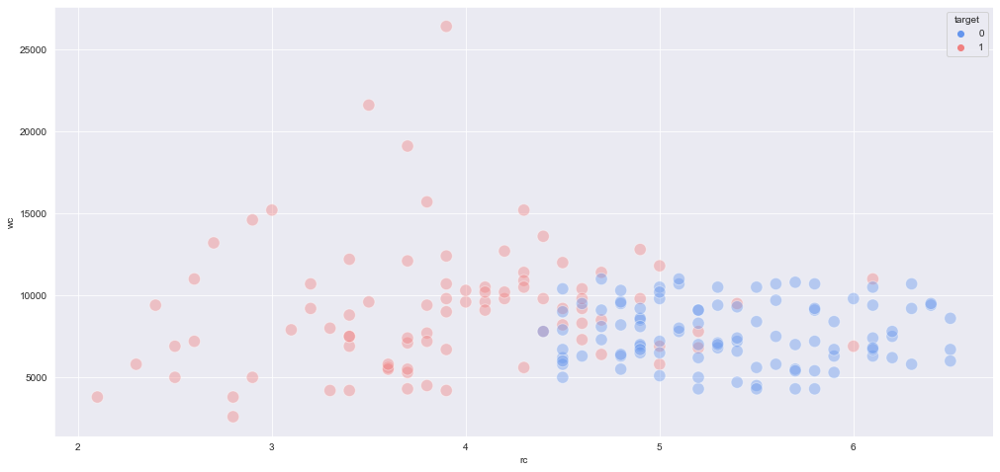

rc


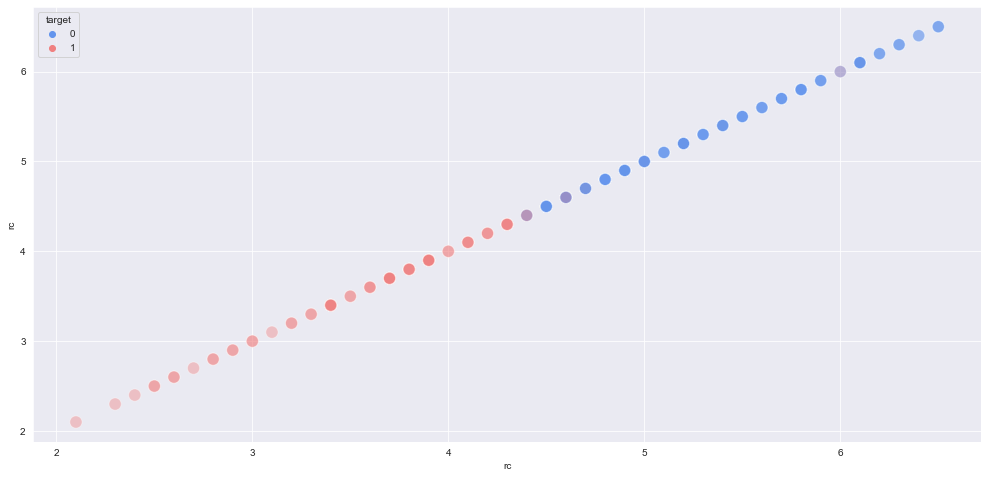

In [77]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='rc',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('rc')
    plt.ylabel(col)
    plt.show()

In [78]:
train_df.columns

Index(['age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr', 'bu',
       'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad',
       'appet', 'pe', 'ane', 'target'],
      dtype='object')

In [79]:
fig = px.scatter_3d(train_df, x="al", y="bgr", z="sc", color="target")
fig.show()

From above we can clearly distinguish the target with 3 independent features ['al','bgr','sc']

### Discrete_features

### Univariate/Bivariate analysis

In [81]:
train_df[discrete_features].nunique().sort_values(ascending=False)

bp        8
al        6
su        6
sg        5
target    2
dtype: int64

In [82]:
discrete_features

['bp', 'sg', 'al', 'su', 'target']

In [83]:
discrete_features = ['bp', 'sg', 'al', 'su']

discrete_features

['bp', 'sg', 'al', 'su']

bp


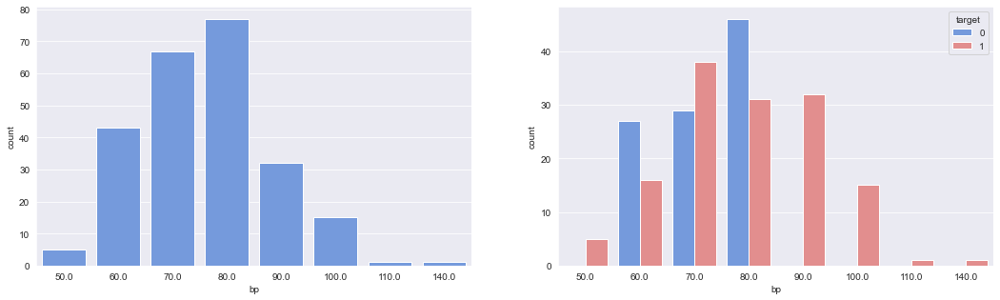

sg


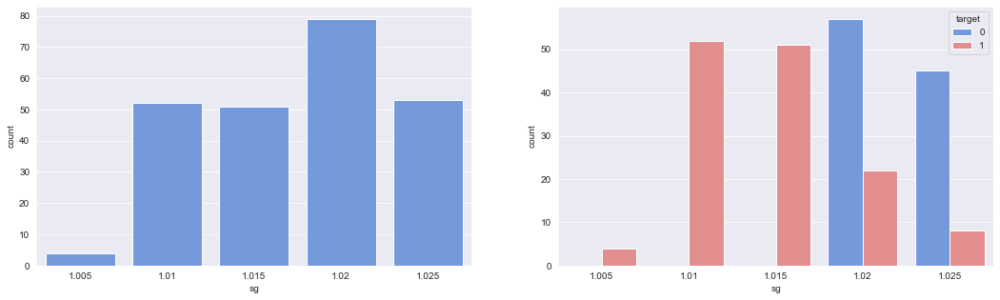

al


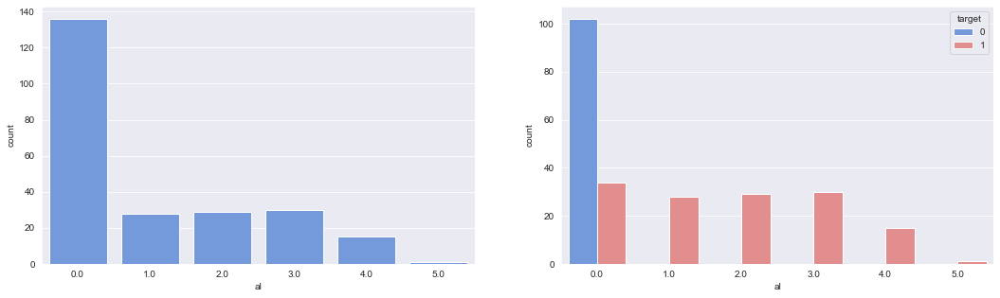

su


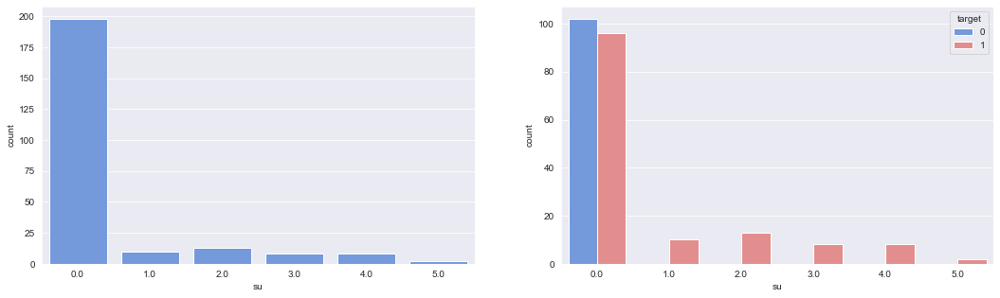

In [84]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=train_df, x=col,color='cornflowerblue',order=train_df[col].value_counts().sort_index().index)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=train_df, x=col, hue="target",palette=['cornflowerblue','lightcoral'],order=train_df[col].value_counts().sort_index().index)
    plt.show()

### Observation :

1. From above we can clearly observe that there is a clear pattern in ['al','su'] and the target category

In [85]:
numerical_features

Index(['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo',
       'pcv', 'wc', 'rc', 'target'],
      dtype='object')

In [86]:
categorical_features

Index(['rbc', 'pc', 'pcc', 'ba', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane'], dtype='object')

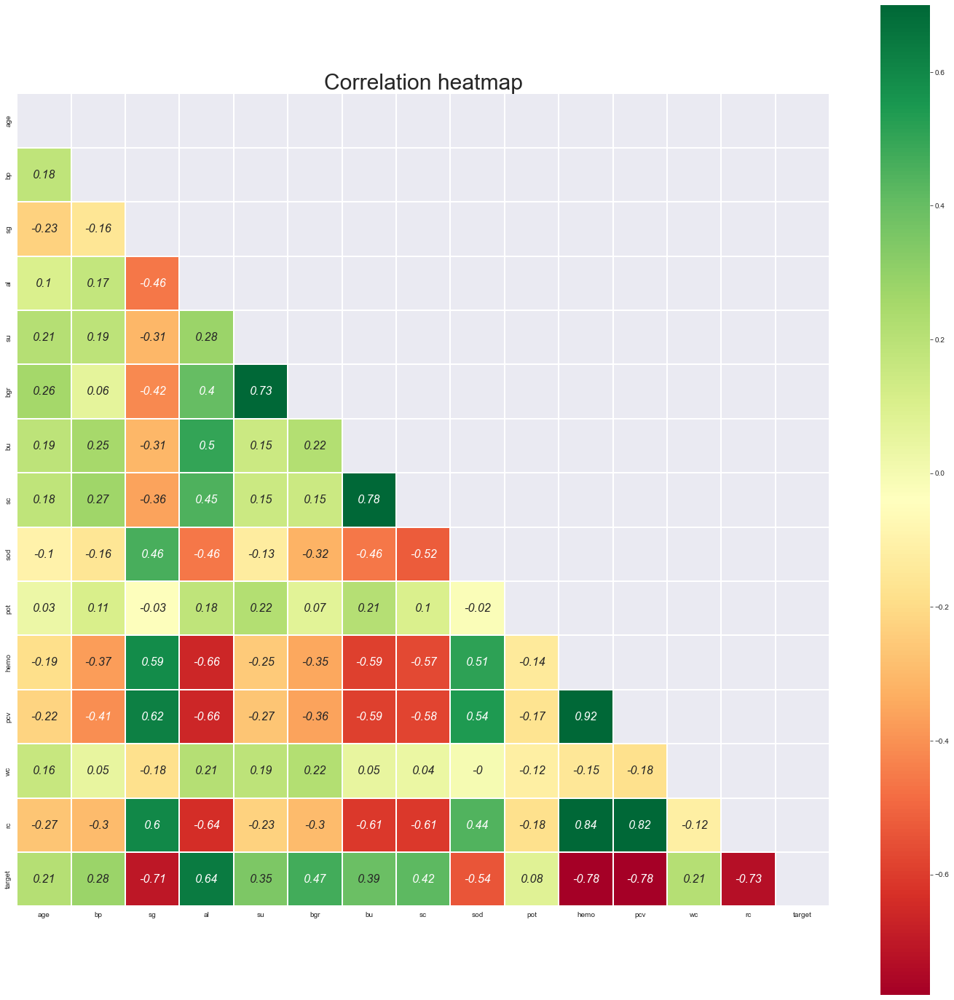

In [87]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df[numerical_features].corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df[numerical_features].corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

### Observation :

1. We can see there is positive correlation between ['al','bgr','sc','bu'] and 'target'
2. And there is a strong negative correlataion between ['pcv','hemo','rc','sg'] and target

### Multicollinearity

2. there is Multicollinearity - we will take a look at it later

#### We need to be very careful with this Multicollinearity when using 'Linear ML Models'

## Categorical_features

### Univariate/Bivariate analysis

In [90]:
train_df[categorical_features].nunique().sort_values(ascending=False)

cad      3
rbc      2
pc       2
pcc      2
ba       2
htn      2
dm       2
appet    2
pe       2
ane      2
dtype: int64

In [91]:
categorical_features = ['dm', 'rbc', 'pc', 'pcc', 'ba', 'htn', 'cad', 'appet', 'pe', 'ane']

dm


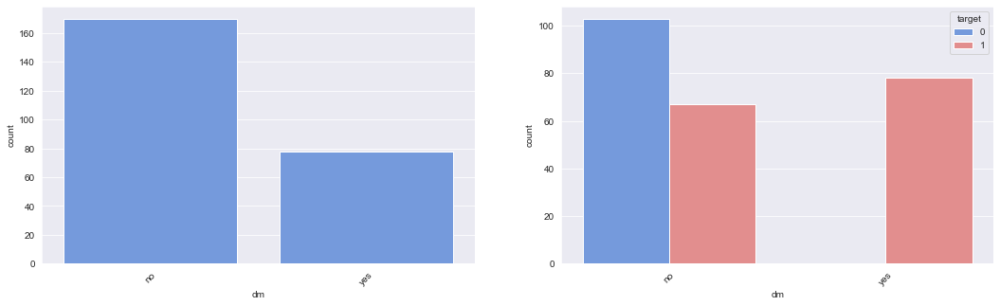

rbc


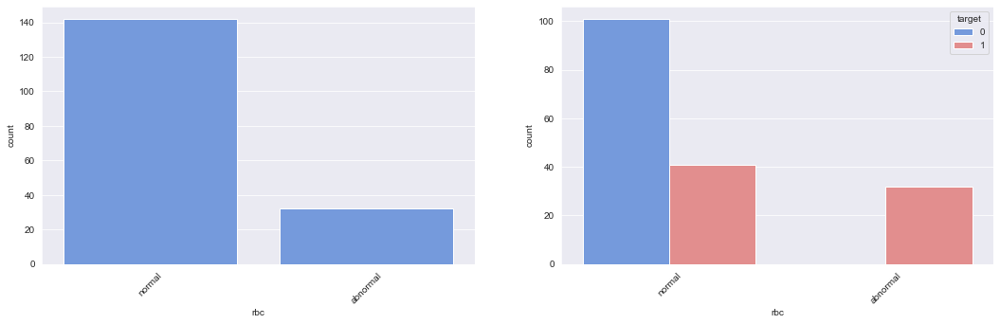

pc


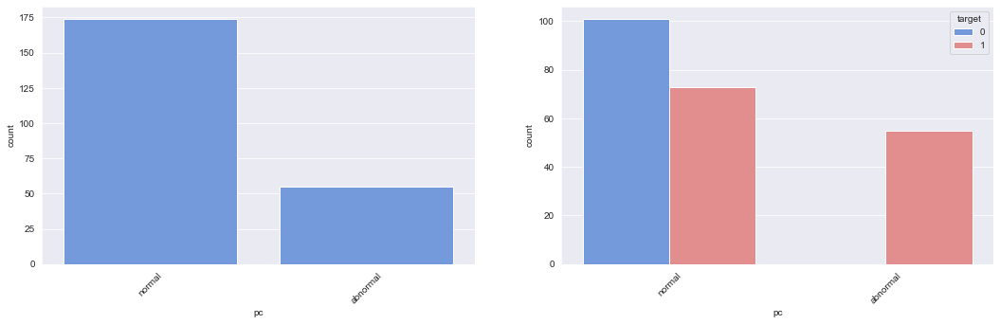

pcc


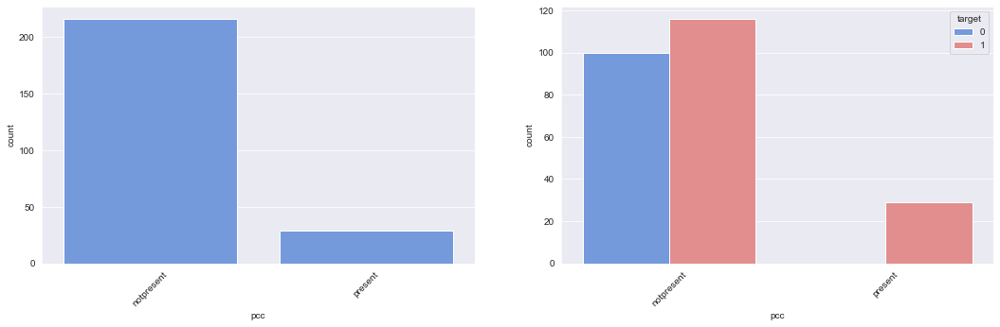

ba


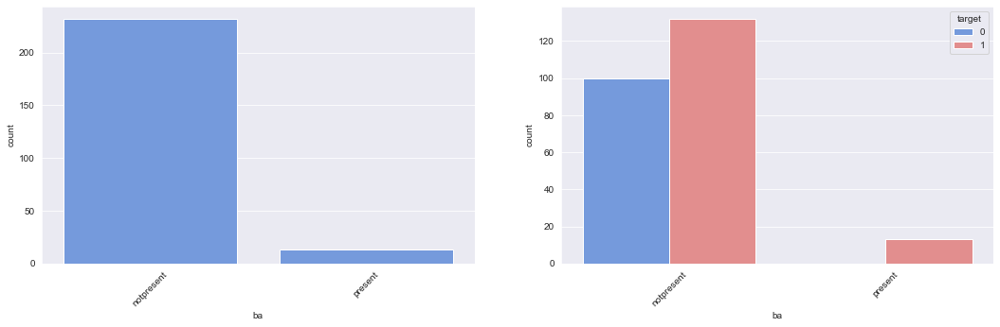

htn


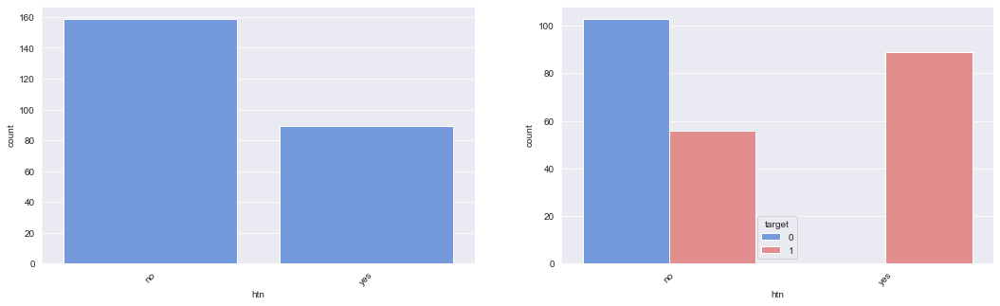

cad


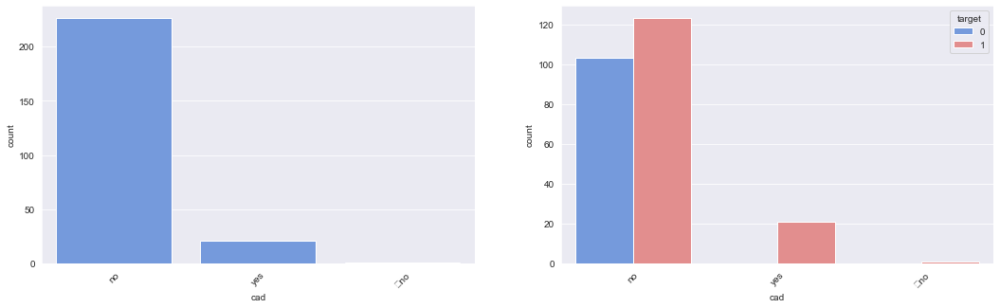

appet


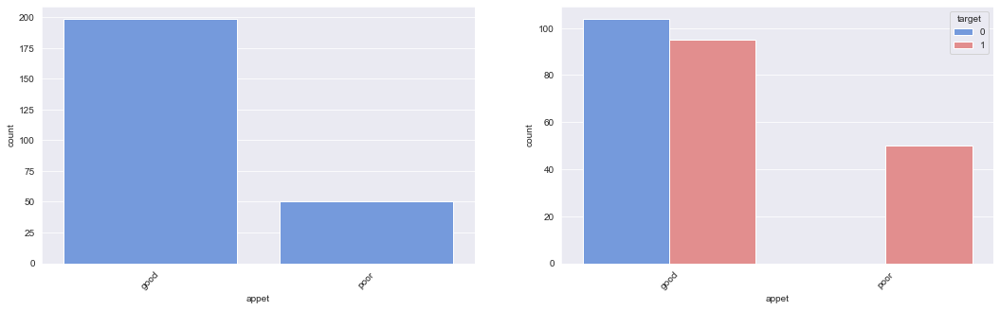

pe


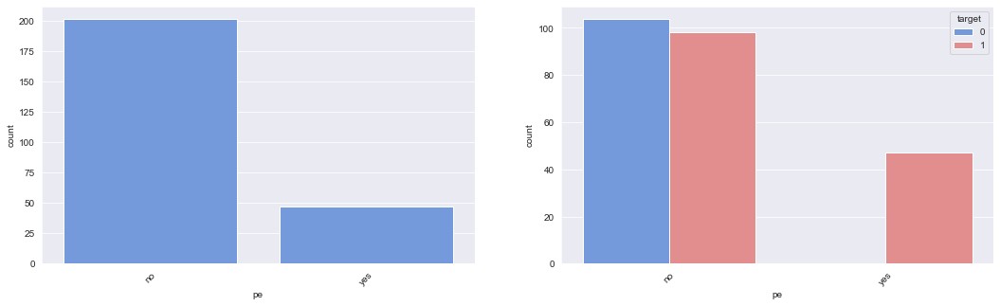

ane


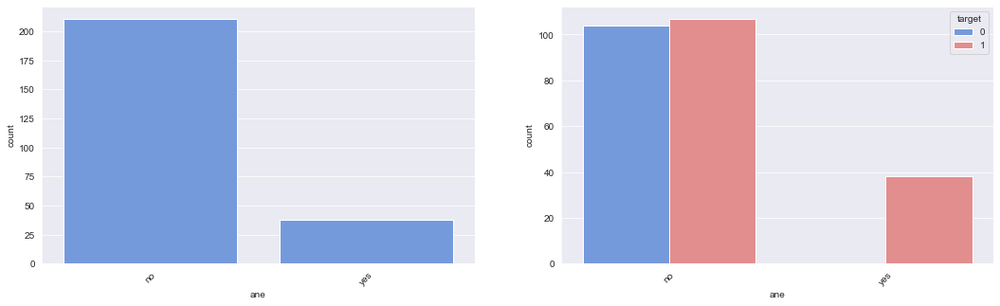

In [92]:
for col in categorical_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=train_df, x=col,color='cornflowerblue',order=train_df[col].value_counts().index)
    plt.xlabel(col)
    plt.xticks(rotation=45)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=train_df, x=col, hue="target",palette=['cornflowerblue','lightcoral'],order=train_df[col].value_counts().index)
    plt.xticks(rotation=45)
    plt.show()

### Obervation :

1. From above we can clearly observe that all the categorical features have clear distinction w.r.t target category

In [93]:
def plot_categorical_features_2(train_df,col):
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    
    plt.pie(train_df[col].value_counts().values, labels=train_df[col].value_counts().index,
        autopct='%1.1f%%', pctdistance=0.85)
    centre_circle = plt.Circle((0, 0), 0.70, fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col,color='cornflowerblue',order=train_df[col].value_counts().index)
    plt.xticks(rotation=90)
    plt.show()

dm
no.of nulls : 1
% of nulls : 0.4


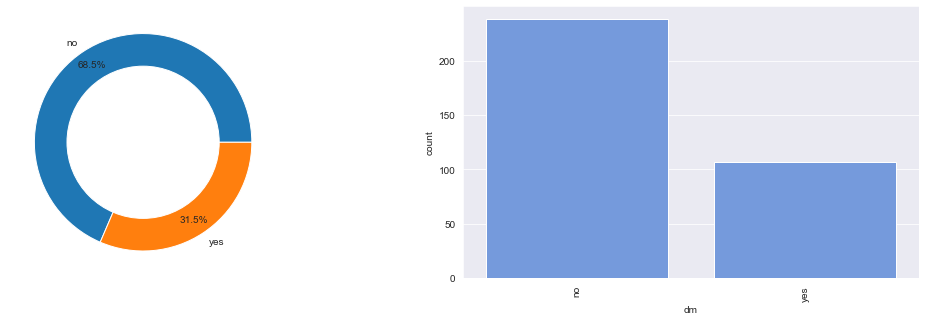

rbc
no.of nulls : 75
% of nulls : 30.12


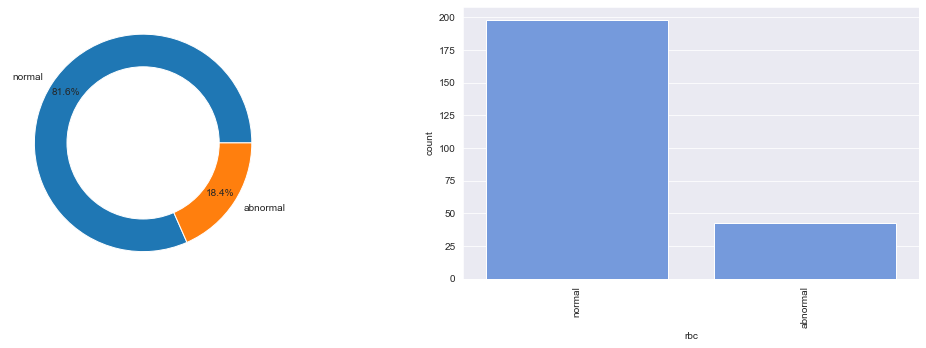

pc
no.of nulls : 20
% of nulls : 8.03


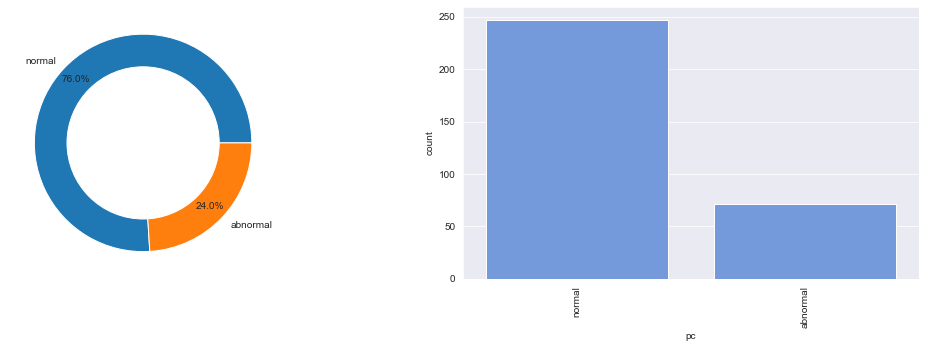

pcc
no.of nulls : 4
% of nulls : 1.61


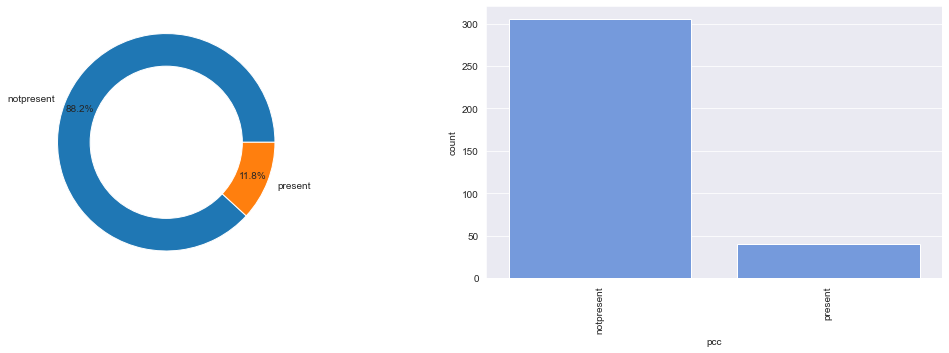

ba
no.of nulls : 4
% of nulls : 1.61


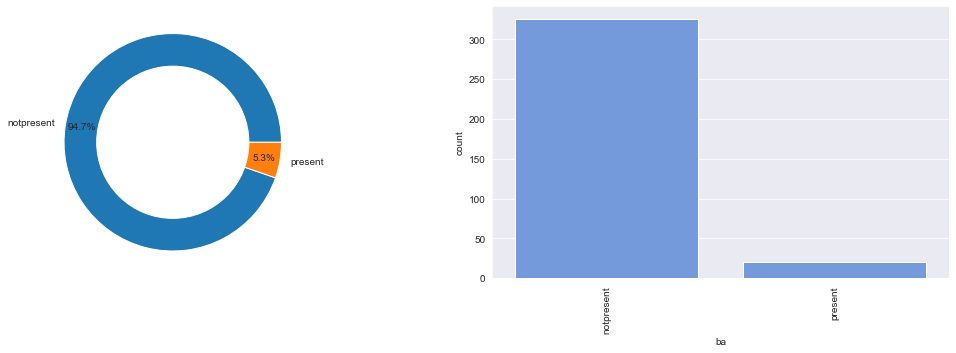

htn
no.of nulls : 1
% of nulls : 0.4


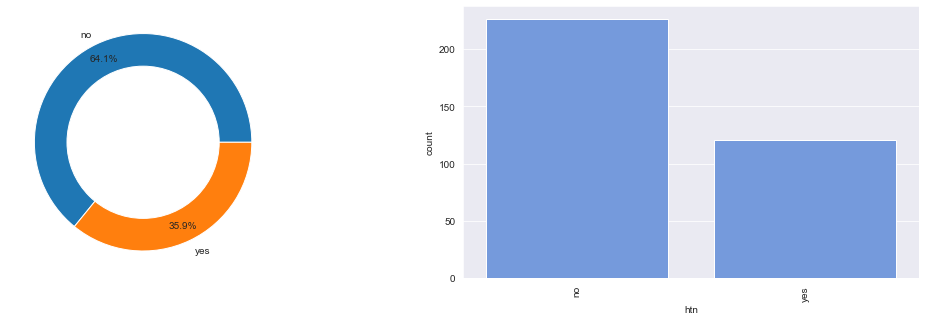

cad
no.of nulls : 1
% of nulls : 0.4


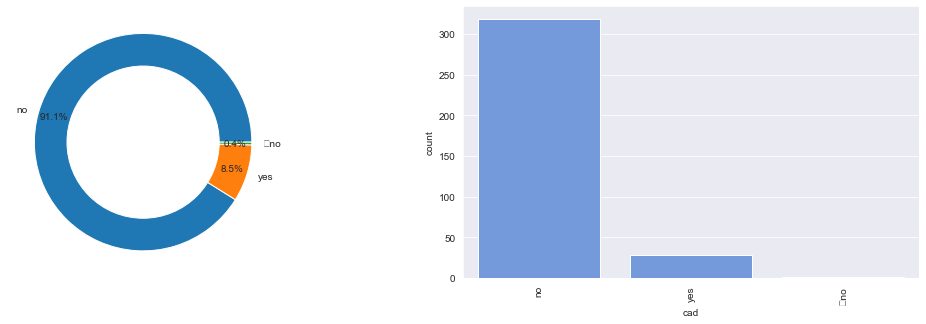

appet
no.of nulls : 0
% of nulls : 0.0


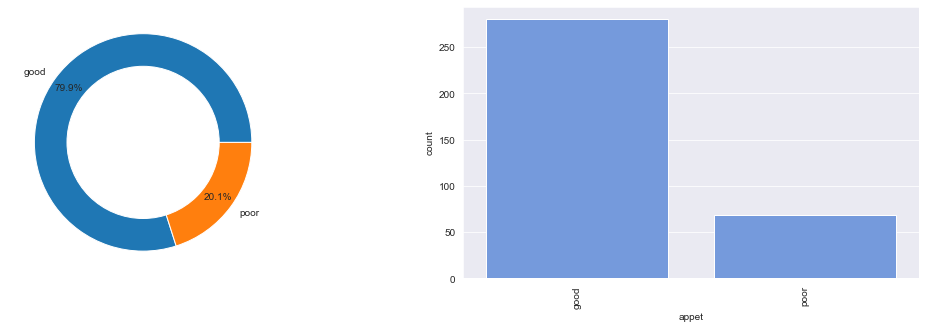

pe
no.of nulls : 0
% of nulls : 0.0


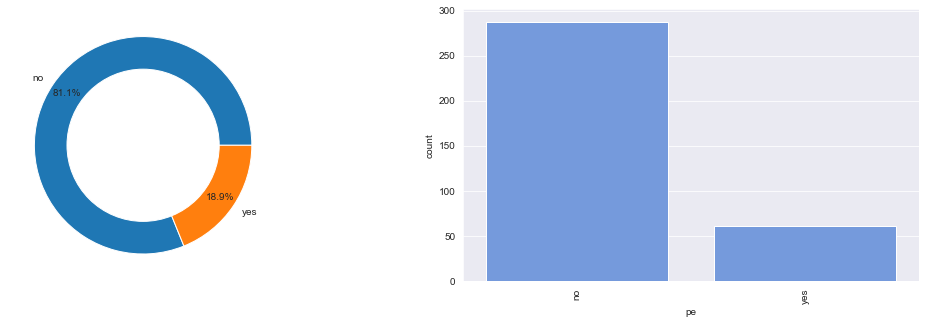

ane
no.of nulls : 0
% of nulls : 0.0


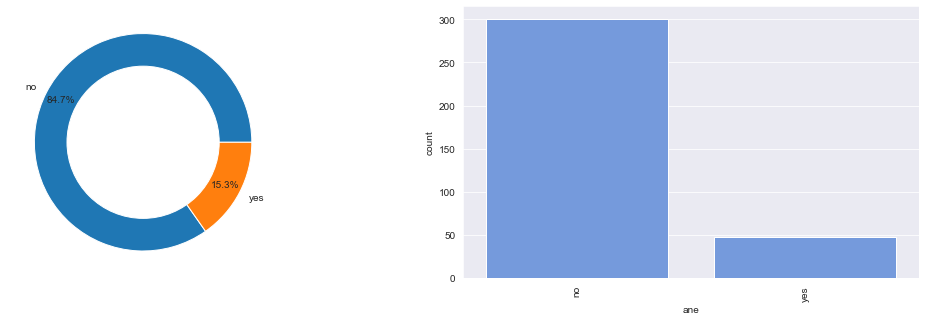

In [94]:
for col in categorical_features:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_categorical_features_2(train_df,col)

In [96]:
train_df.niiofbid()

AttributeError: 'DataFrame' object has no attribute 'niiofbid'

In [96]:
train_df

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44.0,7800.0,5.2,yes,yes,no,good,no,no,1
1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38.0,6000.0,NaN,no,no,no,good,no,no,1
2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,NaN,NaN,9.6,31.0,7500.0,NaN,no,yes,no,poor,no,yes,1
3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32.0,6700.0,3.9,yes,no,no,poor,yes,yes,1
4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,NaN,NaN,11.6,35.0,7300.0,4.6,no,no,no,good,no,no,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,50.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,137.0,46.0,0.8,139.0,5.0,14.1,45.0,9500.0,4.6,no,no,no,good,no,no,0
245,55.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,140.0,49.0,0.5,150.0,4.9,15.7,47.0,6700.0,4.9,no,no,no,good,no,no,0
246,42.0,70.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,75.0,31.0,1.2,141.0,3.5,16.5,54.0,7800.0,6.2,no,no,no,good,no,no,0
247,12.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,100.0,26.0,0.6,137.0,4.4,15.8,49.0,6600.0,5.4,no,no,no,good,no,no,0


In [97]:
val_df

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,33.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,100.0,37.0,1.2,142.0,4.0,16.9,52,6700,6.0,no,no,no,good,no,no,0
1,65.0,60.0,1.015,1.0,0.0,NaN,normal,notpresent,notpresent,91.0,51.0,2.2,132.0,3.8,10.0,32,9100,4.0,yes,yes,no,poor,yes,no,1
2,73.0,90.0,1.015,3.0,0.0,NaN,abnormal,present,notpresent,107.0,33.0,1.5,141.0,4.6,10.1,30,7800,4,no,no,no,poor,no,no,1
3,53.0,100.0,1.010,1.0,3.0,abnormal,normal,notpresent,notpresent,213.0,23.0,1.0,139.0,4.0,NaN,NaN,NaN,NaN,no,yes,no,good,no,no,1
4,47.0,60.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,117.0,22.0,1.2,138.0,3.5,13.0,45,5200,5.6,no,no,no,good,no,no,0
5,61.0,80.0,1.015,0.0,4.0,NaN,normal,notpresent,notpresent,360.0,19.0,0.7,137.0,4.4,15.2,44,8300,5.2,yes,yes,no,good,no,no,1
6,32.0,60.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,102.0,17.0,0.4,147.0,4.7,14.6,41,6800,5.1,no,no,no,good,no,no,0
7,65.0,70.0,1.015,1.0,0.0,NaN,normal,notpresent,notpresent,203.0,46.0,1.4,NaN,NaN,11.4,36,5000,4.1,yes,yes,no,poor,yes,no,1
8,46.0,90.0,1.020,NaN,NaN,NaN,normal,notpresent,notpresent,213.0,68.0,2.8,146.0,6.3,9.3,NaN,NaN,NaN,yes,yes,no,good,no,no,1
9,66.0,70.0,1.015,2.0,5.0,NaN,normal,notpresent,notpresent,447.0,41.0,1.7,131.0,3.9,12.5,33,9600,4.4,yes,yes,no,good,no,no,1


In [98]:
test_df

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,48.0,80.0,1.005,4.0,0.0,abnormal,abnormal,notpresent,present,133.0,139.0,8.50,132.0,5.5,10.3,36,\t6200,4,no,yes,no,good,yes,no,1
1,62.0,70.0,1.025,3.0,0.0,normal,abnormal,notpresent,notpresent,122.0,42.0,1.70,136.0,4.7,12.6,39,7900,3.9,yes,yes,no,good,no,no,1
2,76.0,70.0,1.015,3.0,4.0,normal,abnormal,present,notpresent,NaN,164.0,9.70,131.0,4.4,10.2,30,11300,3.4,yes,yes,yes,poor,yes,no,1
3,51.0,100.0,1.015,2.0,0.0,normal,normal,notpresent,present,93.0,20.0,1.60,146.0,4.5,NaN,NaN,NaN,NaN,no,no,no,poor,no,no,1
4,79.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,111.0,44.0,1.20,146.0,3.6,16.3,40,8000,6.4,no,no,no,good,no,no,0
5,44.0,90.0,1.010,1.0,0.0,NaN,normal,notpresent,notpresent,NaN,20.0,1.10,NaN,NaN,15.0,48,NaN,NaN,no,\tno,no,good,no,no,1
6,61.0,60.0,1.025,0.0,0.0,NaN,normal,notpresent,notpresent,108.0,75.0,1.90,141.0,5.2,9.9,29,8400,3.7,yes,yes,no,good,no,yes,1
7,45.0,70.0,1.010,2.0,0.0,NaN,normal,notpresent,notpresent,113.0,93.0,2.30,NaN,NaN,7.9,26,5700,NaN,no,no,yes,good,no,yes,1
8,55.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,130.0,50.0,1.20,147.0,5.0,15.5,41,9100,6.0,no,no,no,good,no,no,0
9,61.0,80.0,1.020,0.0,0.0,NaN,normal,notpresent,notpresent,131.0,23.0,0.80,140.0,4.1,11.3,35,NaN,NaN,no,no,no,good,no,no,1


In [99]:
# writing the final df to a file

train_df.to_csv('../Data/Kidney/train_df.csv',index=False)

In [100]:
# writing the final df to a file

val_df.to_csv('../Data/Kidney/val_df.csv',index=False)

In [101]:
# writing the final df to a file

test_df.to_csv('../Data/Kidney/test_df.csv',index=False)

# Feature Engineering

In [102]:
# Preprocessing imports
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import FunctionTransformer,QuantileTransformer,PowerTransformer
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,LabelEncoder
from sklearn.preprocessing import StandardScaler,RobustScaler,MinMaxScaler

# Models
from sklearn.linear_model import LogisticRegression,SGDClassifier,RidgeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB,BernoulliNB,CategoricalNB,MultinomialNB
from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,IsolationForest,ExtraTreesClassifier,AdaBoostClassifier
from xgboost import XGBClassifier,XGBRFClassifier

# Cross-validation
from sklearn.model_selection import cross_val_score

# Hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# Pipeline
from sklearn.pipeline import Pipeline,make_pipeline
from sklearn.compose import ColumnTransformer,TransformedTargetRegressor

# Metrics
from sklearn.metrics import accuracy_score,classification_report,precision_score,recall_score,f1_score,precision_recall_curve

from imblearn.over_sampling import SMOTE

# Visualize Pipeline
from sklearn import set_config

# PCA - for dimensionality reduction
from sklearn.decomposition import PCA

# to calculate VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# To calculate the Verinces of each feature
from sklearn.feature_selection import VarianceThreshold

# Mutual Information for classification - For Feature Selection
from sklearn.feature_selection import mutual_info_classif

In [125]:
train_df = pd.read_csv('../Data/Kidney/train_df.csv')
X_train = train_df.drop('target',axis=1)
y_train = train_df['target']

In [126]:
val_df = pd.read_csv('../Data/Kidney/val_df.csv')
X_val = val_df.drop('target',axis=1)
y_val = val_df['target']

In [127]:
test_df = pd.read_csv('../Data/Kidney/test_df.csv')
X_test = test_df.drop('target',axis=1)
y_test = test_df['target']

In [128]:
train_df

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44.0,7800.0,5.2,yes,yes,no,good,no,no,1
1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38.0,6000.0,NaN,no,no,no,good,no,no,1
2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,NaN,NaN,9.6,31.0,7500.0,NaN,no,yes,no,poor,no,yes,1
3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32.0,6700.0,3.9,yes,no,no,poor,yes,yes,1
4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,NaN,NaN,11.6,35.0,7300.0,4.6,no,no,no,good,no,no,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,50.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,137.0,46.0,0.8,139.0,5.0,14.1,45.0,9500.0,4.6,no,no,no,good,no,no,0
245,55.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,140.0,49.0,0.5,150.0,4.9,15.7,47.0,6700.0,4.9,no,no,no,good,no,no,0
246,42.0,70.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,75.0,31.0,1.2,141.0,3.5,16.5,54.0,7800.0,6.2,no,no,no,good,no,no,0
247,12.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,100.0,26.0,0.6,137.0,4.4,15.8,49.0,6600.0,5.4,no,no,no,good,no,no,0


In [129]:
val_df

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,33.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,100.0,37.0,1.2,142.0,4.0,16.9,52.0,6700.0,6.0,no,no,no,good,no,no,0
1,65.0,60.0,1.015,1.0,0.0,NaN,normal,notpresent,notpresent,91.0,51.0,2.2,132.0,3.8,10.0,32.0,9100.0,4.0,yes,yes,no,poor,yes,no,1
2,73.0,90.0,1.015,3.0,0.0,NaN,abnormal,present,notpresent,107.0,33.0,1.5,141.0,4.6,10.1,30.0,7800.0,4.0,no,no,no,poor,no,no,1
3,53.0,100.0,1.010,1.0,3.0,abnormal,normal,notpresent,notpresent,213.0,23.0,1.0,139.0,4.0,NaN,NaN,NaN,NaN,no,yes,no,good,no,no,1
4,47.0,60.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,117.0,22.0,1.2,138.0,3.5,13.0,45.0,5200.0,5.6,no,no,no,good,no,no,0
5,61.0,80.0,1.015,0.0,4.0,NaN,normal,notpresent,notpresent,360.0,19.0,0.7,137.0,4.4,15.2,44.0,8300.0,5.2,yes,yes,no,good,no,no,1
6,32.0,60.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,102.0,17.0,0.4,147.0,4.7,14.6,41.0,6800.0,5.1,no,no,no,good,no,no,0
7,65.0,70.0,1.015,1.0,0.0,NaN,normal,notpresent,notpresent,203.0,46.0,1.4,NaN,NaN,11.4,36.0,5000.0,4.1,yes,yes,no,poor,yes,no,1
8,46.0,90.0,1.020,NaN,NaN,NaN,normal,notpresent,notpresent,213.0,68.0,2.8,146.0,6.3,9.3,NaN,NaN,NaN,yes,yes,no,good,no,no,1
9,66.0,70.0,1.015,2.0,5.0,NaN,normal,notpresent,notpresent,447.0,41.0,1.7,131.0,3.9,12.5,33.0,9600.0,4.4,yes,yes,no,good,no,no,1


In [130]:
test_df

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,target
0,48.0,80.0,1.005,4.0,0.0,abnormal,abnormal,notpresent,present,133.0,139.0,8.50,132.0,5.5,10.3,36.0,6200.0,4.0,no,yes,no,good,yes,no,1
1,62.0,70.0,1.025,3.0,0.0,normal,abnormal,notpresent,notpresent,122.0,42.0,1.70,136.0,4.7,12.6,39.0,7900.0,3.9,yes,yes,no,good,no,no,1
2,76.0,70.0,1.015,3.0,4.0,normal,abnormal,present,notpresent,NaN,164.0,9.70,131.0,4.4,10.2,30.0,11300.0,3.4,yes,yes,yes,poor,yes,no,1
3,51.0,100.0,1.015,2.0,0.0,normal,normal,notpresent,present,93.0,20.0,1.60,146.0,4.5,NaN,NaN,NaN,NaN,no,no,no,poor,no,no,1
4,79.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,111.0,44.0,1.20,146.0,3.6,16.3,40.0,8000.0,6.4,no,no,no,good,no,no,0
5,44.0,90.0,1.010,1.0,0.0,NaN,normal,notpresent,notpresent,NaN,20.0,1.10,NaN,NaN,15.0,48.0,NaN,NaN,no,\tno,no,good,no,no,1
6,61.0,60.0,1.025,0.0,0.0,NaN,normal,notpresent,notpresent,108.0,75.0,1.90,141.0,5.2,9.9,29.0,8400.0,3.7,yes,yes,no,good,no,yes,1
7,45.0,70.0,1.010,2.0,0.0,NaN,normal,notpresent,notpresent,113.0,93.0,2.30,NaN,NaN,7.9,26.0,5700.0,NaN,no,no,yes,good,no,yes,1
8,55.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,130.0,50.0,1.20,147.0,5.0,15.5,41.0,9100.0,6.0,no,no,no,good,no,no,0
9,61.0,80.0,1.020,0.0,0.0,NaN,normal,notpresent,notpresent,131.0,23.0,0.80,140.0,4.1,11.3,35.0,NaN,NaN,no,no,no,good,no,no,1


In [131]:
train_df['target'].value_counts(normalize=True)

1    0.582329
0    0.417671
Name: target, dtype: float64

In [132]:
numerical_features

['age',
 'bp',
 'sg',
 'al',
 'su',
 'bgr',
 'bu',
 'sc',
 'sod',
 'pot',
 'hemo',
 'pcv',
 'wc',
 'rc']

In [133]:
numerical_features = ['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo','pcv', 'wc', 'rc']
numerical_features

['age',
 'bp',
 'sg',
 'al',
 'su',
 'bgr',
 'bu',
 'sc',
 'sod',
 'pot',
 'hemo',
 'pcv',
 'wc',
 'rc']

In [134]:
len(numerical_features)

14

In [135]:
len(categorical_features)

10

### Building preprocessing pipeline

In [136]:
numerical_features

['age',
 'bp',
 'sg',
 'al',
 'su',
 'bgr',
 'bu',
 'sc',
 'sod',
 'pot',
 'hemo',
 'pcv',
 'wc',
 'rc']

In [137]:
categorical_features

['dm', 'rbc', 'pc', 'pcc', 'ba', 'htn', 'cad', 'appet', 'pe', 'ane']

In [138]:
numeric_processor=Pipeline([("imputation_mean",SimpleImputer(strategy='median',add_indicator=True)),
                           ("quantiletransformer",QuantileTransformer(output_distribution='normal'))])

categorical_processor=Pipeline([("imputation_consatnt",SimpleImputer(fill_value="missing",strategy="constant")),
                                ("onehotencoder",OneHotEncoder(handle_unknown='ignore',sparse_output=False,min_frequency=0.01,max_categories=15))])

preprocessor=ColumnTransformer([("numeric_processor",numeric_processor,numerical_features),
                               ("categorical_processor",categorical_processor,categorical_features)])

final_pipe=Pipeline([("preprocessor",preprocessor),
                     ("scaler",RobustScaler())])

In [139]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['age', 'bp', 'sg', 'al',
                                                   'su', 'bgr', 'bu', 'sc',
                                                   'sod', 'pot', 'hemo', 'pcv',
                                                   'wc', 'rc']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  ['dm', 'rbc', 'pc', 'pcc',
                                                   'ba', 'htn', 'cad', 'appet',
                                                   'pe', 'ane'])])),
                ('scaler', RobustScaler())])

In [140]:
X_train

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane
0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44.0,7800.0,5.2,yes,yes,no,good,no,no
1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38.0,6000.0,NaN,no,no,no,good,no,no
2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,NaN,NaN,9.6,31.0,7500.0,NaN,no,yes,no,poor,no,yes
3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32.0,6700.0,3.9,yes,no,no,poor,yes,yes
4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,NaN,NaN,11.6,35.0,7300.0,4.6,no,no,no,good,no,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,50.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,137.0,46.0,0.8,139.0,5.0,14.1,45.0,9500.0,4.6,no,no,no,good,no,no
245,55.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,140.0,49.0,0.5,150.0,4.9,15.7,47.0,6700.0,4.9,no,no,no,good,no,no
246,42.0,70.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,75.0,31.0,1.2,141.0,3.5,16.5,54.0,7800.0,6.2,no,no,no,good,no,no
247,12.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,100.0,26.0,0.6,137.0,4.4,15.8,49.0,6600.0,5.4,no,no,no,good,no,no


In [141]:
y_train

0      1
1      1
2      1
3      1
4      1
      ..
244    0
245    0
246    0
247    0
248    0
Name: target, Length: 249, dtype: int64

In [142]:
X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

In [143]:
X_train_FE

,numeric_processor__age,numeric_processor__bp,numeric_processor__sg,numeric_processor__al,numeric_processor__su,numeric_processor__bgr,numeric_processor__bu,numeric_processor__sc,numeric_processor__sod,numeric_processor__pot,numeric_processor__hemo,numeric_processor__pcv,numeric_processor__wc,numeric_processor__rc,numeric_processor__missingindicator_age,numeric_processor__missingindicator_bp,numeric_processor__missingindicator_sg,numeric_processor__missingindicator_al,numeric_processor__missingindicator_su,numeric_processor__missingindicator_bgr,numeric_processor__missingindicator_bu,numeric_processor__missingindicator_sc,numeric_processor__missingindicator_sod,numeric_processor__missingindicator_pot,numeric_processor__missingindicator_hemo,numeric_processor__missingindicator_pcv,numeric_processor__missingindicator_wc,numeric_processor__missingindicator_rc,categorical_processor__dm_no,categorical_processor__dm_yes,categorical_processor__dm_infrequent_sklearn,categorical_processor__rbc_abnormal,categorical_processor__rbc_missing,categorical_processor__rbc_normal,categorical_processor__pc_abnormal,categorical_processor__pc_missing,categorical_processor__pc_normal,categorical_processor__pcc_missing,categorical_processor__pcc_notpresent,categorical_processor__pcc_present,categorical_processor__ba_missing,categorical_processor__ba_notpresent,categorical_processor__ba_present,categorical_processor__htn_no,categorical_processor__htn_yes,categorical_processor__htn_infrequent_sklearn,categorical_processor__cad_no,categorical_processor__cad_yes,categorical_processor__cad_infrequent_sklearn,categorical_processor__appet_good,categorical_processor__appet_poor,categorical_processor__pe_no,categorical_processor__pe_yes,categorical_processor__ane_no,categorical_processor__ane_yes
0,-0.184571,0.000000,0.000000,0.942484,0.000000,-0.119304,-0.173523,0.000000,0.000000,0.000000,0.752644,0.362473,-0.194665,0.483130,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-1.579443,-6.968891,0.000000,1.198223,0.000000,0.000000,-0.983528,-0.580946,0.000000,0.000000,-0.348803,-0.181357,-0.712007,0.000000,0.0,0.0,0.0,0.0,0.0,10.398675,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.460705,0.000000,-2.007298,1.000000,6.802626,1.548529,0.442887,0.311507,0.000000,0.000000,-0.825155,-0.675383,-0.240299,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,-1.0,1.0
3,-0.184571,-1.000000,-7.545810,1.198223,0.000000,-0.205503,0.541410,0.781581,-1.819169,-4.162108,-0.382900,-0.582217,-0.503308,-0.665302,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,-1.0,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0,-1.0,1.0,-1.0,1.0
4,-0.055971,0.000000,-2.007298,1.000000,0.000000,-0.365721,-0.535985,0.168687,0.000000,0.000000,-0.298959,-0.358801,-0.290881,-0.339391,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,-0.097204,0.000000,0.000000,0.000000,0.000000,0.308048,0.200605,-0.580946,0.253499,0.880845,0.387217,0.448041,0.496692,-0.339391,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
245,0.093445,0.000000,0.000000,0.000000,0.000000,0.389450,0.330240,-3.893175,3.

In [144]:
y_train.value_counts()

1    145
0    104
Name: target, dtype: int64

In [145]:
X_val

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane
0,33.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,100.0,37.0,1.2,142.0,4.0,16.9,52.0,6700.0,6.0,no,no,no,good,no,no
1,65.0,60.0,1.015,1.0,0.0,NaN,normal,notpresent,notpresent,91.0,51.0,2.2,132.0,3.8,10.0,32.0,9100.0,4.0,yes,yes,no,poor,yes,no
2,73.0,90.0,1.015,3.0,0.0,NaN,abnormal,present,notpresent,107.0,33.0,1.5,141.0,4.6,10.1,30.0,7800.0,4.0,no,no,no,poor,no,no
3,53.0,100.0,1.010,1.0,3.0,abnormal,normal,notpresent,notpresent,213.0,23.0,1.0,139.0,4.0,NaN,NaN,NaN,NaN,no,yes,no,good,no,no
4,47.0,60.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,117.0,22.0,1.2,138.0,3.5,13.0,45.0,5200.0,5.6,no,no,no,good,no,no
5,61.0,80.0,1.015,0.0,4.0,NaN,normal,notpresent,notpresent,360.0,19.0,0.7,137.0,4.4,15.2,44.0,8300.0,5.2,yes,yes,no,good,no,no
6,32.0,60.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,102.0,17.0,0.4,147.0,4.7,14.6,41.0,6800.0,5.1,no,no,no,good,no,no
7,65.0,70.0,1.015,1.0,0.0,NaN,normal,notpresent,notpresent,203.0,46.0,1.4,NaN,NaN,11.4,36.0,5000.0,4.1,yes,yes,no,poor,yes,no
8,46.0,90.0,1.020,NaN,NaN,NaN,normal,notpresent,notpresent,213.0,68.0,2.8,146.0,6.3,9.3,NaN,NaN,NaN,yes,yes,no,good,no,no
9,66.0,70.0,1.015,2.0,5.0,NaN,normal,notpresent,notpresent,447.0,41.0,1.7,131.0,3.9,12.5,33.0,9600.0,4.4,yes,yes,no,good,no,no


In [146]:
y_val

0     0
1     1
2     1
3     1
4     0
5     1
6     0
7     1
8     1
9     1
10    0
11    0
12    1
13    0
14    1
15    0
16    0
17    1
18    0
19    0
20    0
21    1
22    0
23    0
24    1
25    0
26    0
27    1
28    0
29    0
30    1
31    1
32    0
33    0
34    0
35    0
36    0
37    0
38    0
39    0
40    1
41    0
42    1
43    1
44    1
45    1
46    1
47    1
48    0
49    0
Name: target, dtype: int64

In [147]:
X_val_FE = pd.DataFrame(final_pipe.transform(X_val),columns=final_pipe.get_feature_names_out(X_val.columns))

In [148]:
X_val_FE

,numeric_processor__age,numeric_processor__bp,numeric_processor__sg,numeric_processor__al,numeric_processor__su,numeric_processor__bgr,numeric_processor__bu,numeric_processor__sc,numeric_processor__sod,numeric_processor__pot,numeric_processor__hemo,numeric_processor__pcv,numeric_processor__wc,numeric_processor__rc,numeric_processor__missingindicator_age,numeric_processor__missingindicator_bp,numeric_processor__missingindicator_sg,numeric_processor__missingindicator_al,numeric_processor__missingindicator_su,numeric_processor__missingindicator_bgr,numeric_processor__missingindicator_bu,numeric_processor__missingindicator_sc,numeric_processor__missingindicator_sod,numeric_processor__missingindicator_pot,numeric_processor__missingindicator_hemo,numeric_processor__missingindicator_pcv,numeric_processor__missingindicator_wc,numeric_processor__missingindicator_rc,categorical_processor__dm_no,categorical_processor__dm_yes,categorical_processor__dm_infrequent_sklearn,categorical_processor__rbc_abnormal,categorical_processor__rbc_missing,categorical_processor__rbc_normal,categorical_processor__pc_abnormal,categorical_processor__pc_missing,categorical_processor__pc_normal,categorical_processor__pcc_missing,categorical_processor__pcc_notpresent,categorical_processor__pcc_present,categorical_processor__ba_missing,categorical_processor__ba_notpresent,categorical_processor__ba_present,categorical_processor__htn_no,categorical_processor__htn_yes,categorical_processor__htn_infrequent_sklearn,categorical_processor__cad_no,categorical_processor__cad_yes,categorical_processor__cad_infrequent_sklearn,categorical_processor__appet_good,categorical_processor__appet_poor,categorical_processor__pe_no,categorical_processor__pe_yes,categorical_processor__ane_no,categorical_processor__ane_yes
0,-0.717592,0.000000,6.784086,0.000000,0.000000,-0.495758,-0.134457,0.000000,0.626936,-0.517681,1.325023,1.150277,-0.503308,0.999225,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.654399,-2.019984,-1.000000,0.942484,0.000000,-0.816950,0.407305,0.442816,-0.798729,-0.691745,-0.686589,-0.582217,0.342099,-0.618043,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,-1.0,1.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0,-1.0,1.0,0.0,0.0
2,1.255651,0.983148,-1.000000,1.078498,0.000000,-0.331774,-0.253252,0.203749,0.502870,0.324474,-0.669485,-0.735745,-0.194665,-0.618043,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,1.0,0.0,-1.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0
3,0.000000,1.831104,-2.007298,0.942484,6.802626,0.692596,-0.733433,-0.313485,0.253499,-0.517681,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,10.398675,10.398675,10.398675,1.0,-1.0,1.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.254738,-2.019984,0.000000,0.000000,0.000000,-0.205503,-0.771432,0.000000,0.000000,-1.074923,0.106244,0.448041,-0.991779,0.720579,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.416220,0.000000,-1.000000,0.000000,7.249767,1.395346,-0.876367,-0.744637,-0.252637,0.000000,0.692370,0.362473,0.228427,0.483130,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,-1.0,1.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,-0.760703,-2.019984,6.784086,0.000000,0.000000,-0.440425,-1.104089,-3.893175,1.053715,0.387495,0.504

In [149]:
X_test

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane
0,48.0,80.0,1.005,4.0,0.0,abnormal,abnormal,notpresent,present,133.0,139.0,8.50,132.0,5.5,10.3,36.0,6200.0,4.0,no,yes,no,good,yes,no
1,62.0,70.0,1.025,3.0,0.0,normal,abnormal,notpresent,notpresent,122.0,42.0,1.70,136.0,4.7,12.6,39.0,7900.0,3.9,yes,yes,no,good,no,no
2,76.0,70.0,1.015,3.0,4.0,normal,abnormal,present,notpresent,NaN,164.0,9.70,131.0,4.4,10.2,30.0,11300.0,3.4,yes,yes,yes,poor,yes,no
3,51.0,100.0,1.015,2.0,0.0,normal,normal,notpresent,present,93.0,20.0,1.60,146.0,4.5,NaN,NaN,NaN,NaN,no,no,no,poor,no,no
4,79.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,111.0,44.0,1.20,146.0,3.6,16.3,40.0,8000.0,6.4,no,no,no,good,no,no
5,44.0,90.0,1.010,1.0,0.0,NaN,normal,notpresent,notpresent,NaN,20.0,1.10,NaN,NaN,15.0,48.0,NaN,NaN,no,\tno,no,good,no,no
6,61.0,60.0,1.025,0.0,0.0,NaN,normal,notpresent,notpresent,108.0,75.0,1.90,141.0,5.2,9.9,29.0,8400.0,3.7,yes,yes,no,good,no,yes
7,45.0,70.0,1.010,2.0,0.0,NaN,normal,notpresent,notpresent,113.0,93.0,2.30,NaN,NaN,7.9,26.0,5700.0,NaN,no,no,yes,good,no,yes
8,55.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,130.0,50.0,1.20,147.0,5.0,15.5,41.0,9100.0,6.0,no,no,no,good,no,no
9,61.0,80.0,1.020,0.0,0.0,NaN,normal,notpresent,notpresent,131.0,23.0,0.80,140.0,4.1,11.3,35.0,NaN,NaN,no,no,no,good,no,no


In [150]:
y_test

0     1
1     1
2     1
3     1
4     0
5     1
6     1
7     1
8     0
9     1
10    1
11    1
12    1
13    0
14    1
15    0
16    0
17    1
18    0
19    1
20    1
21    0
22    0
23    1
24    1
25    1
26    0
27    0
28    0
29    1
30    1
31    0
32    0
33    1
34    0
35    0
36    1
37    1
38    1
39    0
40    0
41    1
42    1
43    1
44    1
45    1
46    1
47    1
48    0
49    1
Name: target, dtype: int64

In [151]:
X_test_FE = pd.DataFrame(final_pipe.transform(X_test),columns=final_pipe.get_feature_names_out(X_test.columns))

In [152]:
X_test_FE

,numeric_processor__age,numeric_processor__bp,numeric_processor__sg,numeric_processor__al,numeric_processor__su,numeric_processor__bgr,numeric_processor__bu,numeric_processor__sc,numeric_processor__sod,numeric_processor__pot,numeric_processor__hemo,numeric_processor__pcv,numeric_processor__wc,numeric_processor__rc,numeric_processor__missingindicator_age,numeric_processor__missingindicator_bp,numeric_processor__missingindicator_sg,numeric_processor__missingindicator_al,numeric_processor__missingindicator_su,numeric_processor__missingindicator_bgr,numeric_processor__missingindicator_bu,numeric_processor__missingindicator_sc,numeric_processor__missingindicator_sod,numeric_processor__missingindicator_pot,numeric_processor__missingindicator_hemo,numeric_processor__missingindicator_pcv,numeric_processor__missingindicator_wc,numeric_processor__missingindicator_rc,categorical_processor__dm_no,categorical_processor__dm_yes,categorical_processor__dm_infrequent_sklearn,categorical_processor__rbc_abnormal,categorical_processor__rbc_missing,categorical_processor__rbc_normal,categorical_processor__pc_abnormal,categorical_processor__pc_missing,categorical_processor__pc_normal,categorical_processor__pcc_missing,categorical_processor__pcc_notpresent,categorical_processor__pcc_present,categorical_processor__ba_missing,categorical_processor__ba_notpresent,categorical_processor__ba_present,categorical_processor__htn_no,categorical_processor__htn_yes,categorical_processor__htn_infrequent_sklearn,categorical_processor__cad_no,categorical_processor__cad_yes,categorical_processor__cad_infrequent_sklearn,categorical_processor__appet_good,categorical_processor__appet_poor,categorical_processor__pe_no,categorical_processor__pe_yes,categorical_processor__ane_no,categorical_processor__ane_yes
0,-0.184571,0.000000,-7.545810,1.198223,0.000000,0.278998,1.183778,1.167207,-0.798729,1.257105,-0.636284,-0.296358,-0.671412,-0.618043,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,-1.0,1.0,0.0,1.0,0.0,-1.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0
1,0.460705,-1.000000,6.784086,1.078498,0.000000,-0.103817,0.076452,0.267048,-0.334350,0.387495,-0.090985,-0.146759,0.000000,-0.665302,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.483198,-1.000000,-1.000000,1.078498,7.249767,0.000000,1.339247,1.185047,-0.882017,0.000000,-0.658274,-0.735745,1.023329,-0.984838,0.000000,0.0,0.000000,0.000000,0.000000,10.398675,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,-1.0,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,-1.0,1.0,0.0,-1.0,1.0,-1.0,1.0,0.0,0.0
3,-0.055971,1.831104,-1.000000,1.000000,0.000000,-0.709898,-0.811512,0.231270,0.940751,0.267835,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.398675,10.398675,10.398675,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0
4,1.561469,0.000000,6.784086,0.000000,0.000000,-0.277930,0.103337,0.000000,0.940751,-0.883934,1.058375,0.000000,0.183148,1.531190,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,-0.360543,0.983148,-2.007298,0.942484,0.000000,0.000000,-0.811512,-0.182348,0.000000,0.000000,0.620146,0.656626,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,10.398675,0.000000,0.000000,10.398675,10.398675,0.000000,0.000000,10.398675,1.0,-1.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.416220,-2.019984,6.784086,0.00000

In [154]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [155]:
results = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results = results.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       104
           1       1.00      1.00      1.00       145

    accuracy                           1.00       249
   macro avg       1.00      1.00      1.00       249
weighted avg       1.00      1.00      1.00       249

              precision    recall  f1-score   support

           0       1.00      0.96      0.98        28
           1       0.96      1.00      0.98        22

    accuracy                           0.98        50
   macro avg       0.98      0.98      0.98        50
weighted avg       0.98      0.98      0.98        50

train_score :  1.0
val_score :  0.98
RidgeClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       104
           1       1.00      1.00      1.00       145

    accuracy                           1.00       249
   macro avg       1.00      1.00      1.00       249
we

XGBClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       104
           1       1.00      1.00      1.00       145

    accuracy                           1.00       249
   macro avg       1.00      1.00      1.00       249
weighted avg       1.00      1.00      1.00       249

              precision    recall  f1-score   support

           0       1.00      0.96      0.98        28
           1       0.96      1.00      0.98        22

    accuracy                           0.98        50
   macro avg       0.98      0.98      0.98        50
weighted avg       0.98      0.98      0.98        50

train_score :  1.0
val_score :  0.98


In [157]:
results.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.971298,1.000000,1.000000,1.000000,1.000000,0.980000
1,RidgeClassifier,0.987595,1.000000,1.000000,1.000000,1.000000,0.940000
2,SGDClassifier,0.971090,1.000000,1.000000,1.000000,1.000000,0.880000
3,SVC,0.933044,0.963855,0.966566,0.959450,0.962578,0.900000
4,GaussianNB,0.950734,0.963855,0.960341,0.967606,0.963169,1.000000
5,KNeighborsClassifier,0.917484,0.955823,0.956549,0.952553,0.954399,0.880000
6,DecisionTreeClassifier,0.937829,1.000000,1.000000,1.000000,1.000000,0.980000
7,RandomForestClassifier,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
8,AdaBoostClassifier,0.991824,1.000000,1.000000,1.000000,1.000000,1.000000
9,ExtraTreesClassifier,0.991695,1.000000,1.000000,1.000000,1.000000,0.980000


In [159]:
results.sort_values(by=['cv_results'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
7,RandomForestClassifier,1.0,1.0,1.0,1.0,1.0,1.0
8,AdaBoostClassifier,0.991824,1.0,1.0,1.0,1.0,1.0
9,ExtraTreesClassifier,0.991695,1.0,1.0,1.0,1.0,0.98
11,XGBClassifier,0.991695,1.0,1.0,1.0,1.0,0.98
1,RidgeClassifier,0.987595,1.0,1.0,1.0,1.0,0.94
0,LogisticRegression,0.971298,1.0,1.0,1.0,1.0,0.98
2,SGDClassifier,0.97109,1.0,1.0,1.0,1.0,0.88
10,GradientBoostingClassifier,0.967266,1.0,1.0,1.0,1.0,1.0
4,GaussianNB,0.950734,0.963855,0.960341,0.967606,0.963169,1.0
6,DecisionTreeClassifier,0.937829,1.0,1.0,1.0,1.0,0.98


In [160]:
results.sort_values(by=['Val_Accuracy'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
4,GaussianNB,0.950734,0.963855,0.960341,0.967606,0.963169,1.0
7,RandomForestClassifier,1.0,1.0,1.0,1.0,1.0,1.0
8,AdaBoostClassifier,0.991824,1.0,1.0,1.0,1.0,1.0
10,GradientBoostingClassifier,0.967266,1.0,1.0,1.0,1.0,1.0
0,LogisticRegression,0.971298,1.0,1.0,1.0,1.0,0.98
6,DecisionTreeClassifier,0.937829,1.0,1.0,1.0,1.0,0.98
9,ExtraTreesClassifier,0.991695,1.0,1.0,1.0,1.0,0.98
11,XGBClassifier,0.991695,1.0,1.0,1.0,1.0,0.98
1,RidgeClassifier,0.987595,1.0,1.0,1.0,1.0,0.94
3,SVC,0.933044,0.963855,0.966566,0.95945,0.962578,0.9


In [161]:
# writing results to a file

results.to_csv('../Data/Kidney/results.csv',index=False)

## Handling Imbalanced dataset

In [162]:
# The dataset is nearly balanced 

## Hyperparameter Tuning

In [163]:
# we got a good results as well with defult parameters. so we will not do any hyper parameter tuning

## Feature Importance

In [165]:
X_train_FE

,numeric_processor__age,numeric_processor__bp,numeric_processor__sg,numeric_processor__al,numeric_processor__su,numeric_processor__bgr,numeric_processor__bu,numeric_processor__sc,numeric_processor__sod,numeric_processor__pot,numeric_processor__hemo,numeric_processor__pcv,numeric_processor__wc,numeric_processor__rc,numeric_processor__missingindicator_age,numeric_processor__missingindicator_bp,numeric_processor__missingindicator_sg,numeric_processor__missingindicator_al,numeric_processor__missingindicator_su,numeric_processor__missingindicator_bgr,numeric_processor__missingindicator_bu,numeric_processor__missingindicator_sc,numeric_processor__missingindicator_sod,numeric_processor__missingindicator_pot,numeric_processor__missingindicator_hemo,numeric_processor__missingindicator_pcv,numeric_processor__missingindicator_wc,numeric_processor__missingindicator_rc,categorical_processor__dm_no,categorical_processor__dm_yes,categorical_processor__dm_infrequent_sklearn,categorical_processor__rbc_abnormal,categorical_processor__rbc_missing,categorical_processor__rbc_normal,categorical_processor__pc_abnormal,categorical_processor__pc_missing,categorical_processor__pc_normal,categorical_processor__pcc_missing,categorical_processor__pcc_notpresent,categorical_processor__pcc_present,categorical_processor__ba_missing,categorical_processor__ba_notpresent,categorical_processor__ba_present,categorical_processor__htn_no,categorical_processor__htn_yes,categorical_processor__htn_infrequent_sklearn,categorical_processor__cad_no,categorical_processor__cad_yes,categorical_processor__cad_infrequent_sklearn,categorical_processor__appet_good,categorical_processor__appet_poor,categorical_processor__pe_no,categorical_processor__pe_yes,categorical_processor__ane_no,categorical_processor__ane_yes
0,-0.184571,0.000000,0.000000,0.942484,0.000000,-0.119304,-0.173523,0.000000,0.000000,0.000000,0.752644,0.362473,-0.194665,0.483130,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-1.579443,-6.968891,0.000000,1.198223,0.000000,0.000000,-0.983528,-0.580946,0.000000,0.000000,-0.348803,-0.181357,-0.712007,0.000000,0.0,0.0,0.0,0.0,0.0,10.398675,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.460705,0.000000,-2.007298,1.000000,6.802626,1.548529,0.442887,0.311507,0.000000,0.000000,-0.825155,-0.675383,-0.240299,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,-1.0,1.0
3,-0.184571,-1.000000,-7.545810,1.198223,0.000000,-0.205503,0.541410,0.781581,-1.819169,-4.162108,-0.382900,-0.582217,-0.503308,-0.665302,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,-1.0,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0,-1.0,1.0,-1.0,1.0
4,-0.055971,0.000000,-2.007298,1.000000,0.000000,-0.365721,-0.535985,0.168687,0.000000,0.000000,-0.298959,-0.358801,-0.290881,-0.339391,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,-0.097204,0.000000,0.000000,0.000000,0.000000,0.308048,0.200605,-0.580946,0.253499,0.880845,0.387217,0.448041,0.496692,-0.339391,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
245,0.093445,0.000000,0.000000,0.000000,0.000000,0.389450,0.330240,-3.893175,3.

In [166]:
y_train

0      1
1      1
2      1
3      1
4      1
      ..
244    0
245    0
246    0
247    0
248    0
Name: target, Length: 249, dtype: int64

#### Here we are using RandomForestClassifier to get the feature importance values we can use model which have the feature_importance_ attribute. All model more or less gives the similar results

In [168]:
model = RandomForestClassifier()
model.fit(X_train_FE,y_train)

RandomForestClassifier()

In [169]:
model.feature_importances_

array([0.00578894, 0.01076522, 0.07446414, 0.10616646, 0.00154323,
       0.01650877, 0.02850068, 0.1035621 , 0.01658767, 0.00236221,
       0.14701736, 0.10417019, 0.00407967, 0.06705717, 0.00061695,
       0.00030959, 0.        , 0.00022334, 0.00048638, 0.00078059,
       0.00079088, 0.00064633, 0.01276119, 0.01249065, 0.00253474,
       0.0003942 , 0.0019137 , 0.01228423, 0.01515691, 0.02350983,
       0.00016721, 0.00196965, 0.02663349, 0.08511218, 0.00111649,
       0.00113498, 0.00776783, 0.0003212 , 0.00035248, 0.00023881,
       0.00118891, 0.00029427, 0.00016489, 0.03133804, 0.04218336,
       0.00032507, 0.00119528, 0.        , 0.        , 0.00591367,
       0.00488418, 0.00592451, 0.00204585, 0.00234948, 0.00390486])

In [172]:
importances = pd.DataFrame(data={
    'Feature': X_train_FE.columns,
    'Importance': model.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=True)

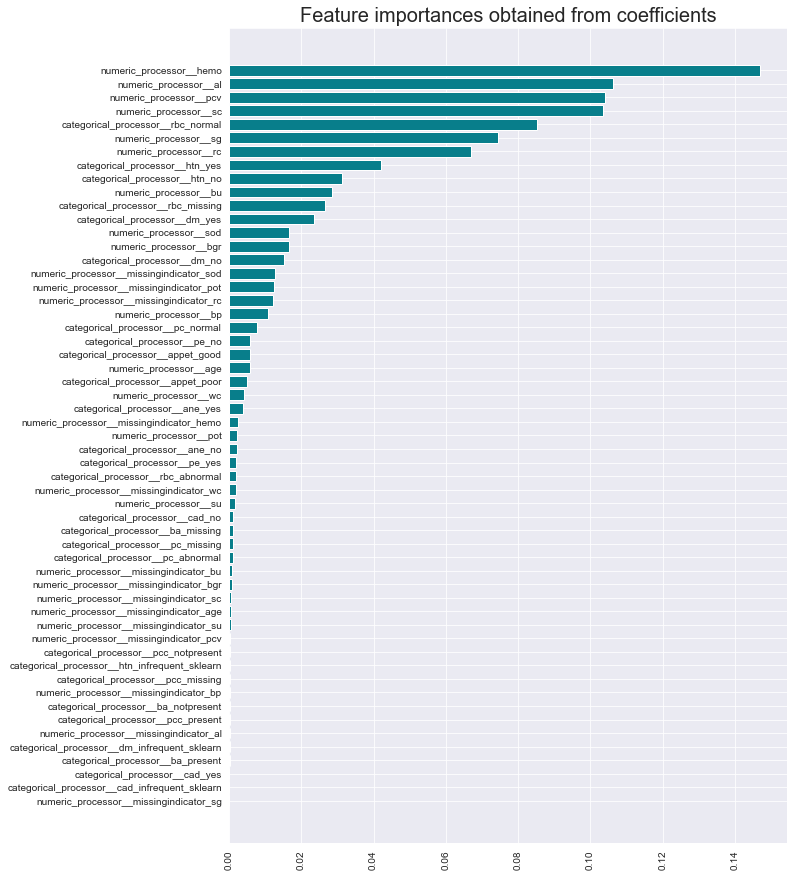

In [174]:
plt.figure(figsize = (10,15))
plt.barh(y=importances['Feature'], width=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [177]:
importances.sort_values(by='Importance', ascending=False)

,Feature,Importance
10,numeric_processor__hemo,0.147017
3,numeric_processor__al,0.106166
11,numeric_processor__pcv,0.104170
7,numeric_processor__sc,0.103562
33,categorical_processor__rbc_normal,0.085112
2,numeric_processor__sg,0.074464
13,numeric_processor__rc,0.067057
44,categorical_processor__htn_yes,0.042183
43,categorical_processor__htn_no,0.031338
6,numeric_processor__bu,0.028501


In [178]:
X_train_FE.nunique().sort_values(ascending=False)

numeric_processor__bgr                           117
numeric_processor__hemo                          103
numeric_processor__bu                             89
numeric_processor__wc                             74
numeric_processor__age                            68
numeric_processor__sc                             61
numeric_processor__rc                             44
numeric_processor__pcv                            40
numeric_processor__pot                            36
numeric_processor__sod                            31
numeric_processor__bp                              8
numeric_processor__su                              6
numeric_processor__al                              6
numeric_processor__sg                              5
categorical_processor__htn_yes                     2
categorical_processor__pc_normal                   2
categorical_processor__pcc_missing                 2
categorical_processor__pcc_notpresent              2
categorical_processor__pcc_present            

## Feature Selection

### Techniques for feature selection
1. Mutual Information - to get the feature importance 
2. Multicollinearity - to check and remove any highly correlated independent features
3. VarianceThreshold - To check and remove any low varinace continuous features

## Multicollinearity

### Correlation

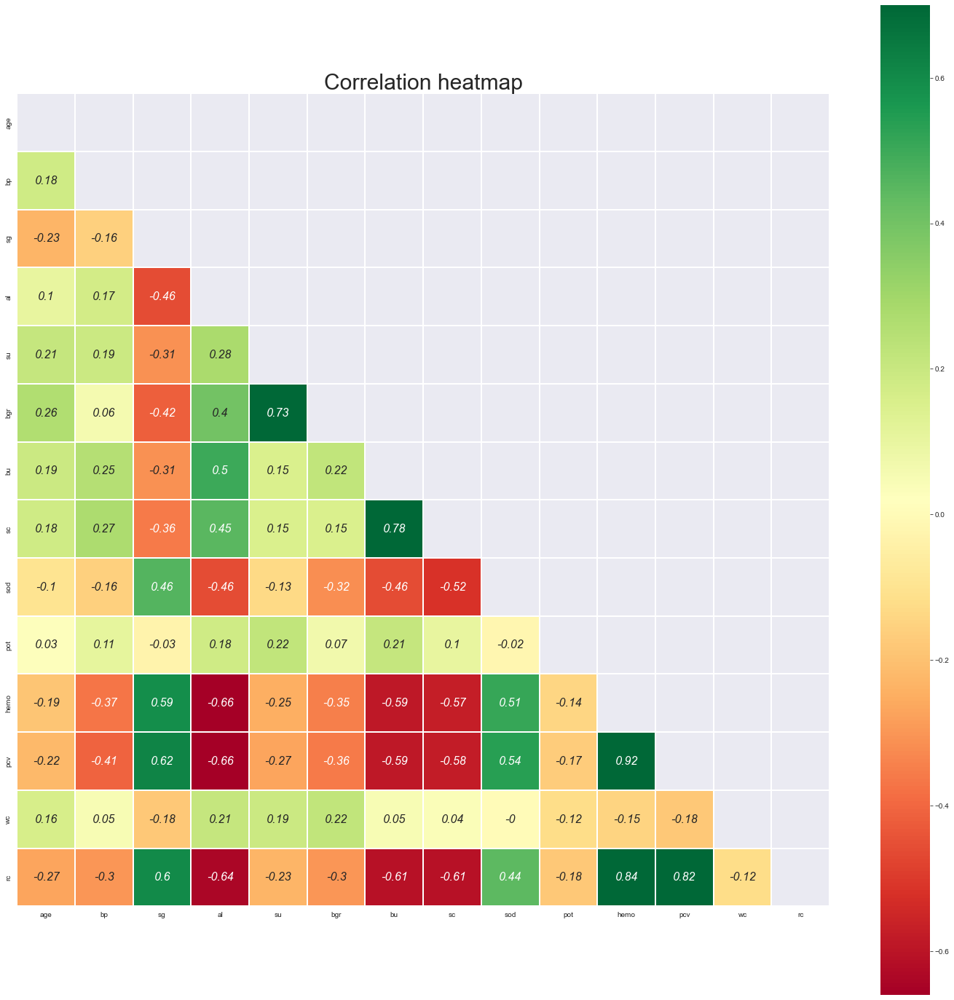

In [179]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df[numerical_features].corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df[numerical_features].corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

In [181]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [182]:
corr_features = correlation(X_train_FE, 0.8)
print(len(set(corr_features)))
print(corr_features)

15
{'numeric_processor__missingindicator_sc', 'categorical_processor__cad_yes', 'categorical_processor__ane_yes', 'numeric_processor__missingindicator_pot', 'categorical_processor__appet_poor', 'categorical_processor__htn_yes', 'categorical_processor__pcc_present', 'categorical_processor__pc_normal', 'categorical_processor__dm_yes', 'categorical_processor__ba_missing', 'categorical_processor__pe_yes', 'categorical_processor__ba_present', 'numeric_processor__missingindicator_al', 'numeric_processor__missingindicator_su', 'categorical_processor__htn_infrequent_sklearn'}


In [183]:
# See there are 15 features with correlation more than 0.8

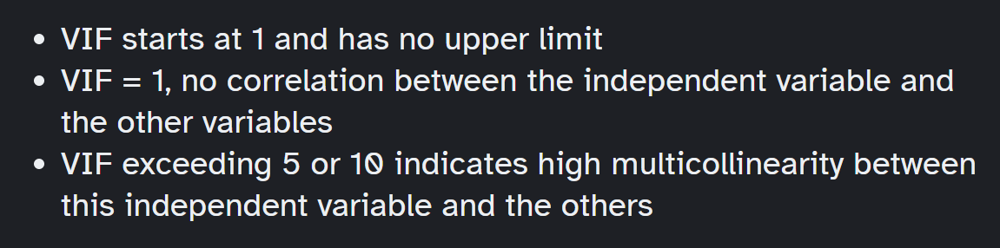

### Variance Inflation Factor (VIF)

https://www.analyticsvidhya.com/blog/2020/03/what-is-multicollinearity/

In [223]:
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_FE.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_FE.values, i) for i in range(len(X_train_FE.columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

,feature,VIF
54,categorical_processor__ane_yes,inf
16,numeric_processor__missingindicator_sg,inf
32,categorical_processor__rbc_missing,inf
31,categorical_processor__rbc_abnormal,inf
30,categorical_processor__dm_infrequent_sklearn,inf
29,categorical_processor__dm_yes,inf
28,categorical_processor__dm_no,inf
35,categorical_processor__pc_missing,inf
36,categorical_processor__pc_normal,inf
37,categorical_processor__pcc_missing,inf


###  From above we can see that VIF values of features are very high for few we will gradually remove high multicollinearity features

In [224]:
VIF_columns = ['categorical_processor__ane_yes','categorical_processor__ba_missing','categorical_processor__pcc_present',
               'categorical_processor__htn_no','categorical_processor__ba_present','numeric_processor__missingindicator_al',
               'numeric_processor__missingindicator_su','categorical_processor__pc_abnormal','categorical_processor__rbc_normal',
               'categorical_processor__dm_yes','categorical_processor__htn_infrequent_sklearn','categorical_processor__cad_yes',
               'numeric_processor__missingindicator_pot','categorical_processor__pe_yes','categorical_processor__appet_poor',
               'numeric_processor__missingindicator_bu','numeric_processor__missingindicator_rc','numeric_processor__al']

In [225]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_FE.drop(VIF_columns, axis = 1).columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_FE.drop(VIF_columns, axis = 1).values, i) for i in range(len(X_train_FE.drop(VIF_columns, axis = 1).columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

,feature,VIF
31,categorical_processor__htn_yes,4.154803
27,categorical_processor__pc_normal,4.104513
20,numeric_processor__missingindicator_pcv,4.075034
22,categorical_processor__dm_no,3.844770
9,numeric_processor__hemo,3.301861
19,numeric_processor__missingindicator_hemo,3.238478
26,categorical_processor__pc_missing,3.086524
10,numeric_processor__pcv,3.075765
3,numeric_processor__su,2.631339
33,categorical_processor__cad_infrequent_sklearn,2.466104


In [226]:
vif_data.shape

(37, 2)

In [227]:
model = RandomForestClassifier()
model.fit(X_train_FE.drop(VIF_columns, axis = 1),y_train)

RandomForestClassifier()

In [228]:
model.feature_names_in_

array(['numeric_processor__age', 'numeric_processor__bp',
       'numeric_processor__sg', 'numeric_processor__su',
       'numeric_processor__bgr', 'numeric_processor__bu',
       'numeric_processor__sc', 'numeric_processor__sod',
       'numeric_processor__pot', 'numeric_processor__hemo',
       'numeric_processor__pcv', 'numeric_processor__wc',
       'numeric_processor__rc', 'numeric_processor__missingindicator_age',
       'numeric_processor__missingindicator_bp',
       'numeric_processor__missingindicator_sg',
       'numeric_processor__missingindicator_bgr',
       'numeric_processor__missingindicator_sc',
       'numeric_processor__missingindicator_sod',
       'numeric_processor__missingindicator_hemo',
       'numeric_processor__missingindicator_pcv',
       'numeric_processor__missingindicator_wc',
       'categorical_processor__dm_no',
       'categorical_processor__dm_infrequent_sklearn',
       'categorical_processor__rbc_abnormal',
       'categorical_processor__rbc_miss

In [229]:
y_train_pred = model.predict(X_train_FE.drop(VIF_columns, axis = 1))
    
print(classification_report(y_train,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       104
           1       1.00      1.00      1.00       145

    accuracy                           1.00       249
   macro avg       1.00      1.00      1.00       249
weighted avg       1.00      1.00      1.00       249



In [230]:
y_val_pred = model.predict(X_val_FE.drop(VIF_columns, axis = 1))
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        28
           1       1.00      1.00      1.00        22

    accuracy                           1.00        50
   macro avg       1.00      1.00      1.00        50
weighted avg       1.00      1.00      1.00        50



See we are able to get 100% validation accuracy with 37 features after removing un important features

### VarianceThreshold

In [232]:
X_train_FE

,numeric_processor__age,numeric_processor__bp,numeric_processor__sg,numeric_processor__al,numeric_processor__su,numeric_processor__bgr,numeric_processor__bu,numeric_processor__sc,numeric_processor__sod,numeric_processor__pot,numeric_processor__hemo,numeric_processor__pcv,numeric_processor__wc,numeric_processor__rc,numeric_processor__missingindicator_age,numeric_processor__missingindicator_bp,numeric_processor__missingindicator_sg,numeric_processor__missingindicator_al,numeric_processor__missingindicator_su,numeric_processor__missingindicator_bgr,numeric_processor__missingindicator_bu,numeric_processor__missingindicator_sc,numeric_processor__missingindicator_sod,numeric_processor__missingindicator_pot,numeric_processor__missingindicator_hemo,numeric_processor__missingindicator_pcv,numeric_processor__missingindicator_wc,numeric_processor__missingindicator_rc,categorical_processor__dm_no,categorical_processor__dm_yes,categorical_processor__dm_infrequent_sklearn,categorical_processor__rbc_abnormal,categorical_processor__rbc_missing,categorical_processor__rbc_normal,categorical_processor__pc_abnormal,categorical_processor__pc_missing,categorical_processor__pc_normal,categorical_processor__pcc_missing,categorical_processor__pcc_notpresent,categorical_processor__pcc_present,categorical_processor__ba_missing,categorical_processor__ba_notpresent,categorical_processor__ba_present,categorical_processor__htn_no,categorical_processor__htn_yes,categorical_processor__htn_infrequent_sklearn,categorical_processor__cad_no,categorical_processor__cad_yes,categorical_processor__cad_infrequent_sklearn,categorical_processor__appet_good,categorical_processor__appet_poor,categorical_processor__pe_no,categorical_processor__pe_yes,categorical_processor__ane_no,categorical_processor__ane_yes
0,-0.184571,0.000000,0.000000,0.942484,0.000000,-0.119304,-0.173523,0.000000,0.000000,0.000000,0.752644,0.362473,-0.194665,0.483130,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-1.579443,-6.968891,0.000000,1.198223,0.000000,0.000000,-0.983528,-0.580946,0.000000,0.000000,-0.348803,-0.181357,-0.712007,0.000000,0.0,0.0,0.0,0.0,0.0,10.398675,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.460705,0.000000,-2.007298,1.000000,6.802626,1.548529,0.442887,0.311507,0.000000,0.000000,-0.825155,-0.675383,-0.240299,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,-1.0,1.0
3,-0.184571,-1.000000,-7.545810,1.198223,0.000000,-0.205503,0.541410,0.781581,-1.819169,-4.162108,-0.382900,-0.582217,-0.503308,-0.665302,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,-1.0,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0,-1.0,1.0,-1.0,1.0
4,-0.055971,0.000000,-2.007298,1.000000,0.000000,-0.365721,-0.535985,0.168687,0.000000,0.000000,-0.298959,-0.358801,-0.290881,-0.339391,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,-0.097204,0.000000,0.000000,0.000000,0.000000,0.308048,0.200605,-0.580946,0.253499,0.880845,0.387217,0.448041,0.496692,-0.339391,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
245,0.093445,0.000000,0.000000,0.000000,0.000000,0.389450,0.330240,-3.893175,3.

In [233]:
discrete_features = [feature for feature in X_train_FE.columns if len(X_train_FE[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_features)))

continuous_features=[feature for feature in X_train_FE.columns if feature not in discrete_features]
print("Continuous feature Count {}".format(len(continuous_features)))

Discrete Variables Count: 45
Continuous feature Count 10


In [234]:
discrete_features

['numeric_processor__bp',
 'numeric_processor__sg',
 'numeric_processor__al',
 'numeric_processor__su',
 'numeric_processor__missingindicator_age',
 'numeric_processor__missingindicator_bp',
 'numeric_processor__missingindicator_sg',
 'numeric_processor__missingindicator_al',
 'numeric_processor__missingindicator_su',
 'numeric_processor__missingindicator_bgr',
 'numeric_processor__missingindicator_bu',
 'numeric_processor__missingindicator_sc',
 'numeric_processor__missingindicator_sod',
 'numeric_processor__missingindicator_pot',
 'numeric_processor__missingindicator_hemo',
 'numeric_processor__missingindicator_pcv',
 'numeric_processor__missingindicator_wc',
 'numeric_processor__missingindicator_rc',
 'categorical_processor__dm_no',
 'categorical_processor__dm_yes',
 'categorical_processor__dm_infrequent_sklearn',
 'categorical_processor__rbc_abnormal',
 'categorical_processor__rbc_missing',
 'categorical_processor__rbc_normal',
 'categorical_processor__pc_abnormal',
 'categorical_p

In [235]:
continuous_features

['numeric_processor__age',
 'numeric_processor__bgr',
 'numeric_processor__bu',
 'numeric_processor__sc',
 'numeric_processor__sod',
 'numeric_processor__pot',
 'numeric_processor__hemo',
 'numeric_processor__pcv',
 'numeric_processor__wc',
 'numeric_processor__rc']

In [236]:
continuous_features

['numeric_processor__age',
 'numeric_processor__bgr',
 'numeric_processor__bu',
 'numeric_processor__sc',
 'numeric_processor__sod',
 'numeric_processor__pot',
 'numeric_processor__hemo',
 'numeric_processor__pcv',
 'numeric_processor__wc',
 'numeric_processor__rc']

In [237]:
# In this technique we will find the varince of all the features and we can remove the features which have low variance 
# by setting the threshold parameter

from sklearn.feature_selection import VarianceThreshold
var_thres=VarianceThreshold()
var_thres.fit(X_train_FE[continuous_features])

VarianceThreshold()

In [238]:
variances = pd.DataFrame(data={
    'Feature': continuous_features,
    'variance': var_thres.variances_
})
variances = variances.sort_values(by='variance', ascending=True)

In [239]:
variances

,Feature,variance
8,numeric_processor__wc,0.600137
0,numeric_processor__age,0.636102
6,numeric_processor__hemo,0.656964
9,numeric_processor__rc,0.662933
2,numeric_processor__bu,0.709610
7,numeric_processor__pcv,0.771536
5,numeric_processor__pot,0.787213
1,numeric_processor__bgr,0.866961
4,numeric_processor__sod,1.125799
3,numeric_processor__sc,1.334106


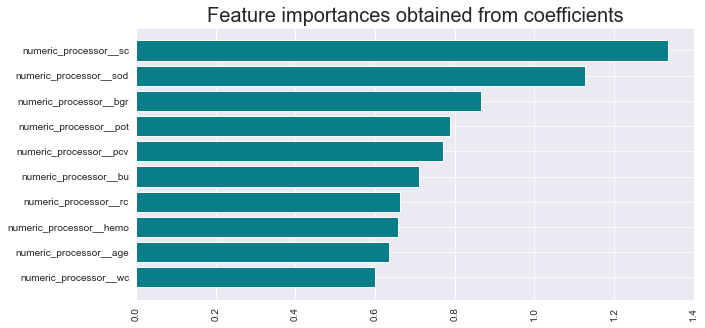

In [240]:
plt.figure(figsize = (10,5))
plt.barh(y=variances['Feature'], width=variances['variance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

### Mutual Information for Classification

In [241]:
from sklearn.feature_selection import mutual_info_classif

mutual_info = mutual_info_classif(X_train_FE, y_train)
mutual_info

array([0.05882643, 0.1278832 , 0.37272381, 0.32861267, 0.08237545,
       0.25813968, 0.15884206, 0.40576494, 0.2967855 , 0.22987612,
       0.47893827, 0.46737303, 0.06810041, 0.37122108, 0.04061791,
       0.02275328, 0.        , 0.        , 0.        , 0.0069847 ,
       0.00702333, 0.        , 0.0567672 , 0.07864152, 0.        ,
       0.01177374, 0.01929087, 0.10094921, 0.18605775, 0.22891636,
       0.01539947, 0.05350412, 0.1675876 , 0.30791675, 0.17321081,
       0.0269053 , 0.1481112 , 0.07460792, 0.03611897, 0.03039843,
       0.03109315, 0.        , 0.01901118, 0.23121689, 0.25043098,
       0.03617801, 0.04419457, 0.04966634, 0.0151821 , 0.12925519,
       0.11542086, 0.11132412, 0.15024703, 0.11600612, 0.06364888])

In [242]:
mutual_info_df = pd.DataFrame(data={
    'Feature': X_train_FE.columns,
    'MI': mutual_info
})
mutual_info_df = mutual_info_df.sort_values(by='MI', ascending=True)

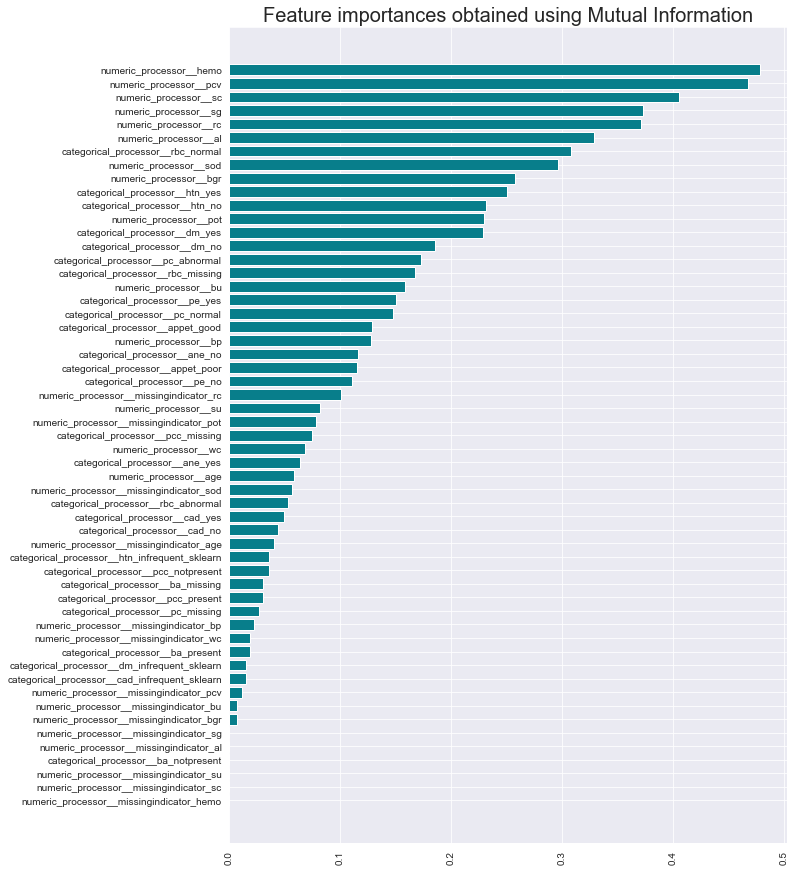

In [245]:
plt.figure(figsize = (10,15))
plt.barh(y=mutual_info_df['Feature'], width=mutual_info_df['MI'], color='#087E8B')
plt.title('Feature importances obtained using Mutual Information', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [246]:
mutual_info_df

,Feature,MI
24,numeric_processor__missingindicator_hemo,0.000000
21,numeric_processor__missingindicator_sc,0.000000
18,numeric_processor__missingindicator_su,0.000000
41,categorical_processor__ba_notpresent,0.000000
17,numeric_processor__missingindicator_al,0.000000
16,numeric_processor__missingindicator_sg,0.000000
19,numeric_processor__missingindicator_bgr,0.006985
20,numeric_processor__missingindicator_bu,0.007023
25,numeric_processor__missingindicator_pcv,0.011774
48,categorical_processor__cad_infrequent_sklearn,0.015182


In [247]:
mutual_info_df['Feature'].values[:6]

array(['numeric_processor__missingindicator_hemo',
       'numeric_processor__missingindicator_sc',
       'numeric_processor__missingindicator_su',
       'categorical_processor__ba_notpresent',
       'numeric_processor__missingindicator_al',
       'numeric_processor__missingindicator_sg'], dtype=object)

We can see from above that the below features have zero importnace

['numeric_processor__missingindicator_hemo',
       'numeric_processor__missingindicator_sc',
       'numeric_processor__missingindicator_su',
       'categorical_processor__ba_notpresent',
       'numeric_processor__missingindicator_al',
       'numeric_processor__missingindicator_sg']

In [250]:
mutual_info_df['Feature'].values[-10:]

array(['categorical_processor__htn_yes', 'numeric_processor__bgr',
       'numeric_processor__sod', 'categorical_processor__rbc_normal',
       'numeric_processor__al', 'numeric_processor__rc',
       'numeric_processor__sg', 'numeric_processor__sc',
       'numeric_processor__pcv', 'numeric_processor__hemo'], dtype=object)

In [251]:
X_train_FE

,numeric_processor__age,numeric_processor__bp,numeric_processor__sg,numeric_processor__al,numeric_processor__su,numeric_processor__bgr,numeric_processor__bu,numeric_processor__sc,numeric_processor__sod,numeric_processor__pot,numeric_processor__hemo,numeric_processor__pcv,numeric_processor__wc,numeric_processor__rc,numeric_processor__missingindicator_age,numeric_processor__missingindicator_bp,numeric_processor__missingindicator_sg,numeric_processor__missingindicator_al,numeric_processor__missingindicator_su,numeric_processor__missingindicator_bgr,numeric_processor__missingindicator_bu,numeric_processor__missingindicator_sc,numeric_processor__missingindicator_sod,numeric_processor__missingindicator_pot,numeric_processor__missingindicator_hemo,numeric_processor__missingindicator_pcv,numeric_processor__missingindicator_wc,numeric_processor__missingindicator_rc,categorical_processor__dm_no,categorical_processor__dm_yes,categorical_processor__dm_infrequent_sklearn,categorical_processor__rbc_abnormal,categorical_processor__rbc_missing,categorical_processor__rbc_normal,categorical_processor__pc_abnormal,categorical_processor__pc_missing,categorical_processor__pc_normal,categorical_processor__pcc_missing,categorical_processor__pcc_notpresent,categorical_processor__pcc_present,categorical_processor__ba_missing,categorical_processor__ba_notpresent,categorical_processor__ba_present,categorical_processor__htn_no,categorical_processor__htn_yes,categorical_processor__htn_infrequent_sklearn,categorical_processor__cad_no,categorical_processor__cad_yes,categorical_processor__cad_infrequent_sklearn,categorical_processor__appet_good,categorical_processor__appet_poor,categorical_processor__pe_no,categorical_processor__pe_yes,categorical_processor__ane_no,categorical_processor__ane_yes
0,-0.184571,0.000000,0.000000,0.942484,0.000000,-0.119304,-0.173523,0.000000,0.000000,0.000000,0.752644,0.362473,-0.194665,0.483130,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-1.579443,-6.968891,0.000000,1.198223,0.000000,0.000000,-0.983528,-0.580946,0.000000,0.000000,-0.348803,-0.181357,-0.712007,0.000000,0.0,0.0,0.0,0.0,0.0,10.398675,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.460705,0.000000,-2.007298,1.000000,6.802626,1.548529,0.442887,0.311507,0.000000,0.000000,-0.825155,-0.675383,-0.240299,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,-1.0,1.0
3,-0.184571,-1.000000,-7.545810,1.198223,0.000000,-0.205503,0.541410,0.781581,-1.819169,-4.162108,-0.382900,-0.582217,-0.503308,-0.665302,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,-1.0,1.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0,-1.0,1.0,-1.0,1.0
4,-0.055971,0.000000,-2.007298,1.000000,0.000000,-0.365721,-0.535985,0.168687,0.000000,0.000000,-0.298959,-0.358801,-0.290881,-0.339391,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,10.398675,10.398675,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,-0.097204,0.000000,0.000000,0.000000,0.000000,0.308048,0.200605,-0.580946,0.253499,0.880845,0.387217,0.448041,0.496692,-0.339391,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
245,0.093445,0.000000,0.000000,0.000000,0.000000,0.389450,0.330240,-3.893175,3.

In [273]:
X_train_FE[mutual_info_df['Feature'].values[-5:]]

,numeric_processor__rc,numeric_processor__sg,numeric_processor__sc,numeric_processor__pcv,numeric_processor__hemo
0,0.483130,0.000000,0.000000,0.362473,0.752644
1,0.000000,0.000000,-0.580946,-0.181357,-0.348803
2,0.000000,-2.007298,0.311507,-0.675383,-0.825155
3,-0.665302,-7.545810,0.781581,-0.582217,-0.382900
4,-0.339391,-2.007298,0.168687,-0.358801,-0.298959
...,...,...,...,...,...
244,-0.339391,0.000000,-0.580946,0.448041,0.387217
245,0.296471,0.000000,-3.893175,0.549447,0.853530
246,1.267419,6.784086,0.000000,3.853904,1.147998
247,0.606317,0.000000,-0.984462,0.773027,0.890823


In [269]:
model = RandomForestClassifier()
model.fit(X_train_FE[mutual_info_df['Feature'].values[-5:]],y_train)

RandomForestClassifier()

In [270]:
model.feature_names_in_

array(['numeric_processor__rc', 'numeric_processor__sg',
       'numeric_processor__sc', 'numeric_processor__pcv',
       'numeric_processor__hemo'], dtype=object)

In [271]:
y_train_pred = model.predict(X_train_FE[mutual_info_df['Feature'].values[-5:]])
    
print(classification_report(y_train,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       104
           1       1.00      1.00      1.00       145

    accuracy                           1.00       249
   macro avg       1.00      1.00      1.00       249
weighted avg       1.00      1.00      1.00       249



In [272]:
y_val_pred = model.predict(X_val_FE[mutual_info_df['Feature'].values[-5:]])
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        28
           1       1.00      1.00      1.00        22

    accuracy                           1.00        50
   macro avg       1.00      1.00      1.00        50
weighted avg       1.00      1.00      1.00        50



See we are able to get 100% validation accuracy with top 5 features from Mutual Information gain technique

## PCA

In [274]:
# We are not doing PCA here becoz with feature selection we are able to acheive 100% validation accuracy.

## Building the final Model

In [282]:
X_train_FE[mutual_info_df['Feature'].values[-5:]]

,numeric_processor__rc,numeric_processor__sg,numeric_processor__sc,numeric_processor__pcv,numeric_processor__hemo
0,0.483130,0.000000,0.000000,0.362473,0.752644
1,0.000000,0.000000,-0.580946,-0.181357,-0.348803
2,0.000000,-2.007298,0.311507,-0.675383,-0.825155
3,-0.665302,-7.545810,0.781581,-0.582217,-0.382900
4,-0.339391,-2.007298,0.168687,-0.358801,-0.298959
...,...,...,...,...,...
244,-0.339391,0.000000,-0.580946,0.448041,0.387217
245,0.296471,0.000000,-3.893175,0.549447,0.853530
246,1.267419,6.784086,0.000000,3.853904,1.147998
247,0.606317,0.000000,-0.984462,0.773027,0.890823


In [283]:
best_features = ['rc','sg','sc','pcv','hemo']

In [284]:
X_train[best_features]

,rc,sg,sc,pcv,hemo
0,5.2,1.020,1.2,44.0,15.4
1,NaN,1.020,0.8,38.0,11.3
2,NaN,1.010,1.8,31.0,9.6
3,3.9,1.005,3.8,32.0,11.2
4,4.6,1.010,1.4,35.0,11.6
...,...,...,...,...,...
244,4.6,1.020,0.8,45.0,14.1
245,4.9,1.020,0.5,47.0,15.7
246,6.2,1.025,1.2,54.0,16.5
247,5.4,1.020,0.6,49.0,15.8


In [285]:
y_train

0      1
1      1
2      1
3      1
4      1
      ..
244    0
245    0
246    0
247    0
248    0
Name: target, Length: 249, dtype: int64

In [289]:
numerical_features = best_features
categorical_features = []

In [290]:
numeric_processor=Pipeline([("imputation_mean",SimpleImputer(strategy='median',add_indicator=True)),
                           ("quantiletransformer",QuantileTransformer(output_distribution='normal'))])

categorical_processor=Pipeline([("imputation_consatnt",SimpleImputer(fill_value="missing",strategy="constant")),
                                ("onehotencoder",OneHotEncoder(handle_unknown='ignore',sparse_output=False,min_frequency=0.01,max_categories=15))])

preprocessor=ColumnTransformer([("numeric_processor",numeric_processor,numerical_features),
                               ("categorical_processor",categorical_processor,categorical_features)])

final_pipe=Pipeline([("preprocessor",preprocessor),
                     ("scaler",RobustScaler())])

In [291]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['rc', 'sg', 'sc', 'pcv',
                                                   'hemo']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  [])])),
                ('scaler', RobustScaler())])

In [292]:
model=Pipeline([("final_pipe",final_pipe),
                ("clf",RandomForestClassifier())])

In [293]:
model.fit(X_train[best_features],y_train)

Pipeline(steps=[('final_pipe',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(transformers=[('numeric_processor',
                                                                   Pipeline(steps=[('imputation_mean',
                                                                                    SimpleImputer(add_indicator=True,
                                                                                                  strategy='median')),
                                                                                   ('quantiletransformer',
                                                                                    QuantileTransformer(output_distribution='normal'))]),
                                                                   ['rc', 'sg',
                                                                    'sc', 'pcv',
                                                                    'hemo']),
                                                                  ('categorical_processor',
                                                                   Pipeline(steps=[('imputation_consatnt',
                                                                                    SimpleImputer(fill_value='missing',
                                                                                                  strategy='constant')),
                                                                                   ('onehotencoder',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  max_categories=15,
                                                                                                  min_frequency=0.01,
                                                                                                  sparse_output=False))]),
                                                                   [])])),
                                 ('scaler', RobustScaler())])),
                ('clf', RandomForestClassifier())])

In [294]:
y_train_pred = model.predict(X_train)
train_score = accuracy_score(y_train,y_train_pred)
    
precision = precision_score(y_train,y_train_pred,average='macro')
recall = recall_score(y_train,y_train_pred,average='macro')
f1 = f1_score(y_train,y_train_pred,average='macro')
    
print(classification_report(y_train,y_train_pred))
    
y_val_pred = model.predict(X_val)

print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       104
           1       1.00      1.00      1.00       145

    accuracy                           1.00       249
   macro avg       1.00      1.00      1.00       249
weighted avg       1.00      1.00      1.00       249

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        28
           1       1.00      1.00      1.00        22

    accuracy                           1.00        50
   macro avg       1.00      1.00      1.00        50
weighted avg       1.00      1.00      1.00        50



In [304]:
y_test_pred = model.predict(X_test)

print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.95      1.00      0.97        18
           1       1.00      0.97      0.98        32

    accuracy                           0.98        50
   macro avg       0.97      0.98      0.98        50
weighted avg       0.98      0.98      0.98        50



### Save Trained Model Using joblib

In [295]:
import joblib

In [296]:
joblib.dump(model, '../Models/kidney_model')

['../Models/kidney_model']

### Load Saved Model

In [297]:
model = joblib.load('../Models/kidney_model')

In [298]:
X_test.columns

Index(['age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr', 'bu',
       'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad',
       'appet', 'pe', 'ane'],
      dtype='object')

In [299]:
X_test.head(2)

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane
0,48.0,80.0,1.005,4.0,0.0,abnormal,abnormal,notpresent,present,133.0,139.0,8.5,132.0,5.5,10.3,36.0,6200.0,4.0,no,yes,no,good,yes,no
1,62.0,70.0,1.025,3.0,0.0,normal,abnormal,notpresent,notpresent,122.0,42.0,1.7,136.0,4.7,12.6,39.0,7900.0,3.9,yes,yes,no,good,no,no


In [300]:
y_test[:2]

0    1
1    1
Name: target, dtype: int64

In [301]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['rc', 'sg', 'sc', 'pcv',
                                                   'hemo']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  [])])),
                ('scaler', RobustScaler())])

In [302]:
model.predict(X_test.head(5))

array([1, 1, 1, 1, 0], dtype=int64)

In [303]:
y_test[:5]

0    1
1    1
2    1
3    1
4    0
Name: target, dtype: int64

In [ ]:
# The below is the sample code to deploy this model using Gradio. you can tweek the below code for this project needs and deploy it.

In [209]:
X_train.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [ ]:
1. num_preg - Number of times pregnant
2. glucose_conc - Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. diastolic_bp - Diastolic blood pressure (mm Hg)
4. thickness - Triceps skin fold thickness (mm)
5. insulin - 2-Hour serum insulin (mu U/ml)
6. bmi - Body mass index (weight in kg/(height in m)^2)
7. diab_pred - Diabetes pedigree function
8. age - Age (years)
9. skin - 
10. target - class

In [ ]:
train_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']].describe().T

## Gradio deployment

In [ ]:
import gradio as gr
import random
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from datasets import load_dataset


matplotlib.use("Agg")
df = pd.read_csv('train_df.csv')
X_train = df.drop('target',axis=1)
y_train = df['target']



def predict(*args):
    df = pd.DataFrame([args], columns=X_train.columns)
    result = pipe_xgb.predict(final_pipe.transform(df))
    output = 'diabetic' if result[0]==1 else 'no diabetic' 
    return output



with gr.Blocks() as demo:
    gr.Markdown("""
    **Indian Loan Default Prediction **:  This demo uses an Random Forest classifier predicts loan default based on demographic factors.
    """)
    with gr.Row():
        with gr.Column():
            Pregnancies = gr.Slider(label="No.of Pregnensis", minimum=0, maximum=20, step=1, randomize=True)
            Glucose = gr.Slider(label="Glucose", minimum=0, maximum=400, step=1, randomize=True)
            BloodPressure = gr.Slider(label="blood pressure (mm Hg)", minimum=0, maximum=200, step=1, randomize=True)
            SkinThickness = gr.Slider(label="Triceps skin fold thickness (mm)", minimum=0, maximum=100, step=1, randomize=True)
            Insulin = gr.Slider(label="2-Hour serum insulin (mu U/ml)", minimum=0, maximum=1000, step=1, randomize=True)
            BMI = gr.Slider(label="Body mass index", minimum=0, maximum=100, step=0.5, randomize=True)
            DiabetesPedigreeFunction = gr.Slider(label="Diabetes pedigree function", minimum=0, maximum=10, step=0.5, randomize=True)
            Age = gr.Slider(label="Age", minimum=0, maximum=150, step=1, randomize=True)
            
            
        with gr.Column():
            label = gr.Label()
            with gr.Row():
                predict_btn = gr.Button(value="Predict")
            predict_btn.click(
                predict,
                inputs=[
                    Pregnancies,
                    Glucose,
                    BloodPressure,
                    SkinThickness,
                    Insulin,
                    BMI,
                    DiabetesPedigreeFunction,
                    Age,
                ],
                outputs=[label],
            )

demo.launch()

In [ ]:
demo.close()

In [211]:
X_train

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
663,9,89,62,0,0,22.5,0.142,33
664,10,101,76,48,180,32.9,0.171,63
665,2,122,70,27,0,36.8,0.340,27
666,1,126,60,0,0,30.1,0.349,47


In [213]:
zeros_count = {}

for col in X_train.columns:
    if col == 'target':
        continue
    count = (X_train[col] == 0).sum()
    zeros_count[col]=count
df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = (df_zeros['zeros']/len(X_train))*100
df_zeros.sort_values(by=['zeros'],ascending=False)

,zeros,Percent
Insulin,316,47.305389
SkinThickness,194,29.041916
Pregnancies,97,14.520958
BloodPressure,31,4.640719
BMI,11,1.646707
Glucose,3,0.449102
DiabetesPedigreeFunction,0,0.000000
Age,0,0.000000


In [216]:
X_train[['Glucose','BloodPressure','SkinThickness','BMI','Age']] = X_train[['Glucose','BloodPressure','SkinThickness','BMI','Age']].replace({0:np.nan})

In [217]:
zeros_count = {}

for col in X_train.columns:
    if col == 'target':
        continue
    count = (X_train[col] == 0).sum()
    zeros_count[col]=count
df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = (df_zeros['zeros']/len(X_train))*100
df_zeros.sort_values(by=['zeros'],ascending=False)

,zeros,Percent
Insulin,316,47.305389
Pregnancies,97,14.520958
Glucose,0,0.000000
BloodPressure,0,0.000000
SkinThickness,0,0.000000
BMI,0,0.000000
DiabetesPedigreeFunction,0,0.000000
Age,0,0.000000


In [218]:
X_train.isna().sum()

Pregnancies                   0
Glucose                       3
BloodPressure                31
SkinThickness               194
Insulin                       0
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
dtype: int64

In [219]:
X_train

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.0,0,33.6,0.627,50
1,1,85.0,66.0,29.0,0,26.6,0.351,31
2,8,183.0,64.0,NaN,0,23.3,0.672,32
3,1,89.0,66.0,23.0,94,28.1,0.167,21
4,0,137.0,40.0,35.0,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
663,9,89.0,62.0,NaN,0,22.5,0.142,33
664,10,101.0,76.0,48.0,180,32.9,0.171,63
665,2,122.0,70.0,27.0,0,36.8,0.340,27
666,1,126.0,60.0,NaN,0,30.1,0.349,47


In [220]:
y_train

0      1
1      0
2      1
3      0
4      1
      ..
663    0
664    0
665    0
666    1
667    0
Name: target, Length: 668, dtype: int64

In [221]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_res, y_res = smote.fit_resample(X_train, y_train)

ValueError: Input X contains NaN.
SMOTE does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values